In [ ]:
import pandas as pd
import numpy as np

In [ ]:
raw_df1 = pd.read_csv('data1.csv', delimiter=';', engine = 'python')

In [ ]:
raw_df2 = pd.read_csv('data2.csv', delimiter=';', engine = 'python')

In [ ]:
raw_df1["Week Ending Date"] = raw_df1["Week Ending Date"].str.replace(".", "/", regex=False)
raw_df1["Week Ending Date"] = pd.to_datetime(raw_df1["Week Ending Date"], format="%m/%d/%Y", errors="coerce")

In [ ]:
raw_df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16902 entries, 0 to 16901
Data columns (total 30 columns):
 #   Column                                                                                             Non-Null Count  Dtype         
---  ------                                                                                             --------------  -----         
 0   Jurisdiction of Occurrence                                                                         16902 non-null  object        
 1   MMWR Year                                                                                          16902 non-null  int64         
 2   MMWR Week                                                                                          16902 non-null  int64         
 3   Week Ending Date                                                                                   16902 non-null  datetime64[ns]
 4   All  Cause                                                                  

In [ ]:
raw_df2["Week Ending Date"] = raw_df2["Week Ending Date"].str.replace(".", "/", regex=False)
raw_df2["Week Ending Date"] = pd.to_datetime(raw_df2["Week Ending Date"], format="%d/%m/%Y", errors="coerce")

In [ ]:
raw_df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10476 entries, 0 to 10475
Data columns (total 35 columns):
 #   Column                                                                                             Non-Null Count  Dtype         
---  ------                                                                                             --------------  -----         
 0   Data As Of                                                                                         10476 non-null  object        
 1   Jurisdiction of Occurrence                                                                         10476 non-null  object        
 2   MMWR Year                                                                                          10476 non-null  int64         
 3   MMWR Week                                                                                          10476 non-null  int64         
 4   Week Ending Date                                                            

In [ ]:
"""!pip install numba==0.53.1
!pip install ydata-profiling
!pip install visions --upgrade
!pip install ydata-profiling --upgrade"""

'!pip install numba==0.53.1\n!pip install ydata-profiling\n!pip install visions --upgrade\n!pip install ydata-profiling --upgrade'

In [ ]:
from ydata_profiling import ProfileReport

profile = ProfileReport(raw_df1)
profile.to_notebook_iframe

'from ydata_profiling import ProfileReport\n\nprofile = ProfileReport(raw_df1)\nprofile.to_notebook_iframe()'

In [ ]:
profile = ProfileReport(raw_df2)
profile.to_notebook_iframe()


'profile = ProfileReport(raw_df2)\nprofile.to_notebook_iframe()\n'

In [ ]:
columns_to_hold_df1 = ['Jurisdiction of Occurrence', 'MMWR Year', 'MMWR Week',
       'Week Ending Date', 'Septicemia (A40-A41)', 'Malignant neoplasms (C00-C97)',
       'Diabetes mellitus (E10-E14)', 'Alzheimer disease (G30)',
       'Influenza and pneumonia (J10-J18)',
       'Chronic lower respiratory diseases (J40-J47)',
       'Other diseases of respiratory system (J00-J06,J30-J39,J67,J70-J98)',
       'Nephritis, nephrotic syndrome and nephrosis (N00-N07,N17-N19,N25-N27)',
       'Symptoms, signs and abnormal clinical and laboratory findings, not elsewhere classified (R00-R99)',
       'Diseases of heart (I00-I09,I11,I13,I20-I51)',
       'Cerebrovascular diseases (I60-I69)']

In [ ]:
new_df1 = raw_df1[columns_to_hold_df1]
new_df1.head()

In [ ]:
columns_to_hold_df2 = ['Jurisdiction of Occurrence', 'MMWR Year', 'MMWR Week',
       'Week Ending Date', 'Septicemia (A40-A41)', 'Malignant neoplasms (C00-C97)',
       'Diabetes mellitus (E10-E14)', 'Alzheimer disease (G30)',
       'Influenza and pneumonia (J09-J18)',
       'Chronic lower respiratory diseases (J40-J47)',
       'Other diseases of respiratory system (J00-J06,J30-J39,J67,J70-J98)',
       'Nephritis, nephrotic syndrome and nephrosis (N00-N07,N17-N19,N25-N27)',
       'Symptoms, signs and abnormal clinical and laboratory findings, not elsewhere classified (R00-R99)',
       'Diseases of heart (I00-I09,I11,I13,I20-I51)',
       'Cerebrovascular diseases (I60-I69)', 'COVID-19 (U071, Multiple Cause of Death)',
       'COVID-19 (U071, Underlying Cause of Death)' ]

In [ ]:
new_df2 = raw_df2[columns_to_hold_df2]
new_df2.head()

In [ ]:
new_df1.columns = new_df1.columns.str.replace(r"\s*\(.*?\)", "", regex=True).str.strip()
new_df1.head()

In [ ]:
new_df1.shape


In [ ]:
import re

new_df2.columns = [re.sub(r"\s*\(.*?\)", "", col).strip() if i < len(new_df2.columns) - 2 else col for i, col in enumerate(new_df2.columns)]
new_df2.head()

In [ ]:
new_df2.shape

In [ ]:
new_df1["COVID-19 (U071, Multiple Cause of Death)"] = np.nan
new_df1["COVID-19 (U071, Underlying Cause of Death)"] = np.nan

new_df1 = new_df1[new_df2.columns]

merged_df = pd.concat([new_df1, new_df2], axis=0, ignore_index=True)

In [ ]:
merged_df.head()

In [ ]:
merged_df.shape

In [ ]:
"""
from google.colab import files
files.download('duzenlenmis_veri.csv')
"""

In [ ]:
copy_merged = merged_df.copy()

In [ ]:
copy_merged.set_index('Week Ending Date', inplace=True)

In [ ]:
copy_merged.head()

In [ ]:
disease_columns = copy_merged.select_dtypes(include = ['float64']).columns

In [ ]:

from scipy import stats
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def remove_outliers_knn_zscore(df, columns, z_thresh=2, n_neighbors=5):
    df_clean = df.copy()

    for col in columns:
        if df_clean[col].dtype == 'object':
            df_clean[col] = df_clean[col].str.replace(',', '', regex=False).astype(float)
        else:
            df_clean[col] = pd.to_numeric(df_clean[col], errors='coerce')

    for col in columns:
        if df_clean[col].dtype.kind == 'f':
            z_scores = np.abs(stats.zscore(df_clean[col], nan_policy='omit'))
            df_clean.loc[z_scores > z_thresh, col] = np.nan

    return df_clean


disease_columns = copy_merged.select_dtypes(include=np.number).columns.tolist()

copy_merged = remove_outliers_knn_zscore(copy_merged, disease_columns)

print(copy_merged)



In [ ]:
print(copy_merged.index.all)

In [ ]:
print(copy_merged.columns)



In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore

disease_columns = [
    "Septicemia",
    "Malignant neoplasms",
    "Diabetes mellitus",
    "Alzheimer disease",
    "Influenza and pneumonia",
    "Chronic lower respiratory diseases",
    "Other diseases of respiratory system",
    "Nephritis, nephrotic syndrome and nephrosis",
    "Symptoms, signs and abnormal clinical and laboratory findings, not elsewhere classified",
    "Diseases of heart",
    "Cerebrovascular diseases"
]

for col in disease_columns:
    if copy_merged[col].dtype == 'object':
        copy_merged[col] = copy_merged[col].str.replace(',', '', regex=False).astype(float)
    else:
        copy_merged[col] = pd.to_numeric(copy_merged[col], errors='coerce')

if not isinstance(copy_merged.index, pd.DatetimeIndex):
    copy_merged.index = pd.to_datetime(copy_merged.index, errors='coerce')


filled_copy_merged = copy_merged.copy()

for col in disease_columns:
    temp = filled_copy_merged[[col]].groupby(filled_copy_merged.index).mean()
    temp = temp.rolling(10, min_periods=1, center=True).mean()
    filled_copy_merged[col] = filled_copy_merged.index.map(temp[col])

plot_df = filled_copy_merged[disease_columns].groupby(filled_copy_merged.index).mean()

fig, axes = plt.subplots(len(disease_columns), 1, figsize=(12, 2.5*len(disease_columns)))
sns.set_style("darkgrid")

for i, column in enumerate(disease_columns):
    sns.lineplot(x=plot_df.index, y=plot_df[column], marker='o', ax=axes[i])
    axes[i].set_title(column)
    axes[i].set_ylabel("Number of Cases")
    axes[i].set_xlabel("Week Ending Date")

plt.tight_layout()
plt.show()

In [ ]:
print(copy_merged.columns.tolist())

In [ ]:
def find_all_outliers(df, columns, threshold=3):
    outliers_dict = {}

    for col in columns:
        if col in df.columns and df[col].dtype.kind in 'f':  # sadece float kolonlar
            z_scores = zscore(df[col], nan_policy='omit')    # Z-score ile outlier tespiti
            mask = (np.abs(z_scores) > threshold) & ~df[col].isna()  # NaN'leri atla

            # True olan satırların indexlerini al
            outlier_indices = df.index[mask].tolist()
            outliers_dict[col] = outlier_indices

    return outliers_dict

In [ ]:
outliers_dict = find_all_outliers(filled_copy_merged, disease_columns)

for disease, outlier_list in outliers_dict.items():
     print(f"{disease}: {len(outlier_list)} outliers found.")

In [ ]:
filled_copy_merged.index

In [ ]:
states_list = copy_merged['Jurisdiction of Occurrence'].dropna().unique().tolist()
print(states_list)

In [ ]:
import ipywidgets as widgets
from IPython.display import display

unique_jurisdiction2 = [
    'United States', 'Alabama', 'Alaska', 'Arizona', 'Arkansas',
    'California', 'Colorado', 'Connecticut', 'Delaware',
    'District of Columbia', 'Florida', 'Georgia', 'Hawaii', 'Idaho',
    'Illinois', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Louisiana',
    'Maine', 'Maryland', 'Massachusetts', 'Michigan', 'Minnesota',
    'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada',
    'New Hampshire', 'New Jersey', 'New Mexico', 'New York',
    'New York City', 'North Carolina', 'North Dakota', 'Ohio',
    'Oklahoma', 'Oregon', 'Pennsylvania', 'Rhode Island',
    'South Carolina', 'South Dakota', 'Tennessee', 'Texas', 'Utah',
    'Vermont', 'Virginia', 'Washington', 'West Virginia', 'Wisconsin',
    'Wyoming', 'Puerto Rico'
]

dropdown = widgets.Dropdown(
    options=unique_jurisdiction2,
    description='State',
    style={'description_width': 'initial'},
    layout=widgets.Layout(width='50%')
)

display(dropdown)


def on_button_clicked(b):
    global state
    state = dropdown.value
    print("Seçilen eyalet:", state)

button = widgets.Button(description="Seçimi Göster")
button.on_click(on_button_clicked)
display(button)

In [ ]:
import ipywidgets as widgets
from IPython.display import display
import datetime

# Tarih seçici widget
date_picker = widgets.DatePicker(
    description='Tarih Seç:',
    disabled=False
)

display(date_picker)

def on_button_clicked(b):
    global selected_date
    selected_date = date_picker.value
    if selected_date is not None:
        selected_year = selected_date.year
        if 2014 <= selected_year <= 2023:
            print("Seçilen tarih:", selected_date.strftime("%m-%d-%Y"))
        else:
            print("Hatalı seçim! Lütfen 2014 ile 2023 arası bir yıl seçin.")
    else:
        print("Henüz bir tarih seçilmedi.")

button = widgets.Button(description="Tarihi Göster")
button.on_click(on_button_clicked)
display(button)

In [ ]:
print(selected_date)
print(state)

In [ ]:
merged_df.head

In [ ]:
import pandas as pd

def filter_records_by_date_and_jurisdiction(df, user_date, user_jurisdiction):
    # Kullanıcının verdiği tarih aralığını hesapla
    start_date = (pd.to_datetime(user_date) - pd.Timedelta(days=7)).date()
    end_date = pd.to_datetime(user_date).date()

    print(start_date)
    print(end_date)
    print(df['Week Ending Date'])
    # DataFrame'deki 'Week Ending Date' kolonunu da sadece date yapmamız lazım
    df['Week Ending Date'] = pd.to_datetime(df['Week Ending Date']).dt.date
    print(df['Week Ending Date'])
    # Filtreleme işlemi
    filtered_df = df[
        (df['Week Ending Date'] >= start_date) &
        (df['Week Ending Date'] <= end_date) &
        (df['Jurisdiction of Occurrence'] == user_jurisdiction)
    ]

    return filtered_df


In [ ]:
state_dfs = {} ##BÜTÜN EYALETLERE GÖRE YAPTIK
for state in states_list:
        filtered_df = filled_copy_merged[filled_copy_merged['Jurisdiction of Occurrence'] == state]
        state_dfs[state] = filtered_df

In [ ]:
infectious_disease_dfs = {}

for state, df in state_dfs.items():
    # Bırakılacak sütunlar
    infectious_cols = [
        'Septicemia',
        'Influenza and pneumonia',
        'COVID-19 (U071, Multiple Cause of Death)',
        'COVID-19 (U071, Underlying Cause of Death)',
        'MMWR Year',
        'Week Ending Date',
        'Jurisdiction of Occurrence'
    ]

    # Sadece df içinde olan kolonları seç
    infectious_cols_in_df = [col for col in infectious_cols if col in df.columns]

    # Yeni küçük dataframe
    infectious_df = df[infectious_cols_in_df].copy()

    # 1. Septicemia NaN'leri sütun ortalamasıyla doldur
    if 'Septicemia' in infectious_df.columns:
        infectious_df['Septicemia'] = pd.to_numeric(infectious_df['Septicemia'], errors='coerce')
        septicemia_mean = infectious_df['Septicemia'].mean()
        infectious_df['Septicemia'] = infectious_df['Septicemia'].fillna(septicemia_mean)

    # 2. Influenza NaN'leri sütun ortalamasıyla doldur
    if 'Influenza and pneumonia' in infectious_df.columns:
        infectious_df['Influenza and pneumonia'] = pd.to_numeric(infectious_df['Influenza and pneumonia'], errors='coerce')
        influenza_mean = infectious_df['Influenza and pneumonia'].mean()
        infectious_df['Influenza and pneumonia'] = infectious_df['Influenza and pneumonia'].fillna(influenza_mean)

    # 3. COVID kolonlarındaki NaN'leri 0 ile doldur
    covid_cols = ['COVID-19 (U071, Multiple Cause of Death)', 'COVID-19 (U071, Underlying Cause of Death)']

    for col in covid_cols:
        if col in infectious_df.columns:
            infectious_df[col] = pd.to_numeric(infectious_df[col], errors='coerce')
            infectious_df[col] = infectious_df[col].fillna(0)

    # 4. Temiz veriyi kaydet
    infectious_disease_dfs[state] = infectious_df

    # Formatlı yazdır
    print(f"\n🦠 Infectious Disease Data for State: {state}\n")
    print(infectious_df.to_string(index=False))
    print("\n" + "="*100 + "\n")


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Disease columns of interest
disease_columns = [
    "Septicemia",
    "Influenza and pneumonia",
    "COVID-19 (U071, Multiple Cause of Death)",
    "COVID-19 (U071, Underlying Cause of Death)"
]

# Process and visualize data for each state
for state, df in infectious_disease_dfs.items():
    print(f"State: {state}")

    # Format date column and set as index if it exists
    if "Week Ending Date" in df.columns:
        df = df.copy()  # Create a copy to avoid modifying the original
        df["Week Ending Date"] = pd.to_datetime(df["Week Ending Date"], errors='coerce')
        df = df.set_index("Week Ending Date")

        # Apply rolling average to each disease column
        for col in disease_columns:
            if col in df.columns:
                # Apply 10-week rolling average
                df[f"{col}_smoothed"] = df[col].rolling(10, min_periods=1, center=True).mean()

        # Create histograms for each disease
        fig, axes = plt.subplots(len(disease_columns), 1, figsize=(12, 3*len(disease_columns)))

        for i, column in enumerate(disease_columns):
            if column in df.columns:
                sns.histplot(
                    df[column],
                    bins=30,
                    kde=True,
                    ax=axes[i] if len(disease_columns) > 1 else axes,
                    color="royalblue"
                )

                if len(disease_columns) > 1:
                    axes[i].set_title(f"{state} - {column}", fontsize=13)
                    axes[i].set_ylabel("Frequency")
                    axes[i].set_xlabel("Number of Cases")
                else:
                    axes.set_title(f"{state} - {column}", fontsize=13)
                    axes.set_ylabel("Frequency")
                    axes.set_xlabel("Number of Cases")

        plt.tight_layout()
        plt.show()

        # Time series plots with smoothed data
        plt.figure(figsize=(14, 8))
        for column in disease_columns:
            if column in df.columns:
                plt.plot(df.index, df[f"{column}_smoothed"], label=column)

        plt.title(f"{state} - Disease Cases Over Time (10-week Rolling Average)", fontsize=15)
        plt.xlabel("Date")
        plt.ylabel("Number of Cases")
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

    print("\n" + "="*100 + "\n")

In [ ]:
filtered_df = filter_records_by_date_and_jurisdiction(merged_df, selected_date, state)

In [ ]:
filtered_df

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

Forecasting for state: Florida
  Working on disease: Septicemia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/4lryq1m8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/kq15489c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4648', 'data', 'file=/tmp/tmpyhfpm2dm/4lryq1m8.json', 'init=/tmp/tmpyhfpm2dm/kq15489c.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelm4fdgqvd/prophet_model-20250426104715.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:47:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:47:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


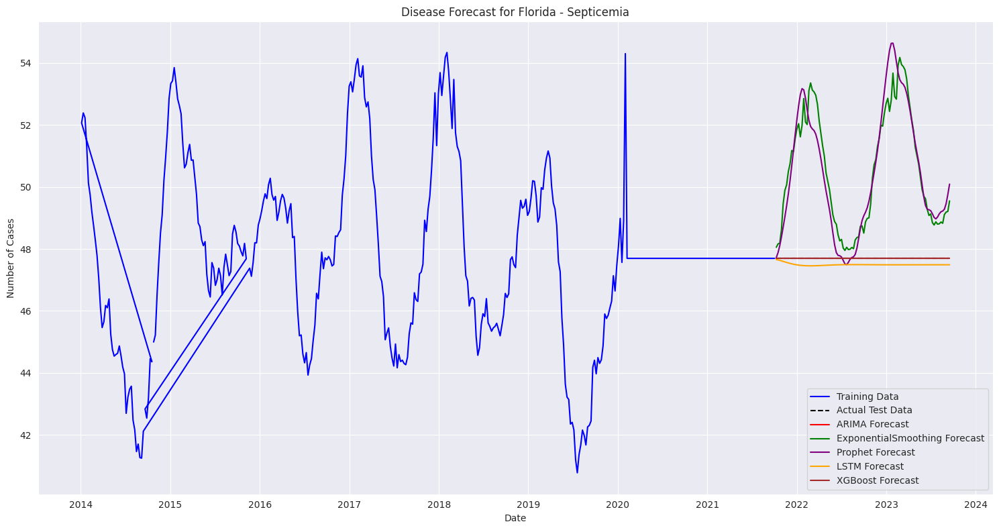


Accuracy Metrics for Florida - Septicemia:
                               MAE          RMSE            R2      MAPE
ARIMA                 1.970711e-12  1.987000e-12 -7.820055e+04       NaN
ExponentialSmoothing  2.838659e+00  3.392823e+00 -2.280037e+29       NaN
Prophet               2.779538e+00  3.426443e+00 -2.325448e+29  5.827639
LSTM                  2.003629e-01  2.035532e-01 -8.206830e+26  0.420085
XGBoost               1.375612e-05  1.375612e-05 -3.748104e+18  0.000029


  Working on disease: Influenza and pneumonia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/8k7k81k9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/66r6os5z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17600', 'data', 'file=/tmp/tmpyhfpm2dm/8k7k81k9.json', 'init=/tmp/tmpyhfpm2dm/66r6os5z.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelqt3gge6l/prophet_model-20250426104748.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:47:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:47:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


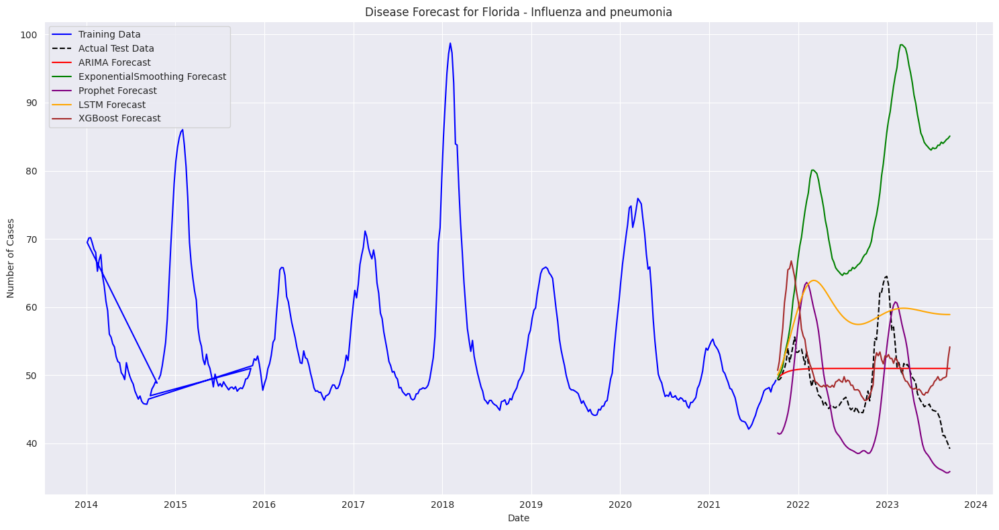


Accuracy Metrics for Florida - Influenza and pneumonia:
                            MAE       RMSE         R2       MAPE
ARIMA                  4.680988   5.684988  -0.110019        NaN
ExponentialSmoothing  26.622890  29.591114 -29.074175        NaN
Prophet                6.832082   7.679485  -1.025514  13.739026
LSTM                  10.390784  11.589563  -3.613231  22.232242
XGBoost                4.209622   5.552385  -0.058840   8.469850


  Working on disease: COVID-19 (U071, Multiple Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/7g933y1p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/028iw731.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66628', 'data', 'file=/tmp/tmpyhfpm2dm/7g933y1p.json', 'init=/tmp/tmpyhfpm2dm/028iw731.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelfbacn_p1/prophet_model-20250426104821.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:48:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:48:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


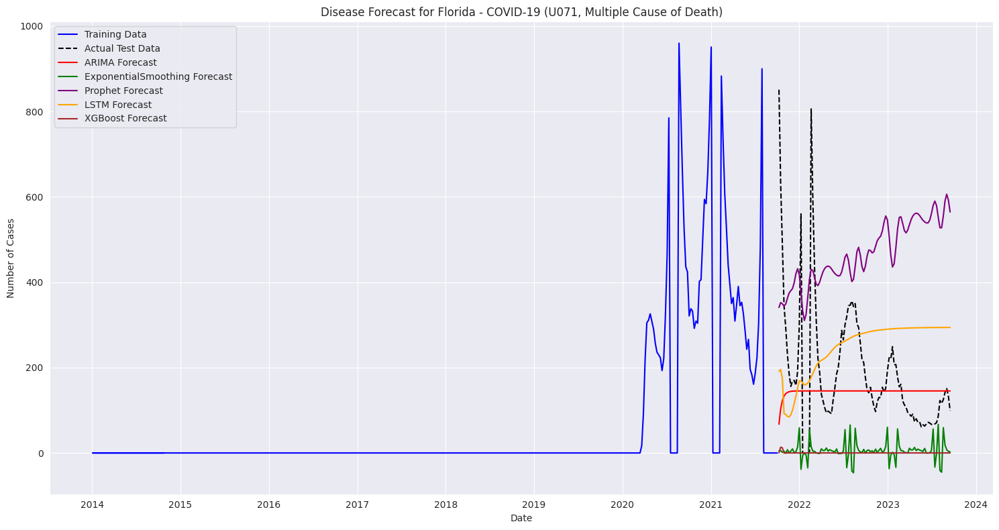


Accuracy Metrics for Florida - COVID-19 (U071, Multiple Cause of Death):
                             MAE        RMSE        R2  MAPE
ARIMA                  99.990437  162.570740 -0.165524   NaN
ExponentialSmoothing  185.131194  239.365012 -1.526724   NaN
Prophet               311.143957  338.750841 -4.060544   inf
LSTM                  153.316939  187.020869 -0.542469   inf
XGBoost               189.366024  241.550584 -1.573076   inf


  Working on disease: COVID-19 (U071, Underlying Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/4jnka8aj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/nt71j86u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13958', 'data', 'file=/tmp/tmpyhfpm2dm/4jnka8aj.json', 'init=/tmp/tmpyhfpm2dm/nt71j86u.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelgt0ckmqg/prophet_model-20250426104852.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:48:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:48:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


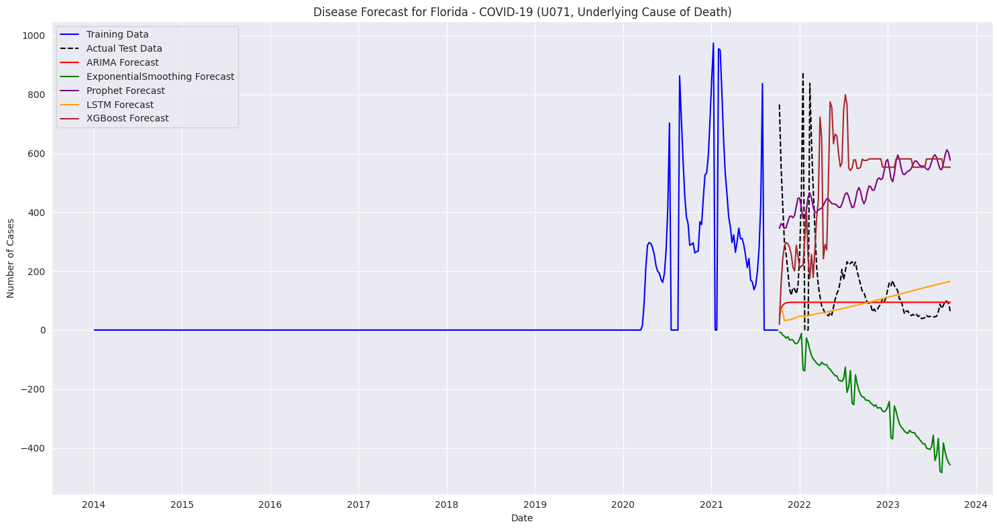


Accuracy Metrics for Florida - COVID-19 (U071, Underlying Cause of Death):
                             MAE        RMSE        R2  MAPE
ARIMA                  92.315723  173.730799 -0.164654   NaN
ExponentialSmoothing  379.772671  408.682236 -5.444879   NaN
Prophet               365.975421  388.132615 -4.813043   inf
LSTM                  114.600246  190.177004 -0.395594   inf
XGBoost               419.414206  448.549958 -6.763631   inf


Forecasting for state: United States
  Working on disease: Septicemia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/ko2y93n3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/u7ylss17.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42101', 'data', 'file=/tmp/tmpyhfpm2dm/ko2y93n3.json', 'init=/tmp/tmpyhfpm2dm/u7ylss17.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelmj7pnyy_/prophet_model-20250426104924.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:49:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:49:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


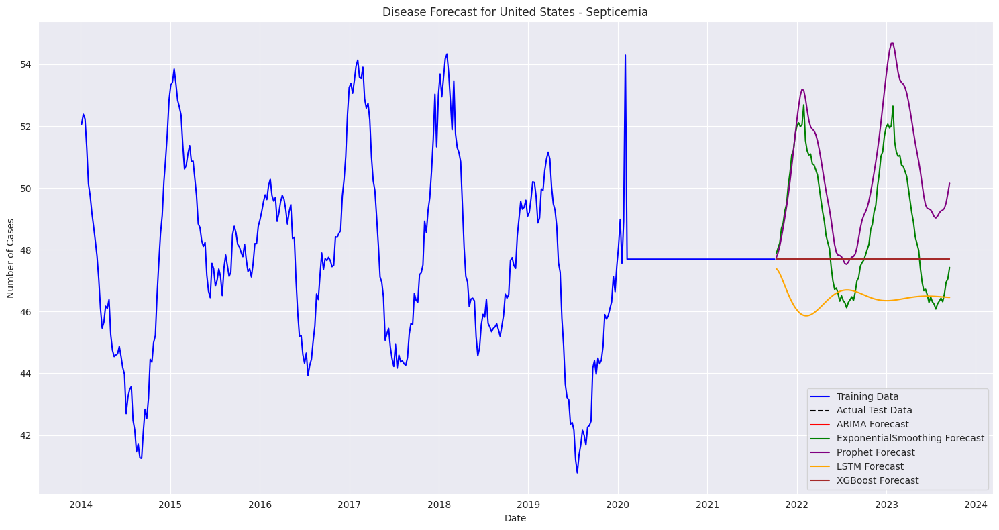


Accuracy Metrics for United States - Septicemia:
                               MAE          RMSE            R2          MAPE
ARIMA                 2.130048e-09  2.166378e-09 -9.295830e+10  4.465905e-09
ExponentialSmoothing  1.923812e+00  2.345819e+00 -1.089955e+29  4.033505e+00
Prophet               2.817395e+00  3.460999e+00 -2.372589e+29  5.907010e+00
LSTM                  1.256399e+00  1.287076e+00 -3.281163e+28  2.634193e+00
XGBoost               7.097658e-05  7.097658e-05 -9.978144e+19  1.488110e-04


  Working on disease: Influenza and pneumonia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/etkljsbe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/gqglc3mf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66832', 'data', 'file=/tmp/tmpyhfpm2dm/etkljsbe.json', 'init=/tmp/tmpyhfpm2dm/gqglc3mf.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_model76eh8jrw/prophet_model-20250426104955.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:49:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:49:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


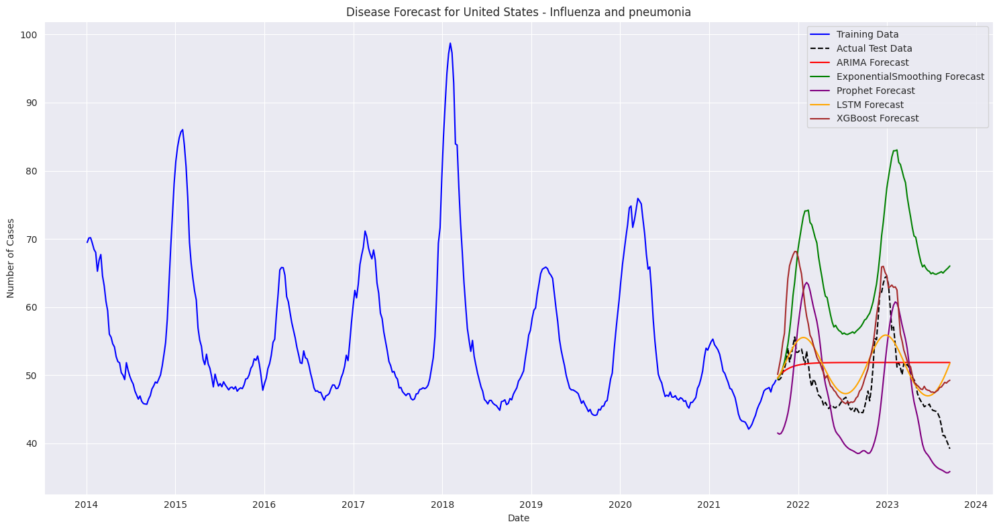


Accuracy Metrics for United States - Influenza and pneumonia:
                            MAE       RMSE        R2       MAPE
ARIMA                  5.013741   6.005892 -0.238871  10.480911
ExponentialSmoothing  16.030607  17.742889 -9.812342  33.249928
Prophet                6.832082   7.679485 -1.025514  13.739026
LSTM                   3.253302   4.192004  0.396448   6.805785
XGBoost                4.355158   5.706965 -0.118617   8.870616


  Working on disease: COVID-19 (U071, Multiple Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/8tnyg_9s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/lzje663q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=12056', 'data', 'file=/tmp/tmpyhfpm2dm/8tnyg_9s.json', 'init=/tmp/tmpyhfpm2dm/lzje663q.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_model3hzevglr/prophet_model-20250426105026.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:50:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:50:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


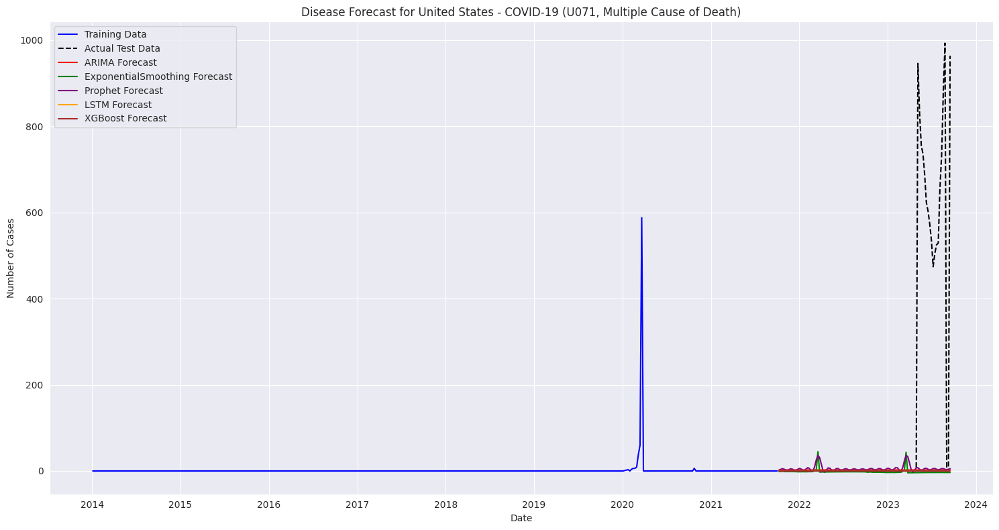


Accuracy Metrics for United States - COVID-19 (U071, Multiple Cause of Death):
                             MAE        RMSE        R2  MAPE
ARIMA                 124.557463  299.795395 -0.193120   inf
ExponentialSmoothing  126.422708  302.325052 -0.213340   inf
Prophet               127.172243  299.078048 -0.187417   inf
LSTM                  123.486052  300.466669 -0.198469   inf
XGBoost               123.022377  300.759487 -0.200806   inf


  Working on disease: COVID-19 (U071, Underlying Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/66h0cvho.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/tlv_s0lv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95825', 'data', 'file=/tmp/tmpyhfpm2dm/66h0cvho.json', 'init=/tmp/tmpyhfpm2dm/tlv_s0lv.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelwu09j4qh/prophet_model-20250426105058.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:50:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:50:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


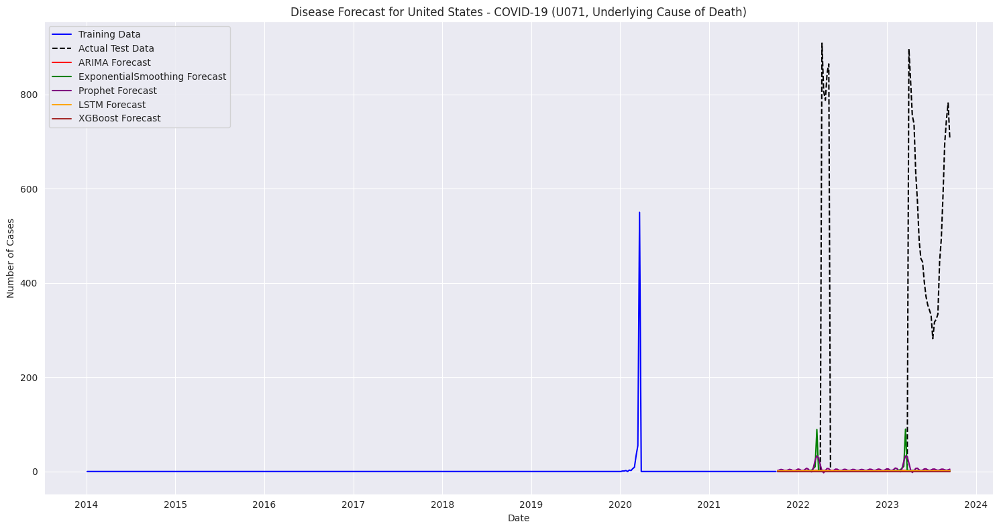


Accuracy Metrics for United States - COVID-19 (U071, Underlying Cause of Death):
                             MAE        RMSE        R2  MAPE
ARIMA                 172.833686  335.064882 -0.345963   inf
ExponentialSmoothing  174.309058  335.658399 -0.350736   inf
Prophet               174.797197  334.197544 -0.339004   inf
LSTM                  172.454898  335.555378 -0.349907   inf
XGBoost               172.001055  336.146263 -0.354665   inf


Forecasting for state: Alabama
  Working on disease: Septicemia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/t2p2fv3v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/71t0vr0v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56065', 'data', 'file=/tmp/tmpyhfpm2dm/t2p2fv3v.json', 'init=/tmp/tmpyhfpm2dm/71t0vr0v.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_model5_izjyag/prophet_model-20250426105129.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:51:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:51:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


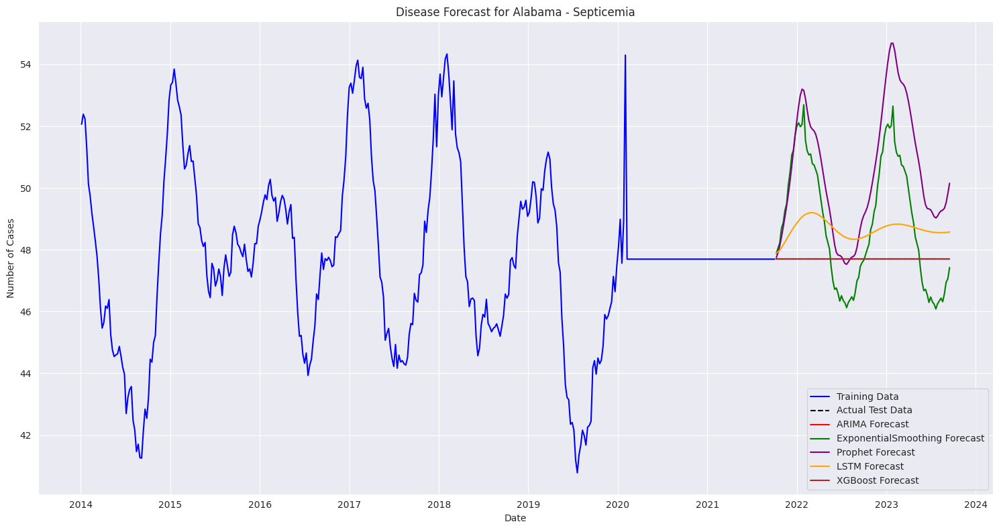


Accuracy Metrics for Alabama - Septicemia:
                               MAE          RMSE            R2          MAPE
ARIMA                 2.130048e-09  2.166378e-09 -9.295830e+10  4.465905e-09
ExponentialSmoothing  1.923812e+00  2.345819e+00 -1.089955e+29  4.033505e+00
Prophet               2.817395e+00  3.460999e+00 -2.372589e+29  5.907010e+00
LSTM                  9.640502e-01  1.003336e+00 -1.993943e+28  2.021249e+00
XGBoost               7.097658e-05  7.097658e-05 -9.978144e+19  1.488110e-04


  Working on disease: Influenza and pneumonia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/71rc0l1x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/_ubb9zlt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9914', 'data', 'file=/tmp/tmpyhfpm2dm/71rc0l1x.json', 'init=/tmp/tmpyhfpm2dm/_ubb9zlt.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_model4i4h0m1x/prophet_model-20250426105201.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:52:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:52:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


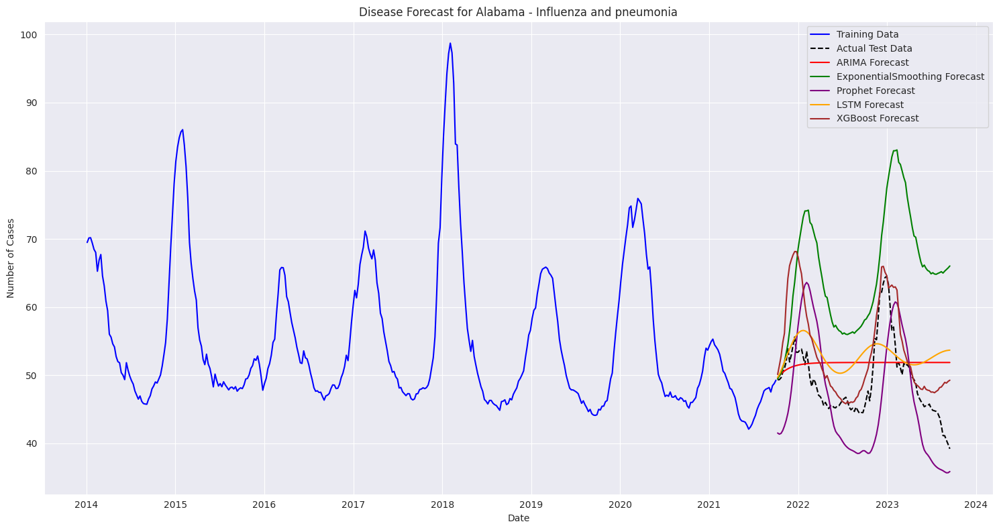


Accuracy Metrics for Alabama - Influenza and pneumonia:
                            MAE       RMSE        R2       MAPE
ARIMA                  5.013741   6.005892 -0.238871  10.480911
ExponentialSmoothing  16.030607  17.742889 -9.812342  33.249928
Prophet                6.832082   7.679485 -1.025514  13.739026
LSTM                   5.214282   6.182458 -0.312784  11.040281
XGBoost                4.355158   5.706965 -0.118617   8.870616


  Working on disease: COVID-19 (U071, Multiple Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/z31jhmol.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/n6gb4pyy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49280', 'data', 'file=/tmp/tmpyhfpm2dm/z31jhmol.json', 'init=/tmp/tmpyhfpm2dm/n6gb4pyy.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelk3jxgbt3/prophet_model-20250426105232.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:52:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:52:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


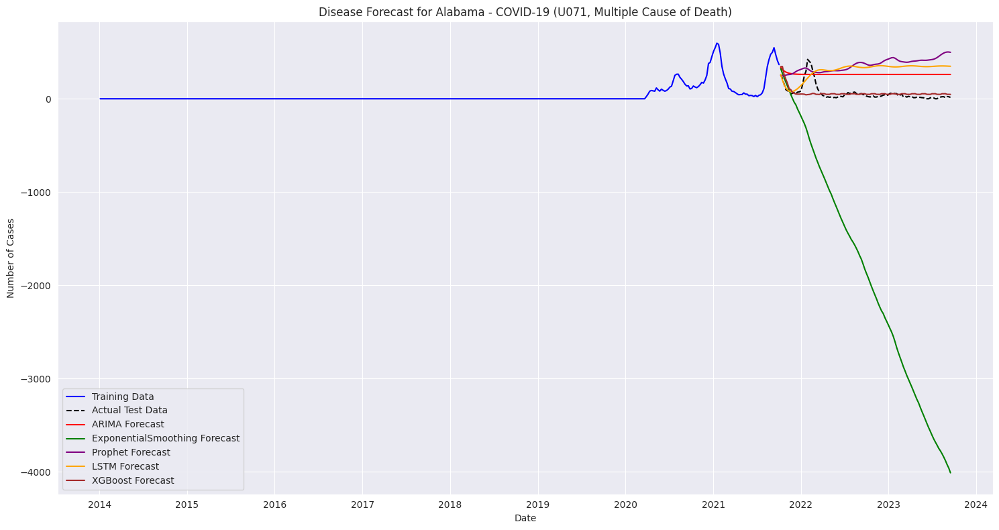


Accuracy Metrics for Alabama - COVID-19 (U071, Multiple Cause of Death):
                              MAE         RMSE          R2  MAPE
ARIMA                  210.128533   216.443520   -5.545610   inf
ExponentialSmoothing  1945.194158  2292.802554 -733.504209   inf
Prophet                304.962440   325.232759  -13.779153   inf
LSTM                   253.993644   277.187496   -9.735153   inf
XGBoost                 47.582753    84.111134    0.011520   inf


  Working on disease: COVID-19 (U071, Underlying Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/_snwulku.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/ka_hxzep.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30064', 'data', 'file=/tmp/tmpyhfpm2dm/_snwulku.json', 'init=/tmp/tmpyhfpm2dm/ka_hxzep.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modeltkzhlozg/prophet_model-20250426105305.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:53:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:53:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


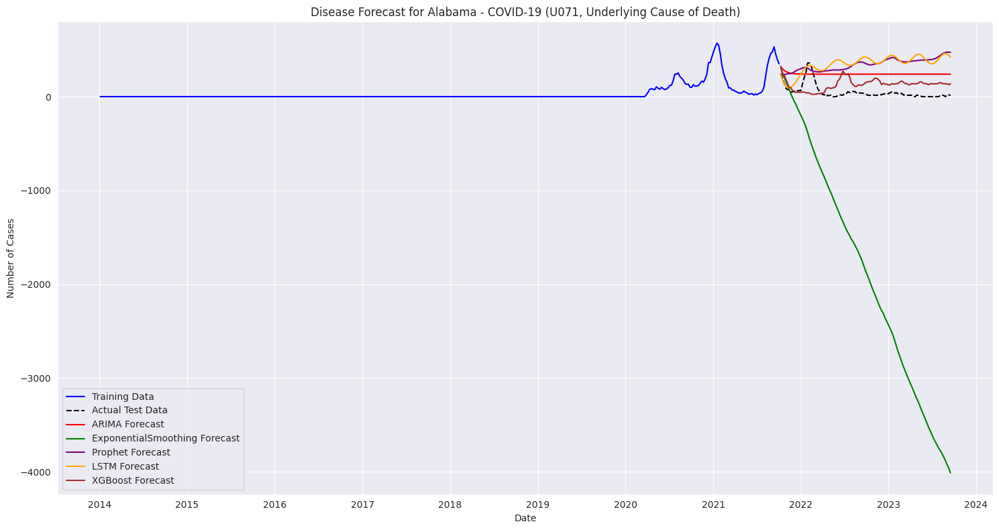


Accuracy Metrics for Alabama - COVID-19 (U071, Underlying Cause of Death):
                              MAE         RMSE          R2  MAPE
ARIMA                  198.752423   204.776384   -6.228140   inf
ExponentialSmoothing  1940.924302  2289.431068 -902.487055   inf
Prophet                294.400665   313.702711  -15.963026   inf
LSTM                   297.952935   325.541317  -17.267496   inf
XGBoost                118.588157   133.739242   -2.083078   inf


Forecasting for state: Alaska
  Working on disease: Septicemia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/gs6iec73.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/tlpsy9t5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83875', 'data', 'file=/tmp/tmpyhfpm2dm/gs6iec73.json', 'init=/tmp/tmpyhfpm2dm/tlpsy9t5.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelhs952aww/prophet_model-20250426105338.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:53:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:53:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


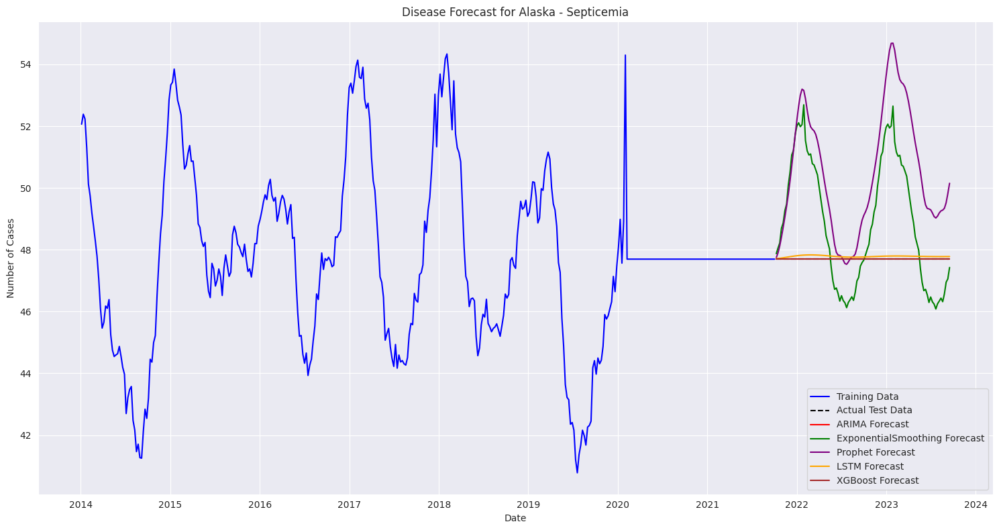


Accuracy Metrics for Alaska - Septicemia:
                               MAE          RMSE            R2          MAPE
ARIMA                 2.130048e-09  2.166378e-09 -9.295830e+10  4.465905e-09
ExponentialSmoothing  1.923812e+00  2.345819e+00 -1.089955e+29  4.033505e+00
Prophet               2.817395e+00  3.460999e+00 -2.372589e+29  5.907010e+00
LSTM                  9.003616e-02  9.317633e-02 -1.719613e+26  1.887718e-01
XGBoost               7.097658e-05  7.097658e-05 -9.978144e+19  1.488110e-04


  Working on disease: Influenza and pneumonia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/zkq0c8qn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/mmbsc7zb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96531', 'data', 'file=/tmp/tmpyhfpm2dm/zkq0c8qn.json', 'init=/tmp/tmpyhfpm2dm/mmbsc7zb.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_model68i9bz2d/prophet_model-20250426105409.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:54:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:54:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


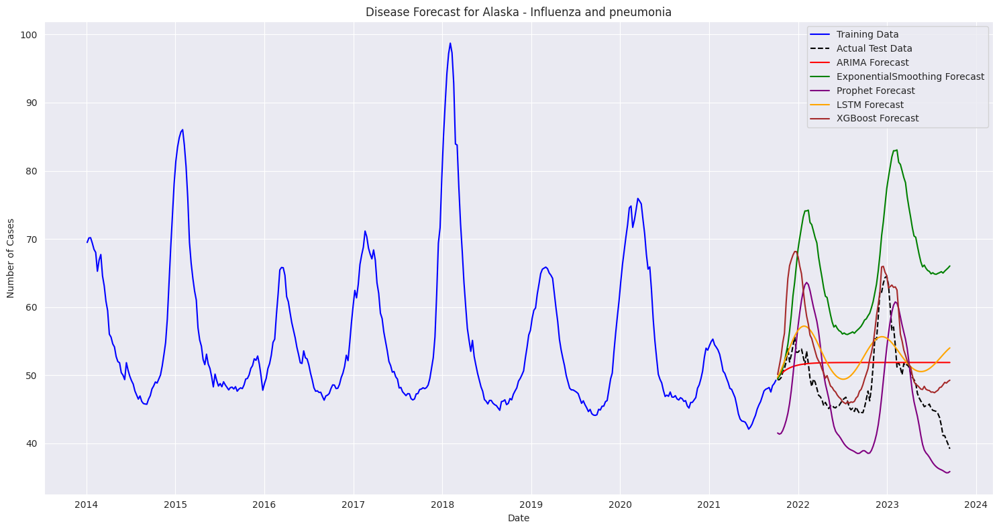


Accuracy Metrics for Alaska - Influenza and pneumonia:
                            MAE       RMSE        R2       MAPE
ARIMA                  5.013741   6.005892 -0.238871  10.480911
ExponentialSmoothing  16.030607  17.742889 -9.812342  33.249928
Prophet                6.832082   7.679485 -1.025514  13.739026
LSTM                   4.847459   5.786930 -0.150185  10.280563
XGBoost                4.355158   5.706965 -0.118617   8.870616


  Working on disease: COVID-19 (U071, Multiple Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/pnubcyk3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/fsqkopaf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47746', 'data', 'file=/tmp/tmpyhfpm2dm/pnubcyk3.json', 'init=/tmp/tmpyhfpm2dm/fsqkopaf.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelrlw17o8f/prophet_model-20250426105442.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:54:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:54:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


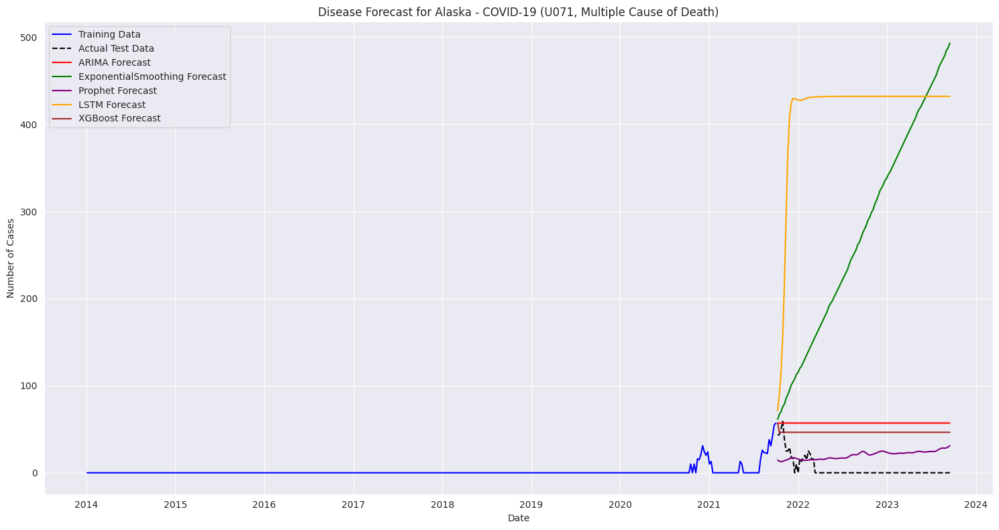


Accuracy Metrics for Alaska - COVID-19 (U071, Multiple Cause of Death):
                             MAE        RMSE           R2  MAPE
ARIMA                  52.064649   53.356841   -19.310276   inf
ExponentialSmoothing  272.848004  303.563918  -656.409382   inf
Prophet                19.728685   21.263529    -2.225568   inf
LSTM                  409.586375  416.829766 -1238.518604   inf
XGBoost                41.819732   43.081688   -12.241007   inf


  Working on disease: COVID-19 (U071, Underlying Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/_izbfidf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/ox961kg1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25643', 'data', 'file=/tmp/tmpyhfpm2dm/_izbfidf.json', 'init=/tmp/tmpyhfpm2dm/ox961kg1.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelek02jz55/prophet_model-20250426105514.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:55:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:55:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


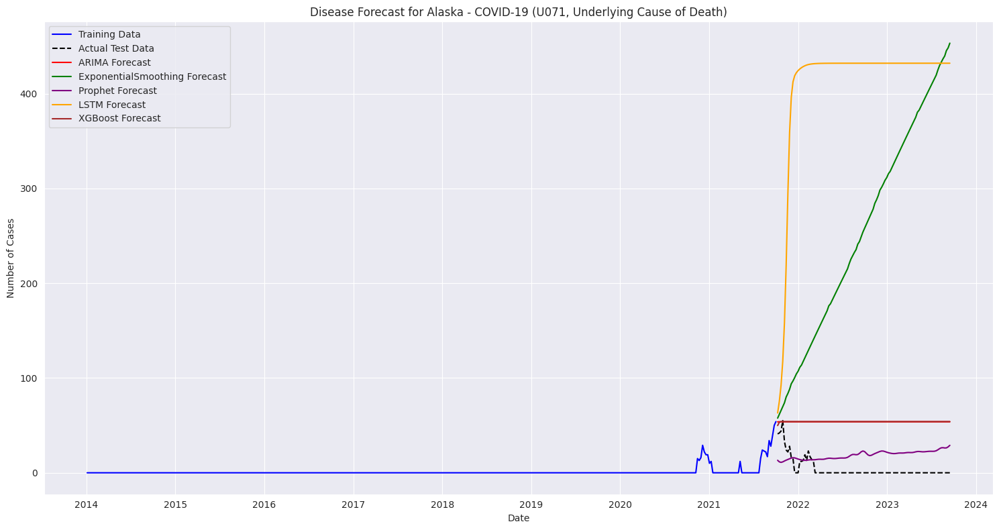


Accuracy Metrics for Alaska - COVID-19 (U071, Underlying Cause of Death):
                             MAE        RMSE           R2  MAPE
ARIMA                  49.369263   50.517998   -20.810093   inf
ExponentialSmoothing  251.542371  279.462506  -666.440200   inf
Prophet                18.321280   19.734613    -2.328300   inf
LSTM                  406.225520  415.007256 -1470.894364   inf
XGBoost                49.511393   50.695527   -20.963652   inf


Forecasting for state: Arizona
  Working on disease: Septicemia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/j6nhp6j0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/z7xtj38r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60497', 'data', 'file=/tmp/tmpyhfpm2dm/j6nhp6j0.json', 'init=/tmp/tmpyhfpm2dm/z7xtj38r.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelp07kgqsf/prophet_model-20250426105602.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:56:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:56:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


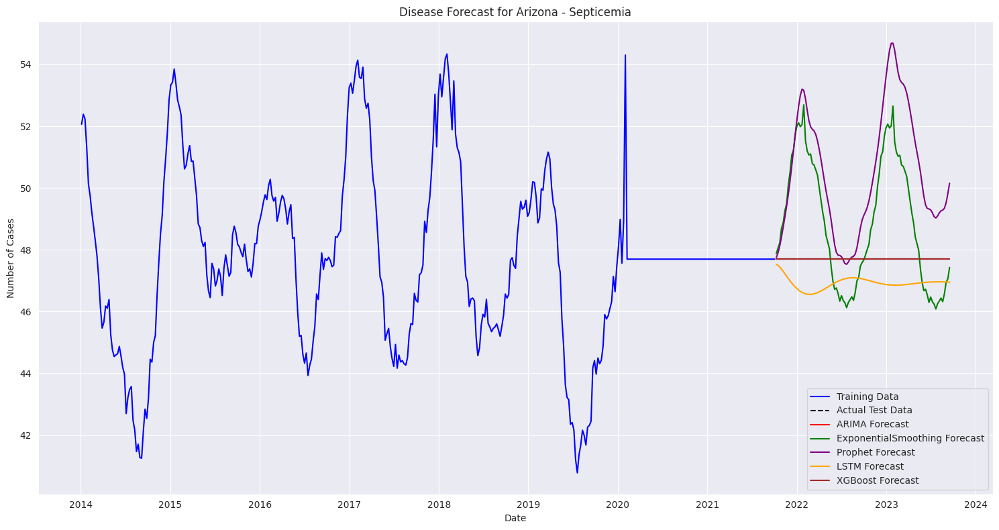


Accuracy Metrics for Arizona - Septicemia:
                               MAE          RMSE            R2          MAPE
ARIMA                 2.130048e-09  2.166378e-09 -9.295830e+10  4.465905e-09
ExponentialSmoothing  1.923812e+00  2.345819e+00 -1.089955e+29  4.033505e+00
Prophet               2.817395e+00  3.460999e+00 -2.372589e+29  5.907010e+00
LSTM                  7.761642e-01  7.983264e-01 -1.262352e+28  1.627323e+00
XGBoost               7.097658e-05  7.097658e-05 -9.978144e+19  1.488110e-04


  Working on disease: Influenza and pneumonia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/iam7u945.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/gp_64mv9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76561', 'data', 'file=/tmp/tmpyhfpm2dm/iam7u945.json', 'init=/tmp/tmpyhfpm2dm/gp_64mv9.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelcwzxoqxp/prophet_model-20250426105642.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:56:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:56:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


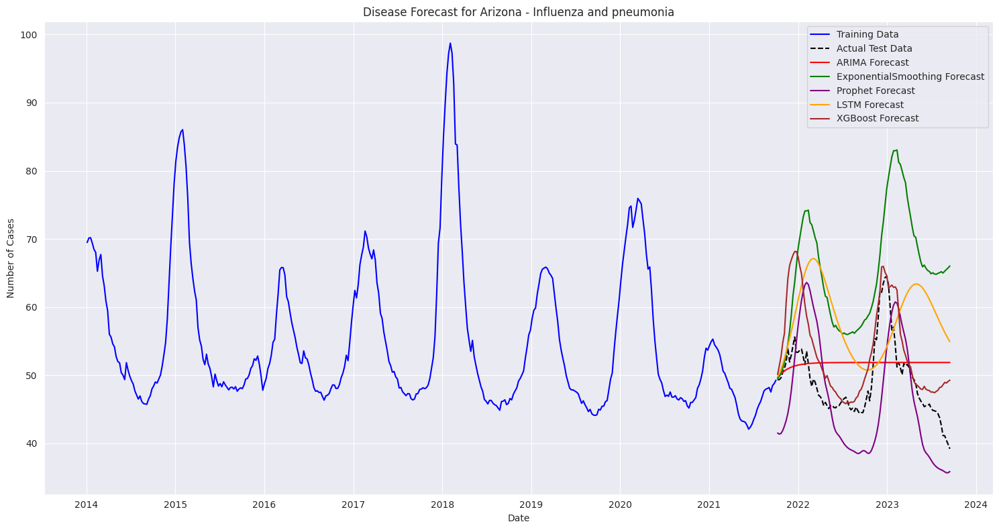


Accuracy Metrics for Arizona - Influenza and pneumonia:
                            MAE       RMSE        R2       MAPE
ARIMA                  5.013741   6.005892 -0.238871  10.480911
ExponentialSmoothing  16.030607  17.742889 -9.812342  33.249928
Prophet                6.832082   7.679485 -1.025514  13.739026
LSTM                  10.358844  11.744162 -3.737129  21.785492
XGBoost                4.355158   5.706965 -0.118617   8.870616


  Working on disease: COVID-19 (U071, Multiple Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/5sfb9c9j.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/cie5ix_0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=41747', 'data', 'file=/tmp/tmpyhfpm2dm/5sfb9c9j.json', 'init=/tmp/tmpyhfpm2dm/cie5ix_0.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modeloone7v_5/prophet_model-20250426105716.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:57:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:57:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


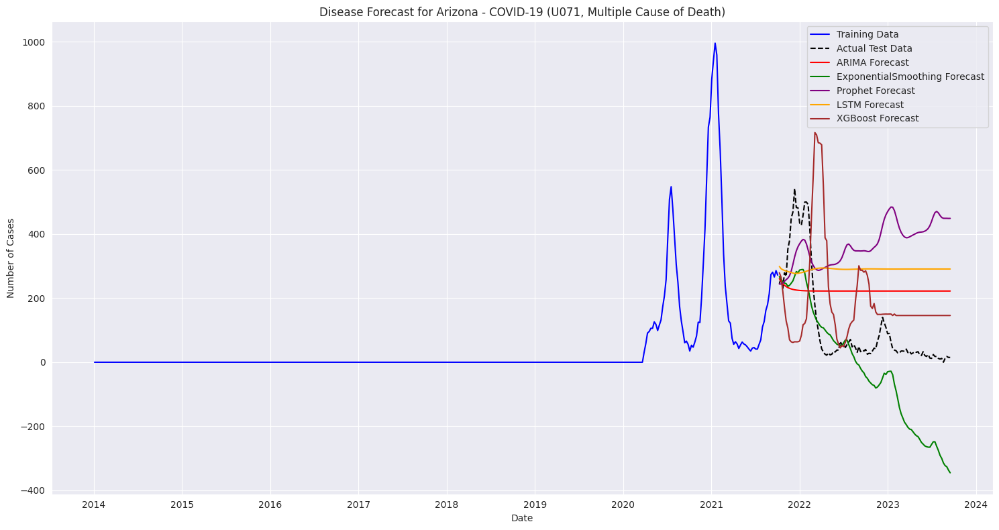


Accuracy Metrics for Arizona - COVID-19 (U071, Multiple Cause of Death):
                             MAE        RMSE        R2  MAPE
ARIMA                 175.651177  184.229459 -0.495876   inf
ExponentialSmoothing  147.624817  180.375380 -0.433943   inf
Prophet               287.607783  312.993845 -3.317666   inf
LSTM                  223.129580  232.770676 -1.387998   inf
XGBoost               178.586298  231.688475 -1.365845   inf


  Working on disease: COVID-19 (U071, Underlying Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/3x3c7a5g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/z2n4j9bv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3899', 'data', 'file=/tmp/tmpyhfpm2dm/3x3c7a5g.json', 'init=/tmp/tmpyhfpm2dm/z2n4j9bv.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelbrjjtscr/prophet_model-20250426105748.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:57:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:57:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


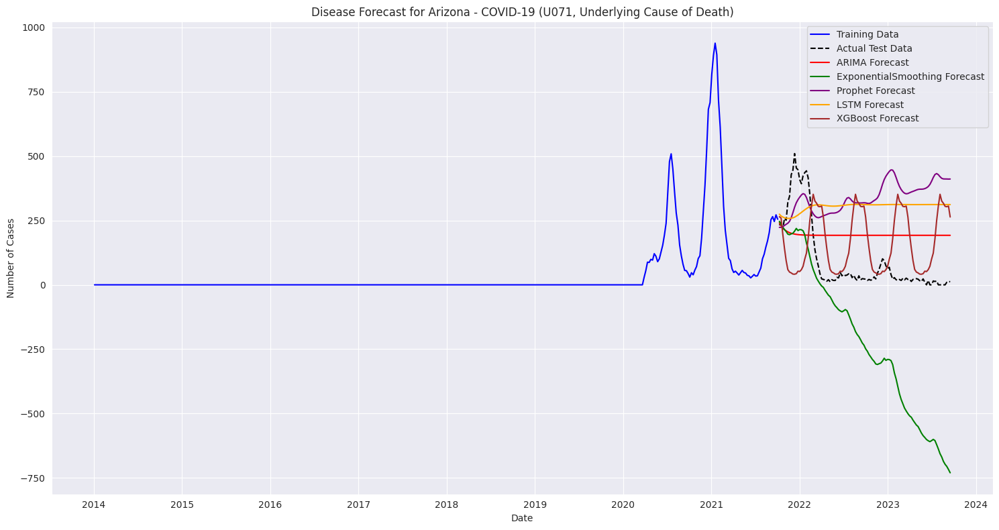


Accuracy Metrics for Arizona - COVID-19 (U071, Underlying Cause of Death):
                             MAE        RMSE        R2  MAPE
ARIMA                 161.816201  169.616543 -0.448871   inf
ExponentialSmoothing  321.550421  383.627323 -6.411608   inf
Prophet               272.121594  295.773010 -3.405655   inf
LSTM                  245.818191  258.611795 -2.368139   inf
XGBoost               169.153882  212.312841 -1.270105   inf


Forecasting for state: Arkansas
  Working on disease: Septicemia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/emvyuhpy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/5441mzhq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28234', 'data', 'file=/tmp/tmpyhfpm2dm/emvyuhpy.json', 'init=/tmp/tmpyhfpm2dm/5441mzhq.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelvzgwb00e/prophet_model-20250426105821.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:58:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:58:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


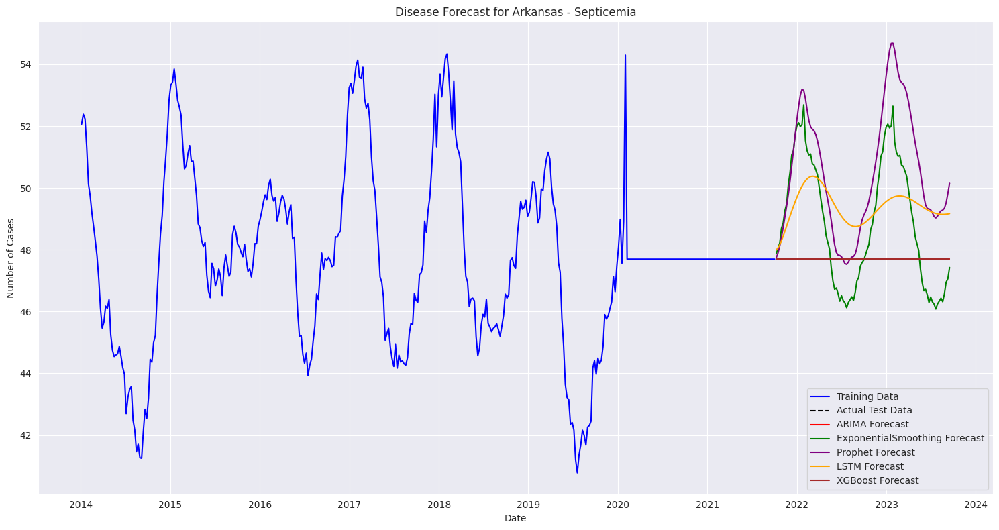


Accuracy Metrics for Arkansas - Septicemia:
                               MAE          RMSE            R2          MAPE
ARIMA                 2.130048e-09  2.166378e-09 -9.295830e+10  4.465905e-09
ExponentialSmoothing  1.923812e+00  2.345819e+00 -1.089955e+29  4.033505e+00
Prophet               2.817395e+00  3.460999e+00 -2.372589e+29  5.907010e+00
LSTM                  1.685197e+00  1.765073e+00 -6.170851e+28  3.533220e+00
XGBoost               7.097658e-05  7.097658e-05 -9.978144e+19  1.488110e-04


  Working on disease: Influenza and pneumonia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/d7ay9w4r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/j3pmsbga.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55086', 'data', 'file=/tmp/tmpyhfpm2dm/d7ay9w4r.json', 'init=/tmp/tmpyhfpm2dm/j3pmsbga.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_model1zveh0o7/prophet_model-20250426105855.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:58:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:58:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


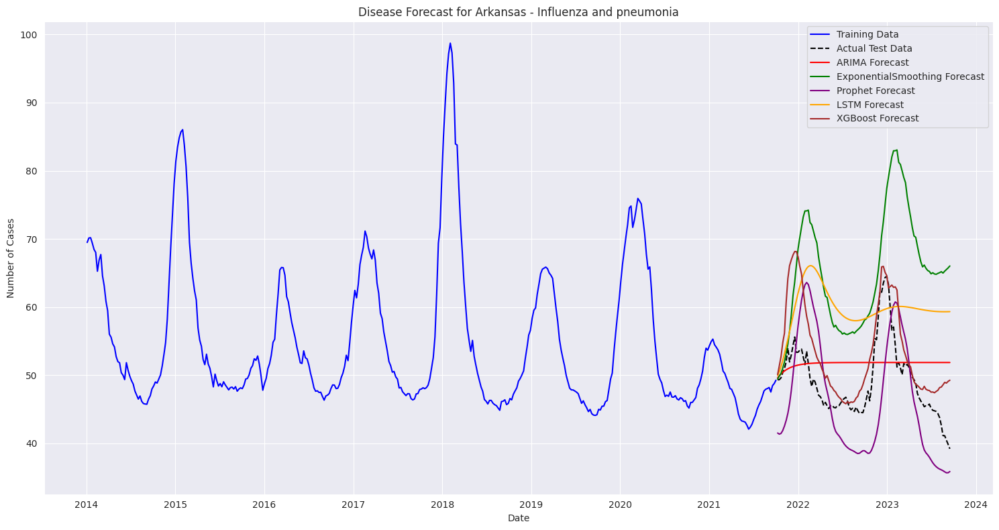


Accuracy Metrics for Arkansas - Influenza and pneumonia:
                            MAE       RMSE        R2       MAPE
ARIMA                  5.013741   6.005892 -0.238871  10.480911
ExponentialSmoothing  16.030607  17.742889 -9.812342  33.249928
Prophet                6.832082   7.679485 -1.025514  13.739026
LSTM                  10.968990  12.148585 -4.069002  23.410722
XGBoost                4.355158   5.706965 -0.118617   8.870616


  Working on disease: COVID-19 (U071, Multiple Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/mppfyxud.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/mv_i4602.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83365', 'data', 'file=/tmp/tmpyhfpm2dm/mppfyxud.json', 'init=/tmp/tmpyhfpm2dm/mv_i4602.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelhoep653c/prophet_model-20250426105926.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:59:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:59:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


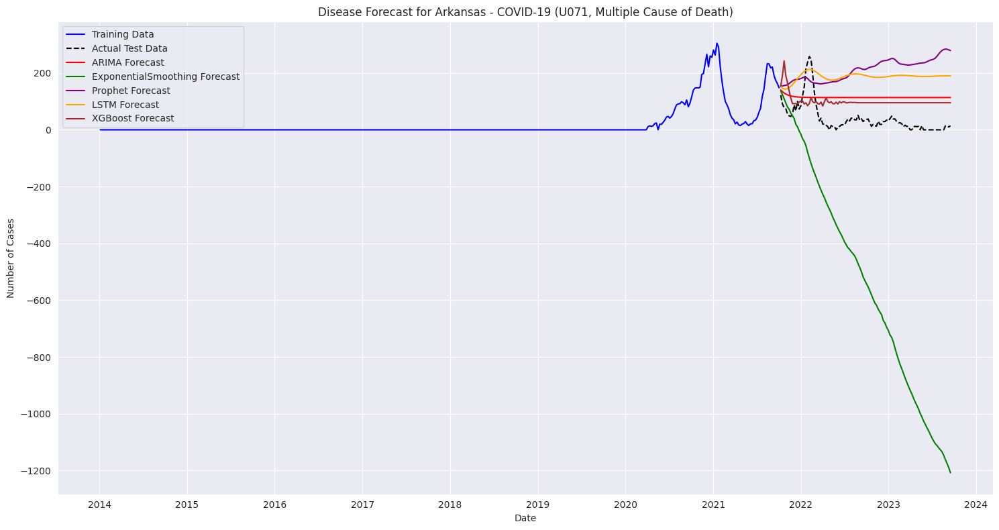


Accuracy Metrics for Arkansas - COVID-19 (U071, Multiple Cause of Death):
                             MAE        RMSE          R2  MAPE
ARIMA                  86.758637   90.763802   -1.895063   inf
ExponentialSmoothing  590.030736  690.441434 -166.527580   inf
Prophet               175.364080  186.883400  -11.273660   inf
LSTM                  148.056491  154.651943   -7.405110   inf
XGBoost                75.555126   80.644379   -1.285498   inf


  Working on disease: COVID-19 (U071, Underlying Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/g55j8asy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/_1nboajo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53109', 'data', 'file=/tmp/tmpyhfpm2dm/g55j8asy.json', 'init=/tmp/tmpyhfpm2dm/_1nboajo.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_model45hq_78c/prophet_model-20250426105958.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:59:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:59:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


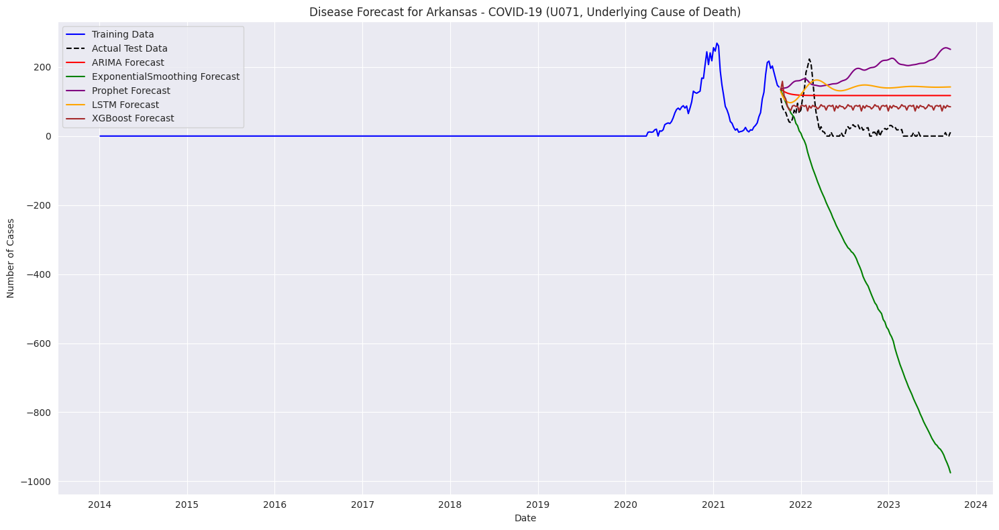


Accuracy Metrics for Arkansas - COVID-19 (U071, Underlying Cause of Death):
                             MAE        RMSE          R2  MAPE
ARIMA                  95.430611   99.178779   -3.322017   inf
ExponentialSmoothing  466.199303  549.230675 -131.543519   inf
Prophet               161.957197  172.752007  -12.112791   inf
LSTM                  112.292717  119.223227   -5.245550   inf
XGBoost                68.387778   72.481491   -1.308358   inf


Forecasting for state: California
  Working on disease: Septicemia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/qwutv5ut.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/hkab4vk7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40914', 'data', 'file=/tmp/tmpyhfpm2dm/qwutv5ut.json', 'init=/tmp/tmpyhfpm2dm/hkab4vk7.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_models3p6czpa/prophet_model-20250426110030.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:00:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:00:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


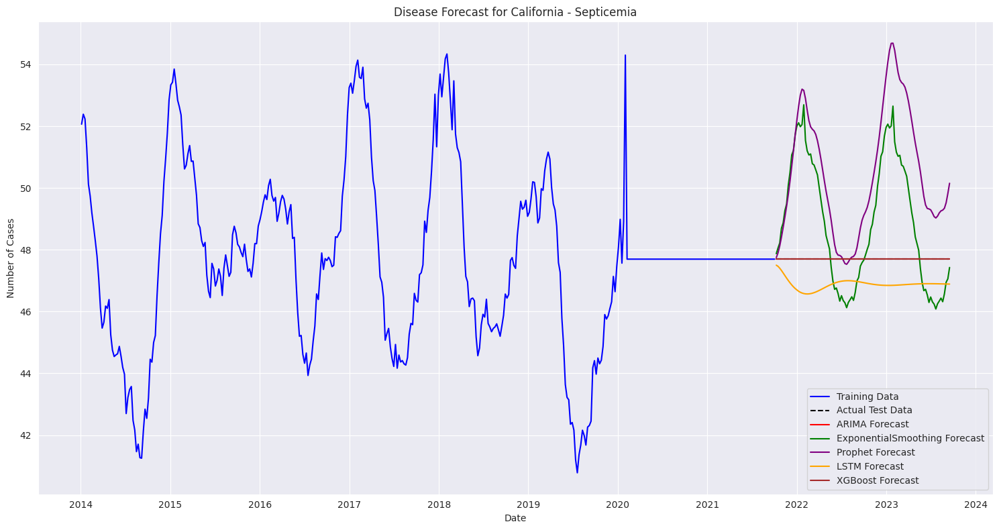


Accuracy Metrics for California - Septicemia:
                               MAE          RMSE            R2          MAPE
ARIMA                 2.130048e-09  2.166378e-09 -9.295830e+10  4.465905e-09
ExponentialSmoothing  1.923812e+00  2.345819e+00 -1.089955e+29  4.033505e+00
Prophet               2.817395e+00  3.460999e+00 -2.372589e+29  5.907010e+00
LSTM                  8.123234e-01  8.287556e-01 -1.360418e+28  1.703135e+00
XGBoost               7.097658e-05  7.097658e-05 -9.978144e+19  1.488110e-04


  Working on disease: Influenza and pneumonia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/sgqpi111.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/fmw3mzfe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71834', 'data', 'file=/tmp/tmpyhfpm2dm/sgqpi111.json', 'init=/tmp/tmpyhfpm2dm/fmw3mzfe.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelv_nyqkil/prophet_model-20250426110102.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:01:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:01:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


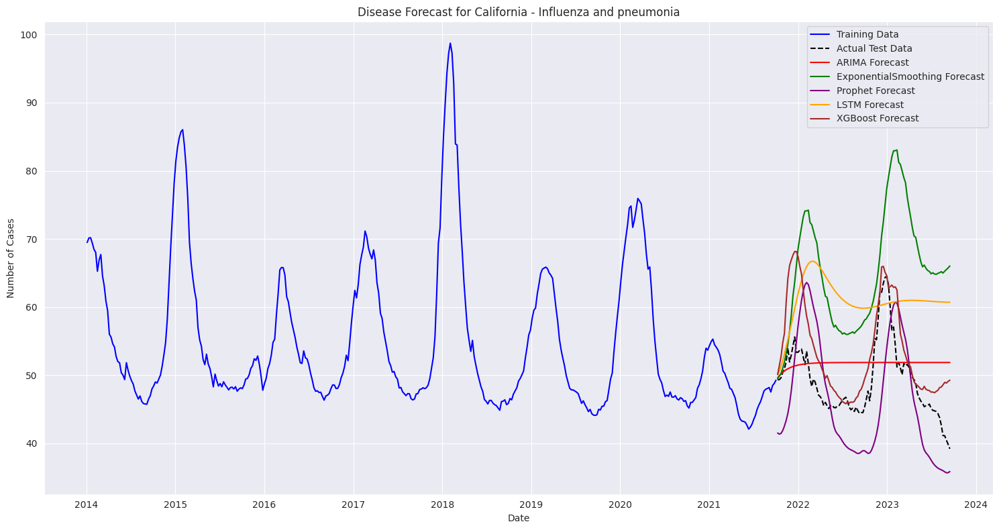


Accuracy Metrics for California - Influenza and pneumonia:
                            MAE       RMSE        R2       MAPE
ARIMA                  5.013741   6.005892 -0.238871  10.480911
ExponentialSmoothing  16.030607  17.742889 -9.812342  33.249928
Prophet                6.832082   7.679485 -1.025514  13.739026
LSTM                  12.017390  13.355621 -5.126315  25.703299
XGBoost                4.355158   5.706965 -0.118617   8.870616


  Working on disease: COVID-19 (U071, Multiple Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/ugr_9tje.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/s6cp6nzr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46004', 'data', 'file=/tmp/tmpyhfpm2dm/ugr_9tje.json', 'init=/tmp/tmpyhfpm2dm/s6cp6nzr.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_model_03pjimz/prophet_model-20250426110133.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:01:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:01:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


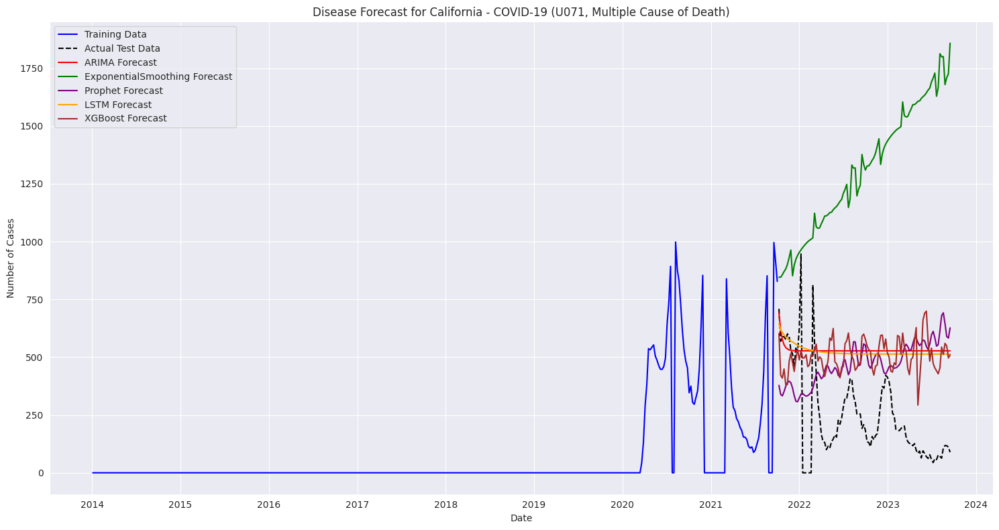


Accuracy Metrics for California - COVID-19 (U071, Multiple Cause of Death):
                              MAE         RMSE         R2  MAPE
ARIMA                  308.602257   343.263135  -2.139221   inf
ExponentialSmoothing  1070.439329  1149.224902 -34.186627   inf
Prophet                309.195361   341.166688  -2.100993   inf
LSTM                   299.285580   333.982377  -1.971767   inf
XGBoost                303.588537   335.813422  -2.004441   inf


  Working on disease: COVID-19 (U071, Underlying Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/w_e5lugs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/wvz8hdnj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44688', 'data', 'file=/tmp/tmpyhfpm2dm/w_e5lugs.json', 'init=/tmp/tmpyhfpm2dm/wvz8hdnj.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelhtz9flu_/prophet_model-20250426110205.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:02:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:02:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


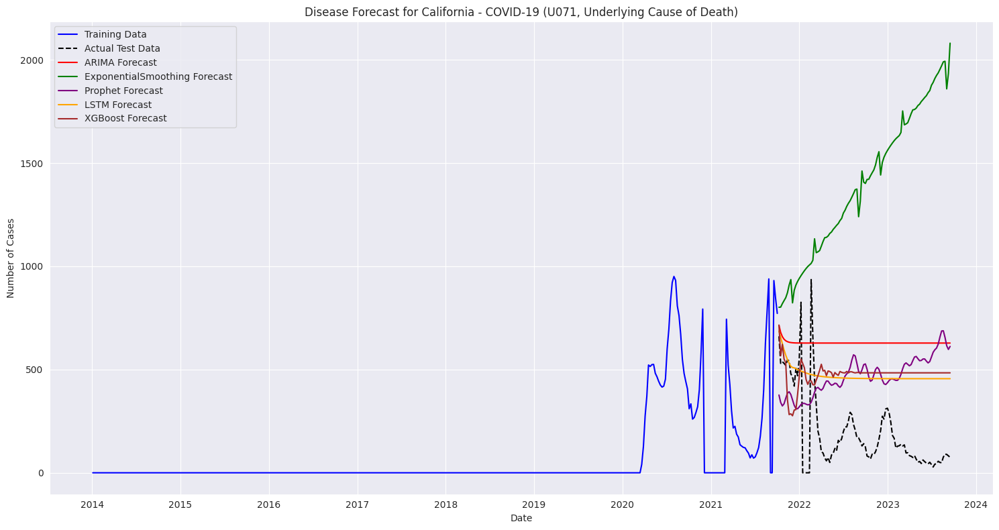


Accuracy Metrics for California - COVID-19 (U071, Underlying Cause of Death):
                              MAE         RMSE         R2  MAPE
ARIMA                  445.027974   472.355814  -5.227466   inf
ExponentialSmoothing  1207.378433  1303.352721 -46.412924   inf
Prophet                345.383312   371.201705  -2.845853   inf
LSTM                   297.220268   323.446025  -1.919957   inf
XGBoost                326.712559   347.700083  -2.374290   inf


Forecasting for state: Colorado
  Working on disease: Septicemia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/i_8t0f4f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/kw7nzaql.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9333', 'data', 'file=/tmp/tmpyhfpm2dm/i_8t0f4f.json', 'init=/tmp/tmpyhfpm2dm/kw7nzaql.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelrgr7x_1g/prophet_model-20250426110236.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:02:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:02:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


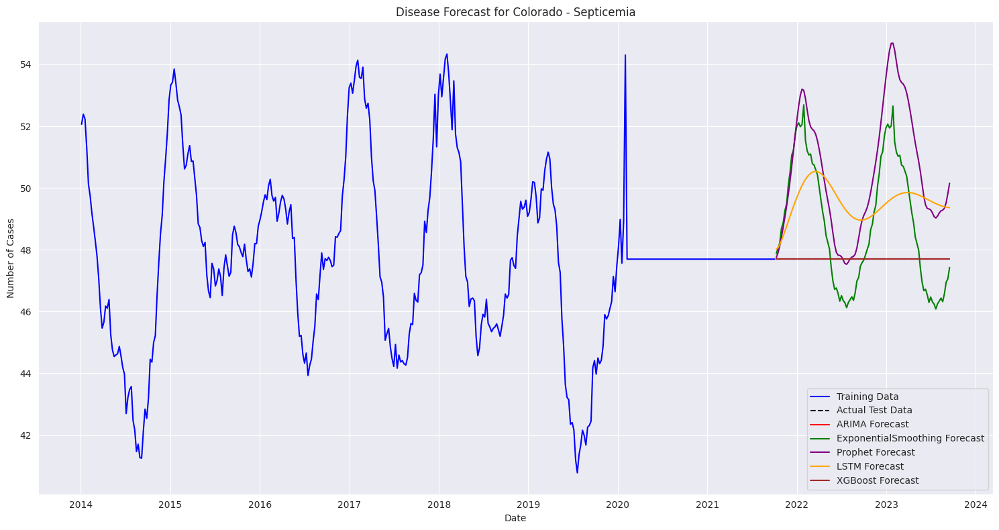


Accuracy Metrics for Colorado - Septicemia:
                               MAE          RMSE            R2          MAPE
ARIMA                 2.130048e-09  2.166378e-09 -9.295830e+10  4.465905e-09
ExponentialSmoothing  1.923812e+00  2.345819e+00 -1.089955e+29  4.033505e+00
Prophet               2.817395e+00  3.460999e+00 -2.372589e+29  5.907010e+00
LSTM                  1.851371e+00  1.929794e+00 -7.376348e+28  3.881624e+00
XGBoost               7.097658e-05  7.097658e-05 -9.978144e+19  1.488110e-04


  Working on disease: Influenza and pneumonia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/pc0fu72f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/mcenox67.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45743', 'data', 'file=/tmp/tmpyhfpm2dm/pc0fu72f.json', 'init=/tmp/tmpyhfpm2dm/mcenox67.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelwwjdk6td/prophet_model-20250426110308.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:03:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:03:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


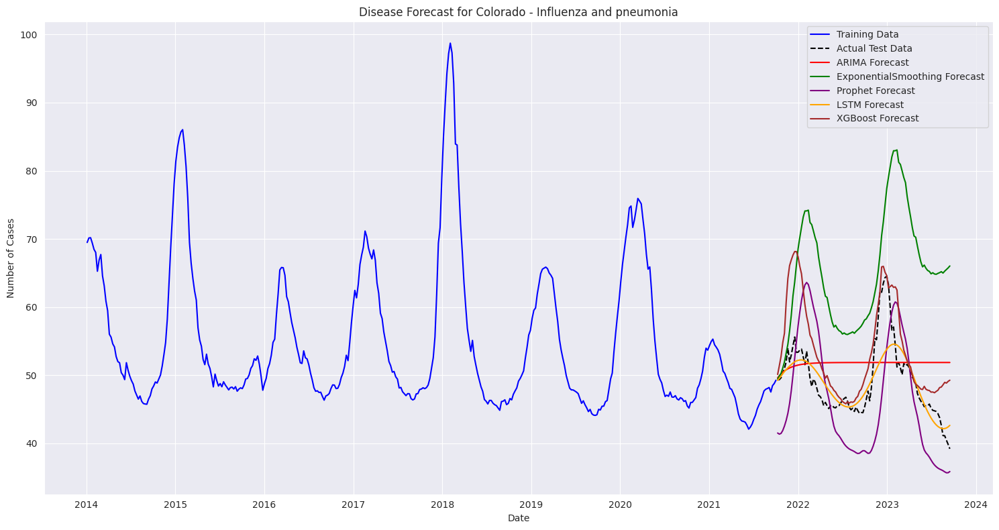


Accuracy Metrics for Colorado - Influenza and pneumonia:
                            MAE       RMSE        R2       MAPE
ARIMA                  5.013741   6.005892 -0.238871  10.480911
ExponentialSmoothing  16.030607  17.742889 -9.812342  33.249928
Prophet                6.832082   7.679485 -1.025514  13.739026
LSTM                   2.099524   3.168839  0.655117   4.019668
XGBoost                4.355158   5.706965 -0.118617   8.870616


  Working on disease: COVID-19 (U071, Multiple Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/rlrs0n22.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/cv909o_q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36831', 'data', 'file=/tmp/tmpyhfpm2dm/rlrs0n22.json', 'init=/tmp/tmpyhfpm2dm/cv909o_q.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_model_ztu_f1i/prophet_model-20250426110340.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:03:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:03:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


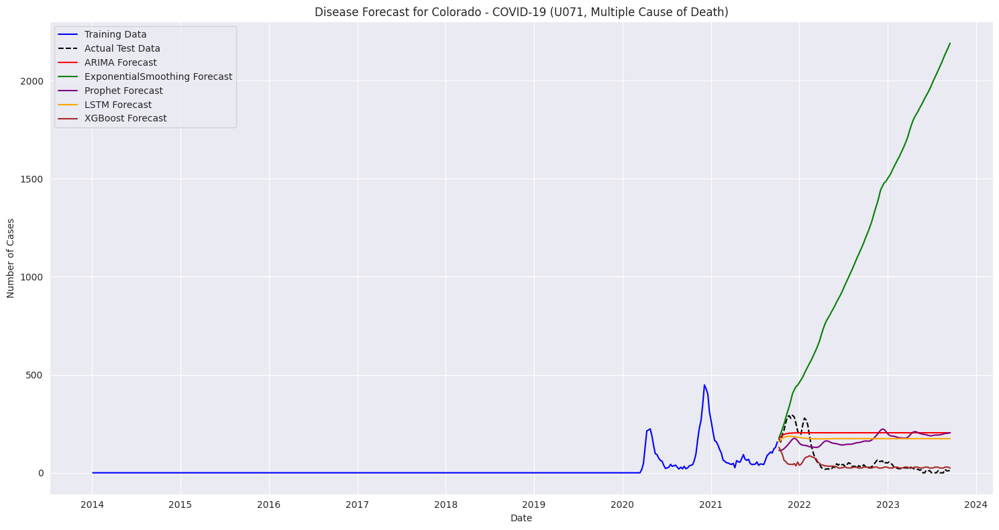


Accuracy Metrics for Colorado - COVID-19 (U071, Multiple Cause of Death):
                              MAE         RMSE          R2  MAPE
ARIMA                  148.960228   159.115289   -2.501709   inf
ExponentialSmoothing  1135.711816  1307.536935 -235.463510   inf
Prophet                134.455604   141.217920   -1.758264   inf
LSTM                   127.538262   134.131599   -1.488390   inf
XGBoost                 44.218166    80.997062    0.092608   inf


  Working on disease: COVID-19 (U071, Underlying Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/m8g5zep_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/1315hysv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69830', 'data', 'file=/tmp/tmpyhfpm2dm/m8g5zep_.json', 'init=/tmp/tmpyhfpm2dm/1315hysv.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelub3c90kv/prophet_model-20250426110412.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:04:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:04:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


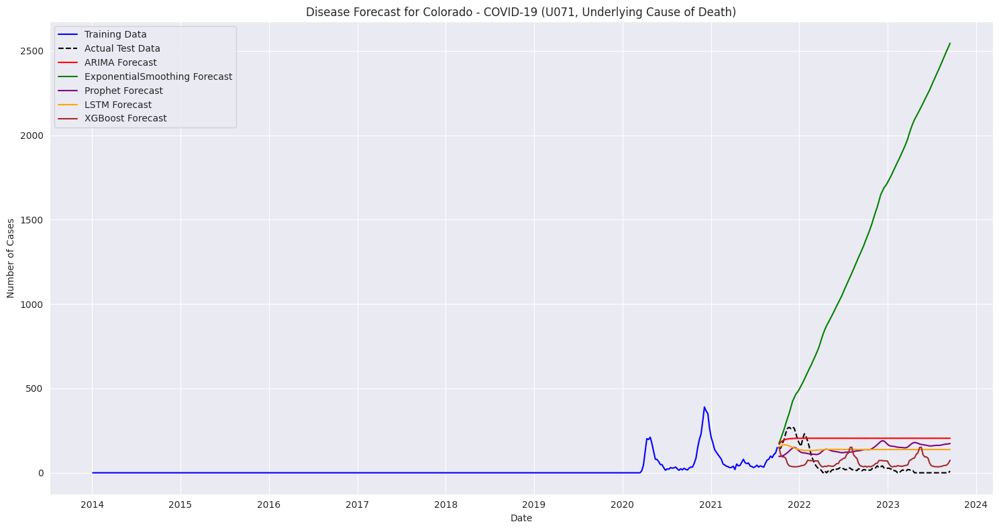


Accuracy Metrics for Colorado - COVID-19 (U071, Underlying Cause of Death):
                              MAE         RMSE          R2  MAPE
ARIMA                  159.511078   171.358935   -3.730075   inf
ExponentialSmoothing  1328.344926  1523.671426 -372.970373   inf
Prophet                123.155232   128.614006   -1.664594   inf
LSTM                   110.324939   114.995701   -1.130187   inf
XGBoost                 66.287402    86.683614   -0.210399   inf


Forecasting for state: Connecticut
  Working on disease: Septicemia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/re3p6pvs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/wd7_o7qi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75032', 'data', 'file=/tmp/tmpyhfpm2dm/re3p6pvs.json', 'init=/tmp/tmpyhfpm2dm/wd7_o7qi.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelb8ccurkf/prophet_model-20250426110445.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:04:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:04:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


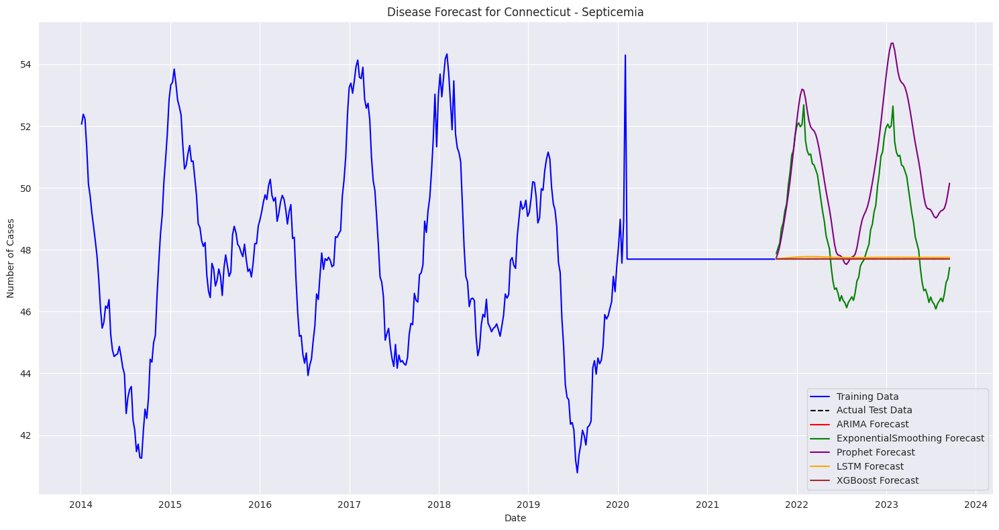


Accuracy Metrics for Connecticut - Septicemia:
                               MAE          RMSE            R2          MAPE
ARIMA                 2.130048e-09  2.166378e-09 -9.295830e+10  4.465905e-09
ExponentialSmoothing  1.923812e+00  2.345819e+00 -1.089955e+29  4.033505e+00
Prophet               2.817395e+00  3.460999e+00 -2.372589e+29  5.907010e+00
LSTM                  5.722965e-02  5.853482e-02 -6.786536e+25  1.199889e-01
XGBoost               7.097658e-05  7.097658e-05 -9.978144e+19  1.488110e-04


  Working on disease: Influenza and pneumonia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/t0pe1h2k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/2na1dh_i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46869', 'data', 'file=/tmp/tmpyhfpm2dm/t0pe1h2k.json', 'init=/tmp/tmpyhfpm2dm/2na1dh_i.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelpfx0b1v_/prophet_model-20250426110516.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:05:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:05:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


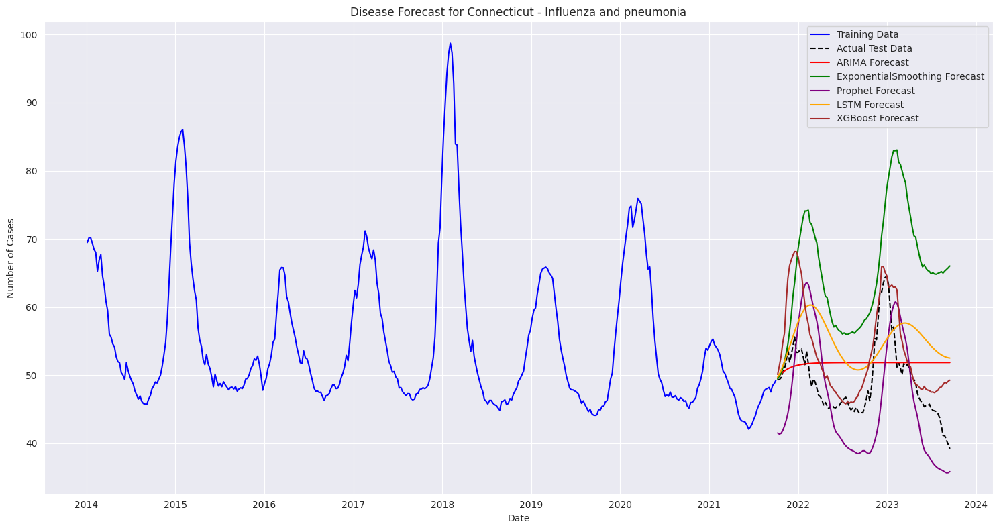


Accuracy Metrics for Connecticut - Influenza and pneumonia:
                            MAE       RMSE        R2       MAPE
ARIMA                  5.013741   6.005892 -0.238871  10.480911
ExponentialSmoothing  16.030607  17.742889 -9.812342  33.249928
Prophet                6.832082   7.679485 -1.025514  13.739026
LSTM                   7.000016   7.799380 -1.089254  14.722026
XGBoost                4.355158   5.706965 -0.118617   8.870616


  Working on disease: COVID-19 (U071, Multiple Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/pism280y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/_qvezh59.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29208', 'data', 'file=/tmp/tmpyhfpm2dm/pism280y.json', 'init=/tmp/tmpyhfpm2dm/_qvezh59.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modely8z5crzp/prophet_model-20250426110548.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:05:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:05:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


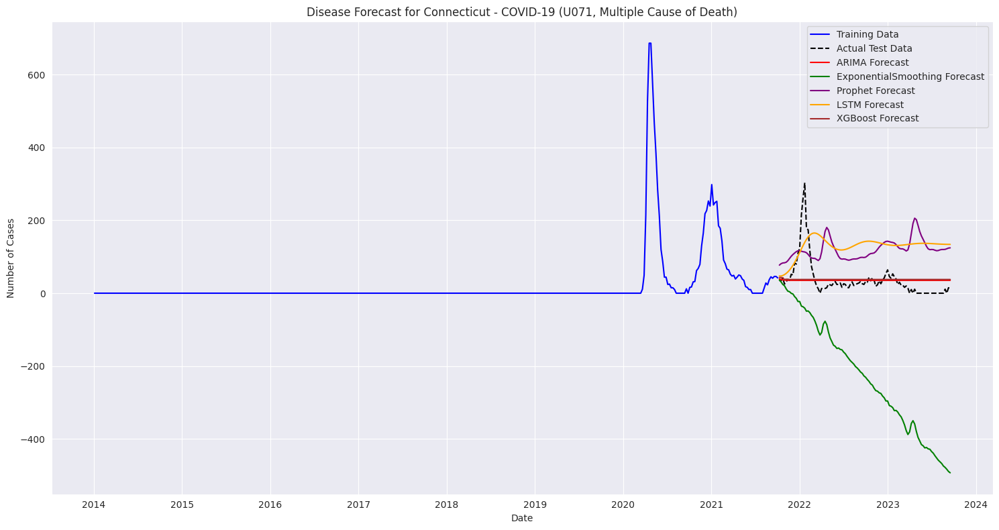


Accuracy Metrics for Connecticut - COVID-19 (U071, Multiple Cause of Death):
                             MAE        RMSE         R2  MAPE
ARIMA                  28.366753   50.468130  -0.000678   inf
ExponentialSmoothing  265.593114  298.708118 -34.055323   inf
Prophet                94.499575  102.794536  -3.151452   inf
LSTM                  100.445734  107.982751  -3.581089   inf
XGBoost                29.531490   50.475510  -0.000971   inf


  Working on disease: COVID-19 (U071, Underlying Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/cm3mkeg7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/qgcxv7c4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58192', 'data', 'file=/tmp/tmpyhfpm2dm/cm3mkeg7.json', 'init=/tmp/tmpyhfpm2dm/qgcxv7c4.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_model971te1_x/prophet_model-20250426110620.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:06:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:06:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


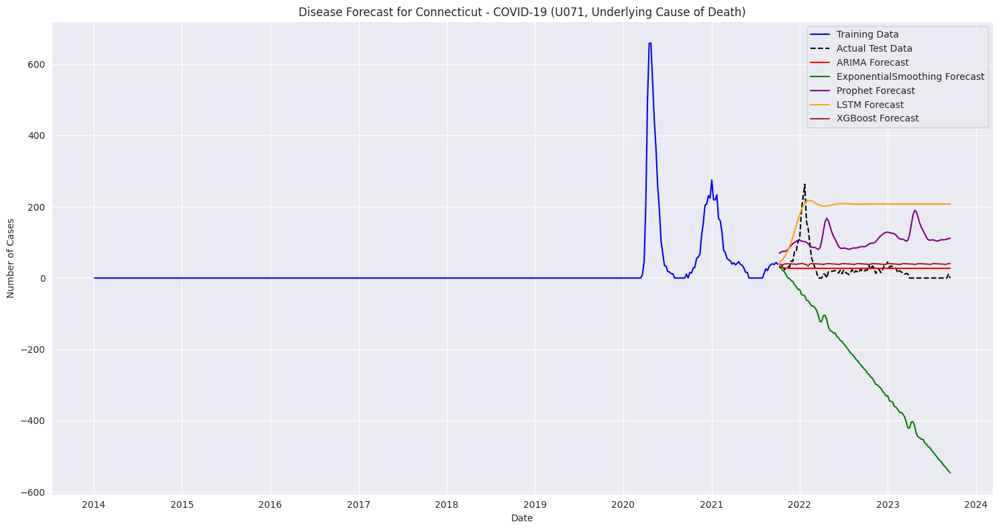


Accuracy Metrics for Connecticut - COVID-19 (U071, Underlying Cause of Death):
                             MAE        RMSE         R2  MAPE
ARIMA                  24.776893   44.550500  -0.001266   inf
ExponentialSmoothing  286.098120  323.625120 -51.835863   inf
Prophet                88.183773   95.826707  -3.632522   inf
LSTM                  166.325818  176.203987 -14.663031   inf
XGBoost                31.931089   45.892903  -0.062516   inf


Forecasting for state: Delaware
  Working on disease: Septicemia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/x_3csqdk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/t9ivw3bj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43428', 'data', 'file=/tmp/tmpyhfpm2dm/x_3csqdk.json', 'init=/tmp/tmpyhfpm2dm/t9ivw3bj.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_model9qy8skt7/prophet_model-20250426110700.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:07:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:07:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


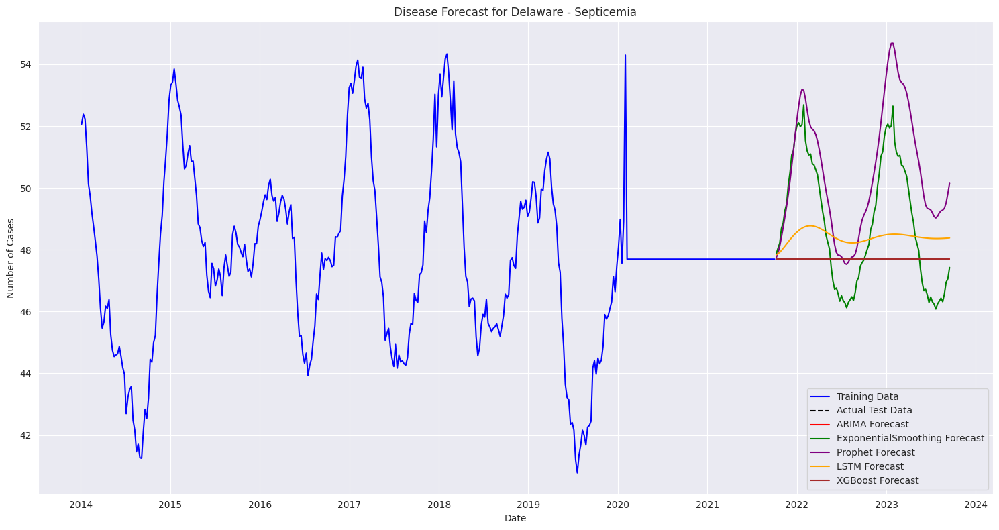


Accuracy Metrics for Delaware - Septicemia:
                               MAE          RMSE            R2          MAPE
ARIMA                 2.130048e-09  2.166378e-09 -9.295830e+10  4.465905e-09
ExponentialSmoothing  1.923812e+00  2.345819e+00 -1.089955e+29  4.033505e+00
Prophet               2.817395e+00  3.460999e+00 -2.372589e+29  5.907010e+00
LSTM                  7.171907e-01  7.407422e-01 -1.086810e+28  1.503677e+00
XGBoost               7.097658e-05  7.097658e-05 -9.978144e+19  1.488110e-04


  Working on disease: Influenza and pneumonia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/bn658v67.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/35330fxu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88633', 'data', 'file=/tmp/tmpyhfpm2dm/bn658v67.json', 'init=/tmp/tmpyhfpm2dm/35330fxu.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_model9iseg1ln/prophet_model-20250426110735.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:07:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:07:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


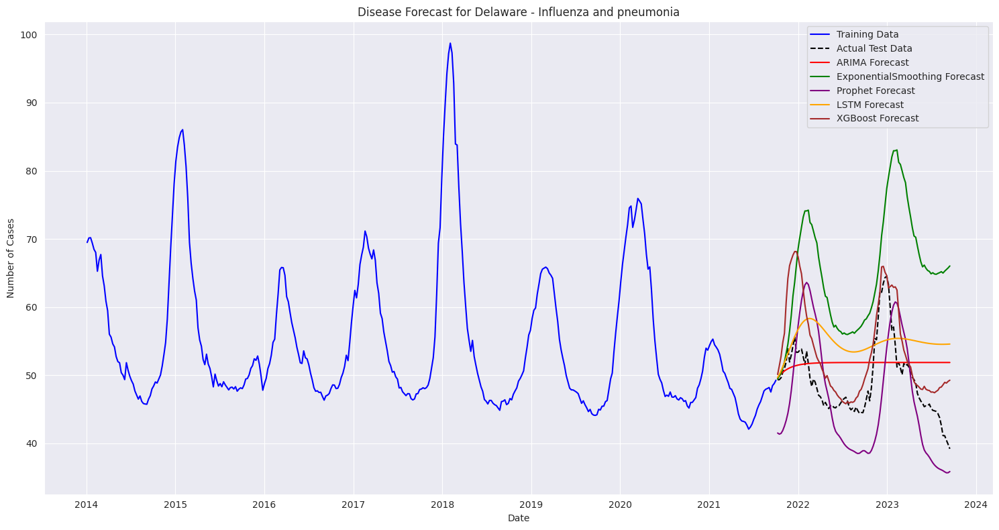


Accuracy Metrics for Delaware - Influenza and pneumonia:
                            MAE       RMSE        R2       MAPE
ARIMA                  5.013741   6.005892 -0.238871  10.480911
ExponentialSmoothing  16.030607  17.742889 -9.812342  33.249928
Prophet                6.832082   7.679485 -1.025514  13.739026
LSTM                   6.943626   7.827630 -1.104417  14.764688
XGBoost                4.355158   5.706965 -0.118617   8.870616


  Working on disease: COVID-19 (U071, Multiple Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/14zt3mp6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/vdb6hi1w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48349', 'data', 'file=/tmp/tmpyhfpm2dm/14zt3mp6.json', 'init=/tmp/tmpyhfpm2dm/vdb6hi1w.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelfilj3e8k/prophet_model-20250426110808.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:08:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:08:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


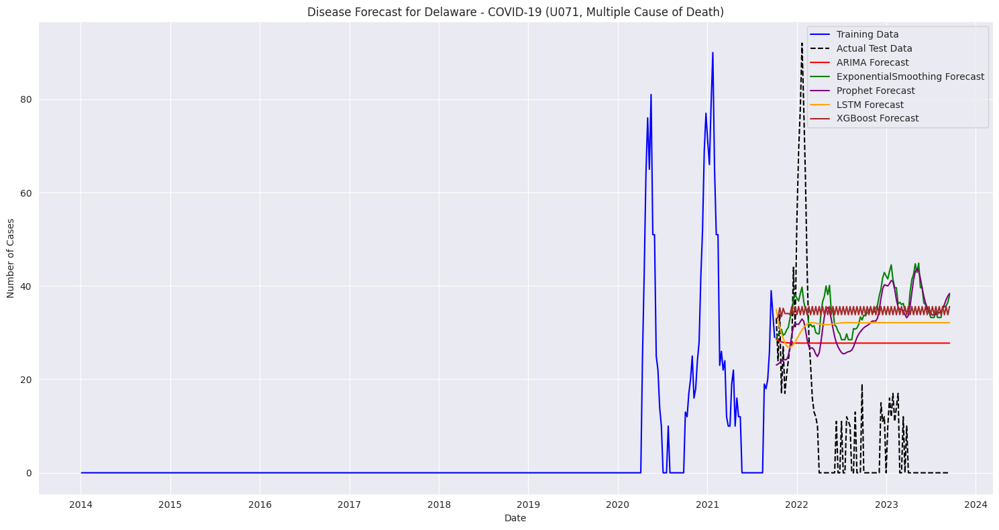


Accuracy Metrics for Delaware - COVID-19 (U071, Multiple Cause of Death):
                            MAE       RMSE        R2  MAPE
ARIMA                 22.664799  24.991695 -0.771314   inf
ExponentialSmoothing  28.343296  30.538770 -1.644888   inf
Prophet               26.826380  29.458324 -1.461049   inf
LSTM                  25.959327  28.140241 -1.245742   inf
XGBoost               28.202264  30.050373 -1.560967   inf


  Working on disease: COVID-19 (U071, Underlying Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/auha288n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/w37jnrkd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21341', 'data', 'file=/tmp/tmpyhfpm2dm/auha288n.json', 'init=/tmp/tmpyhfpm2dm/w37jnrkd.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelnto3vxjt/prophet_model-20250426110841.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:08:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:08:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


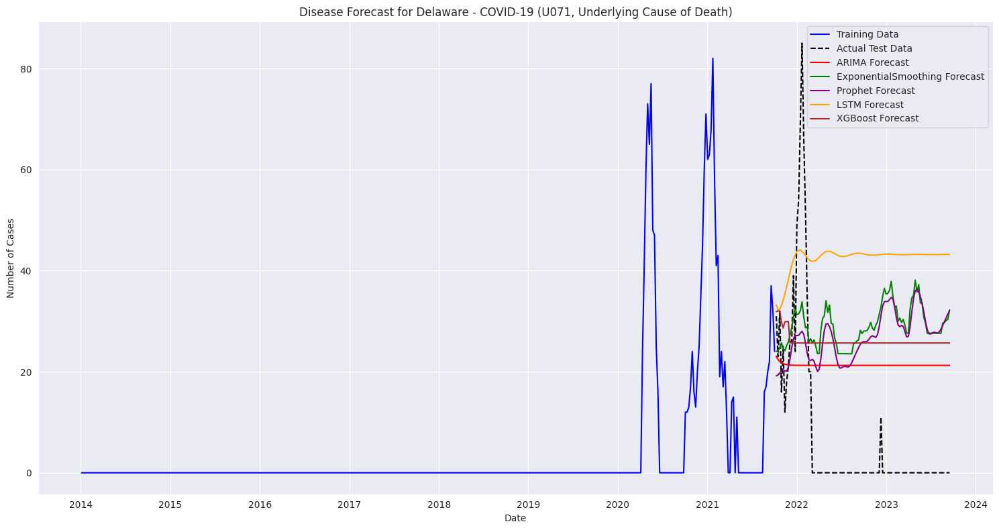


Accuracy Metrics for Delaware - COVID-19 (U071, Underlying Cause of Death):
                            MAE       RMSE        R2  MAPE
ARIMA                 20.048829  21.747346 -0.681542   inf
ExponentialSmoothing  25.944883  27.638252 -1.715916   inf
Prophet               24.786862  26.607951 -1.517202   inf
LSTM                  37.227197  39.171208 -4.455431   inf
XGBoost               23.451960  24.887483 -1.202202   inf


Forecasting for state: District of Columbia
  Working on disease: Septicemia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/2_s32q98.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/71fwe7z2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77764', 'data', 'file=/tmp/tmpyhfpm2dm/2_s32q98.json', 'init=/tmp/tmpyhfpm2dm/71fwe7z2.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelpfds3lie/prophet_model-20250426110913.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:09:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:09:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


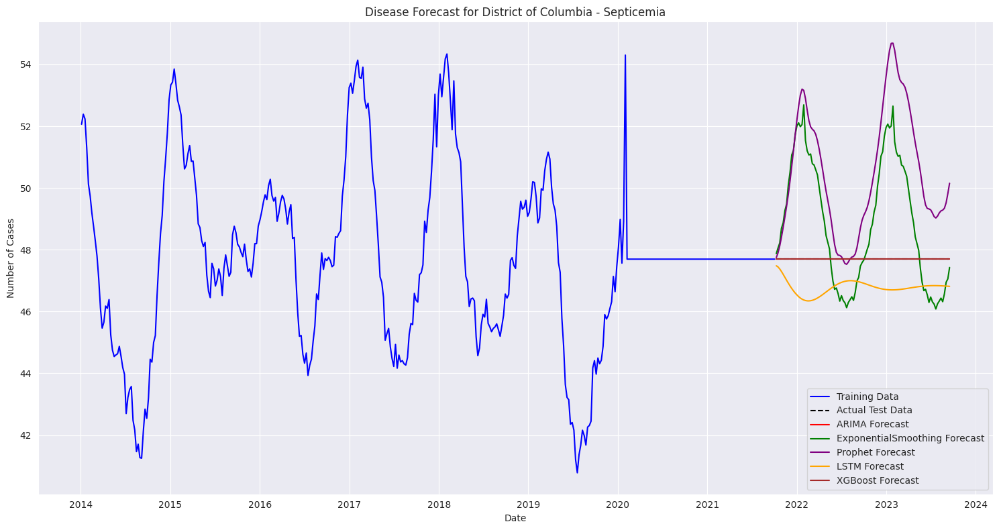


Accuracy Metrics for District of Columbia - Septicemia:
                               MAE          RMSE            R2          MAPE
ARIMA                 2.130048e-09  2.166378e-09 -9.295830e+10  4.465905e-09
ExponentialSmoothing  1.923812e+00  2.345819e+00 -1.089955e+29  4.033505e+00
Prophet               2.817395e+00  3.460999e+00 -2.372589e+29  5.907010e+00
LSTM                  9.122849e-01  9.381256e-01 -1.743177e+28  1.912716e+00
XGBoost               7.097658e-05  7.097658e-05 -9.978144e+19  1.488110e-04


  Working on disease: Influenza and pneumonia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/k5b3mwtf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/ppp77a5g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85089', 'data', 'file=/tmp/tmpyhfpm2dm/k5b3mwtf.json', 'init=/tmp/tmpyhfpm2dm/ppp77a5g.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_model1jq3j57a/prophet_model-20250426110945.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:09:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:09:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


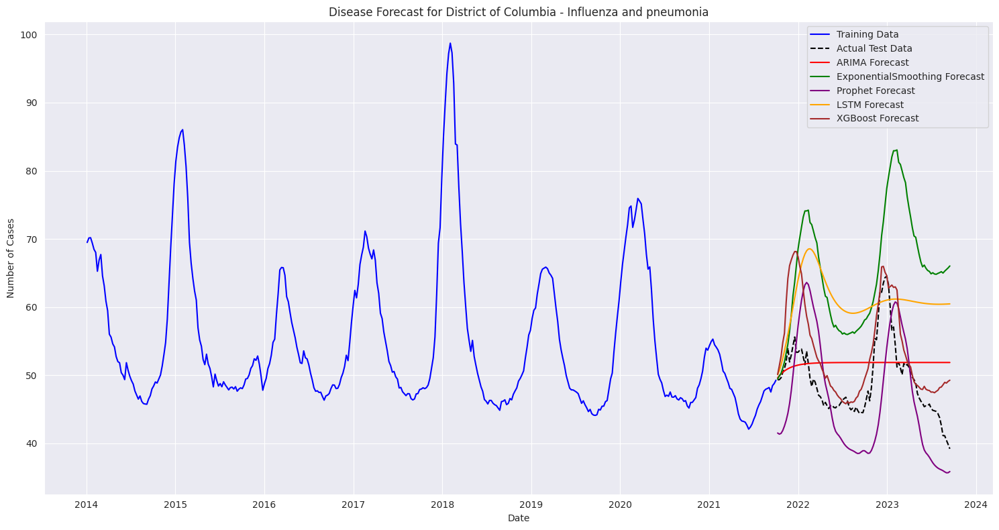


Accuracy Metrics for District of Columbia - Influenza and pneumonia:
                            MAE       RMSE        R2       MAPE
ARIMA                  5.013741   6.005892 -0.238871  10.480911
ExponentialSmoothing  16.030607  17.742889 -9.812342  33.249928
Prophet                6.832082   7.679485 -1.025514  13.739026
LSTM                  12.002370  13.242925 -5.023362  25.581869
XGBoost                4.355158   5.706965 -0.118617   8.870616


  Working on disease: COVID-19 (U071, Multiple Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/77ai_ox3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/nqebrxlx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11421', 'data', 'file=/tmp/tmpyhfpm2dm/77ai_ox3.json', 'init=/tmp/tmpyhfpm2dm/nqebrxlx.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelh1qmw4a_/prophet_model-20250426111016.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:10:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:10:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


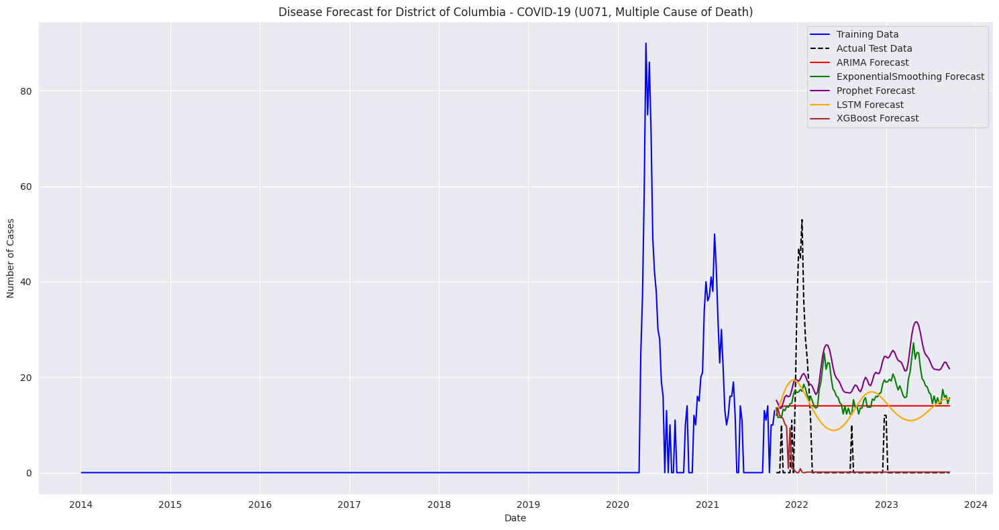


Accuracy Metrics for District of Columbia - COVID-19 (U071, Multiple Cause of Death):
                            MAE       RMSE        R2  MAPE
ARIMA                 13.807534  14.631498 -1.018005   inf
ExponentialSmoothing  16.059573  16.988700 -1.720601   inf
Prophet               20.060394  20.977261 -3.148032   inf
LSTM                  12.945626  13.783919 -0.790977   inf
XGBoost                4.351042  11.194666 -0.181318   inf


  Working on disease: COVID-19 (U071, Underlying Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/2sqk04e8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/pbzmzoh8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93876', 'data', 'file=/tmp/tmpyhfpm2dm/2sqk04e8.json', 'init=/tmp/tmpyhfpm2dm/pbzmzoh8.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelt8bnhlr7/prophet_model-20250426111047.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:10:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:10:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


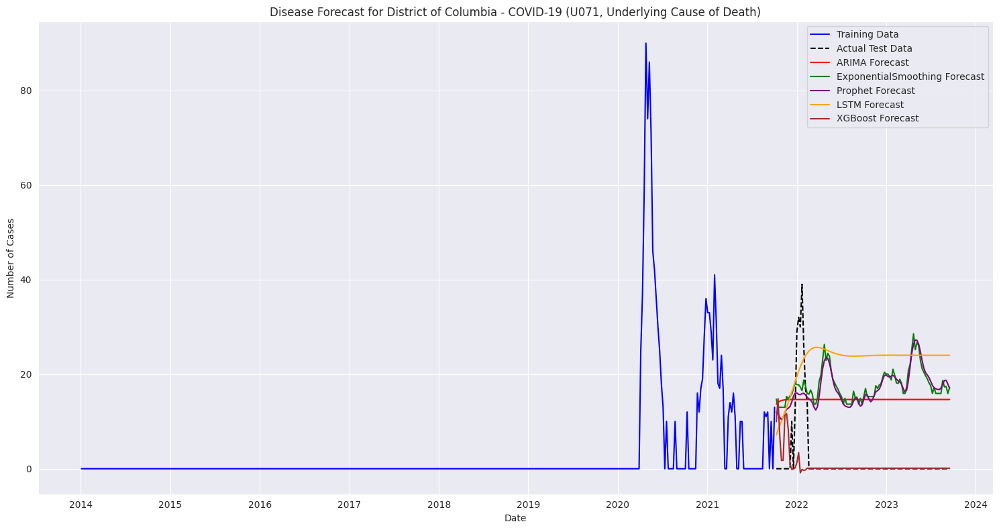


Accuracy Metrics for District of Columbia - COVID-19 (U071, Underlying Cause of Death):
                            MAE       RMSE        R2  MAPE
ARIMA                 14.230554  14.474236 -3.044433   inf
ExponentialSmoothing  16.906944  17.514505 -4.921914   inf
Prophet               16.504185  17.173306 -4.693432   inf
LSTM                  21.602278  22.339408 -8.634068   inf
XGBoost                2.782703   7.811578 -0.177996   inf


Forecasting for state: Georgia
  Working on disease: Septicemia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/a89h_esv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/h8of2qj6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67281', 'data', 'file=/tmp/tmpyhfpm2dm/a89h_esv.json', 'init=/tmp/tmpyhfpm2dm/h8of2qj6.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelo7xu3l7i/prophet_model-20250426111119.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:11:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:11:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


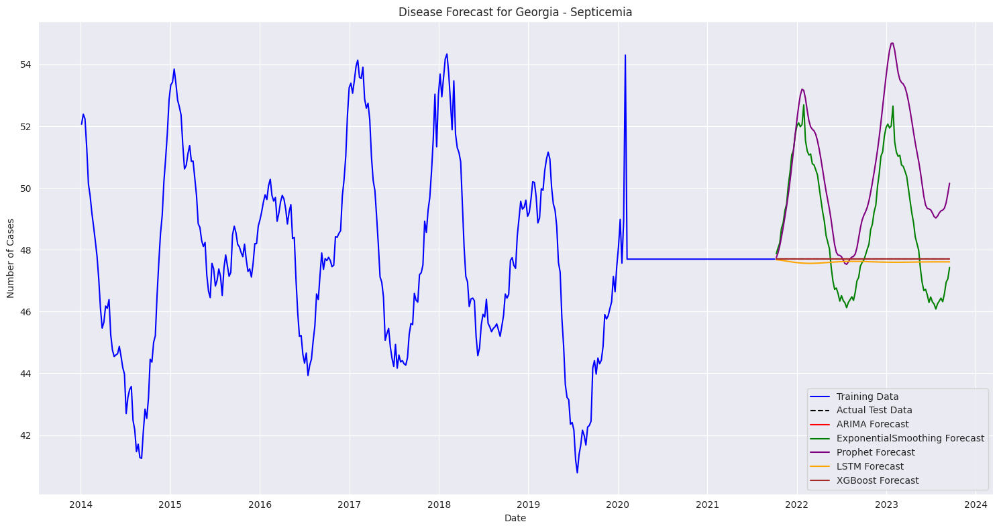


Accuracy Metrics for Georgia - Septicemia:
                               MAE          RMSE            R2          MAPE
ARIMA                 2.130048e-09  2.166378e-09 -9.295830e+10  4.465905e-09
ExponentialSmoothing  1.923812e+00  2.345819e+00 -1.089955e+29  4.033505e+00
Prophet               2.817395e+00  3.460999e+00 -2.372589e+29  5.907010e+00
LSTM                  9.261805e-02  9.527063e-02 -1.797785e+26  1.941850e-01
XGBoost               7.097658e-05  7.097658e-05 -9.978144e+19  1.488110e-04


  Working on disease: Influenza and pneumonia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/y7ijo8tf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/uyxi9inw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20980', 'data', 'file=/tmp/tmpyhfpm2dm/y7ijo8tf.json', 'init=/tmp/tmpyhfpm2dm/uyxi9inw.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_model_vtt_4s1/prophet_model-20250426111150.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:11:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:11:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


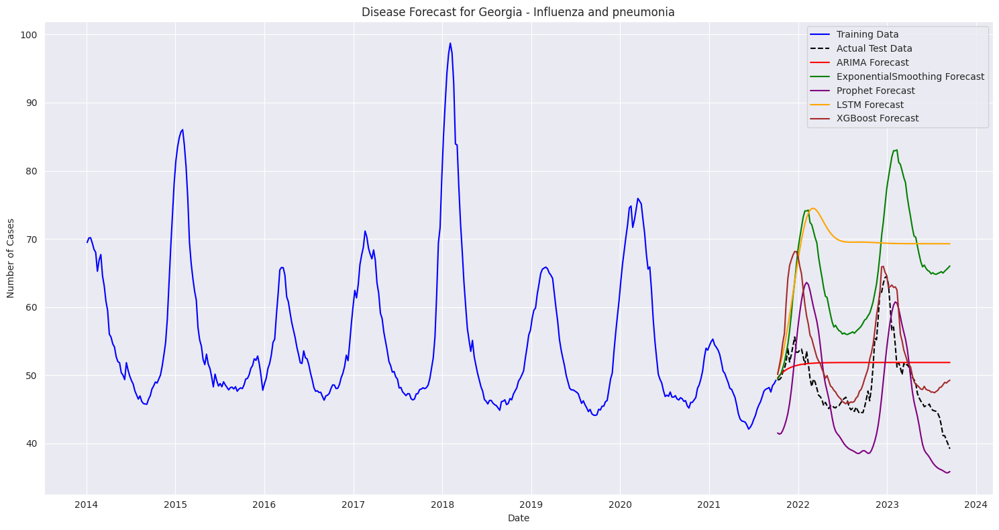


Accuracy Metrics for Georgia - Influenza and pneumonia:
                            MAE       RMSE         R2       MAPE
ARIMA                  5.013741   6.005892  -0.238871  10.480911
ExponentialSmoothing  16.030607  17.742889  -9.812342  33.249928
Prophet                6.832082   7.679485  -1.025514  13.739026
LSTM                  19.314948  20.786713 -13.840303  40.960255
XGBoost                4.355158   5.706965  -0.118617   8.870616


  Working on disease: COVID-19 (U071, Multiple Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/1omkpnsb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/dsip1h7h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18585', 'data', 'file=/tmp/tmpyhfpm2dm/1omkpnsb.json', 'init=/tmp/tmpyhfpm2dm/dsip1h7h.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_model5d888vao/prophet_model-20250426111222.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:12:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:12:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


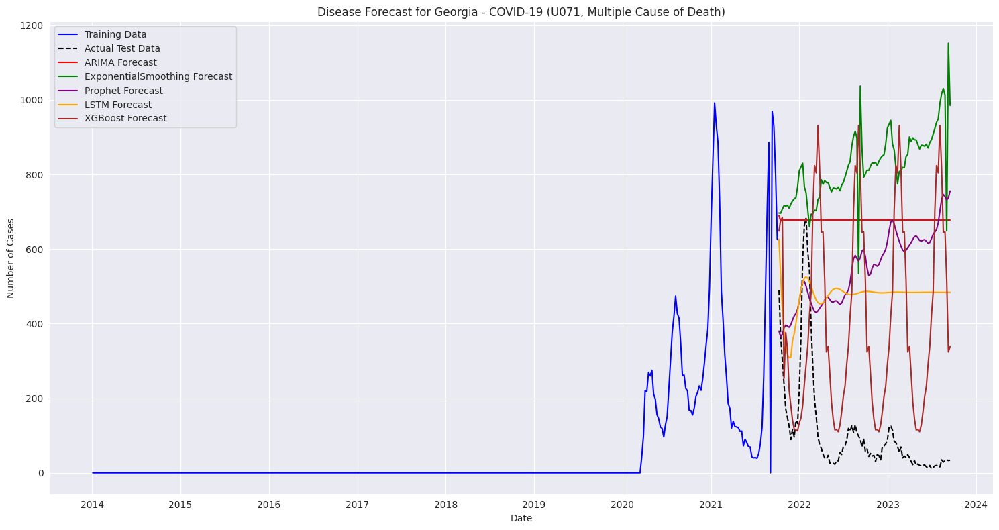


Accuracy Metrics for Georgia - COVID-19 (U071, Multiple Cause of Death):
                             MAE        RMSE         R2         MAPE
ARIMA                 566.898952  584.395234 -15.809812  1411.305134
ExponentialSmoothing  712.573013  740.199257 -25.967881  1813.894860
Prophet               450.108503  481.533427 -10.413068  1211.535058
LSTM                  372.449244  389.561562  -6.469675   970.770535
XGBoost               337.963997  418.804042  -7.633189   768.083337


  Working on disease: COVID-19 (U071, Underlying Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/x_odj0nz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/ikci1lze.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2496', 'data', 'file=/tmp/tmpyhfpm2dm/x_odj0nz.json', 'init=/tmp/tmpyhfpm2dm/ikci1lze.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_model738j0nax/prophet_model-20250426111253.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:12:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:12:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


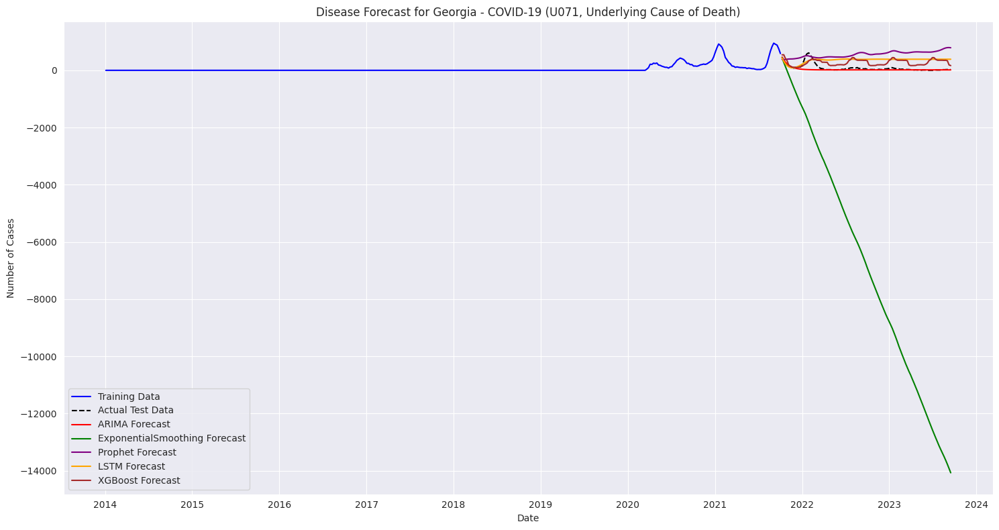


Accuracy Metrics for Georgia - COVID-19 (U071, Underlying Cause of Death):
                              MAE         RMSE           R2  MAPE
ARIMA                   57.741792   128.516166    -0.001361   inf
ExponentialSmoothing  6928.102542  8082.818067 -3959.961850   inf
Prophet                476.102635   510.262667   -14.785656   inf
LSTM                   291.867098   314.557664    -4.998955   inf
XGBoost                213.085499   236.573436    -2.393181   inf


Forecasting for state: Hawaii
  Working on disease: Septicemia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/2xdiz_sl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/uaq21evn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28601', 'data', 'file=/tmp/tmpyhfpm2dm/2xdiz_sl.json', 'init=/tmp/tmpyhfpm2dm/uaq21evn.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modeluofffqhp/prophet_model-20250426111324.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:13:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:13:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


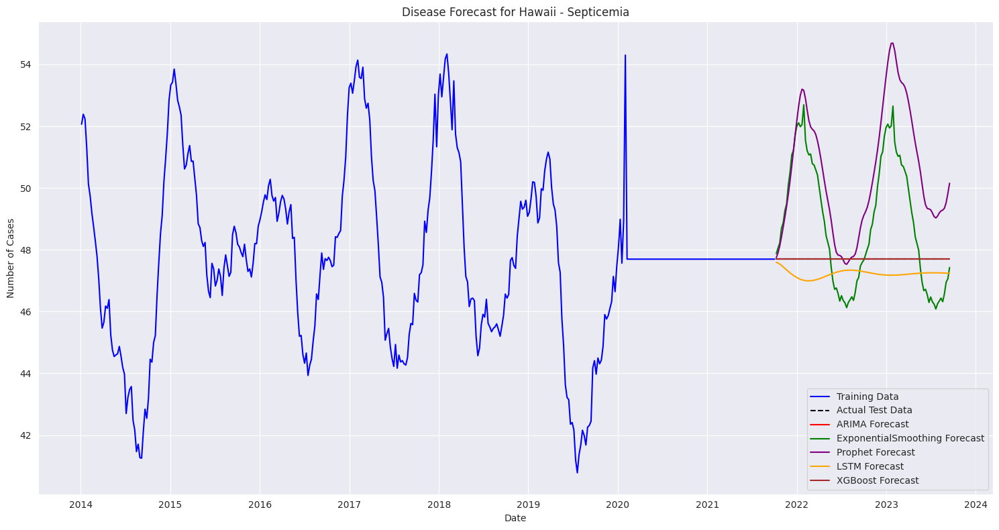


Accuracy Metrics for Hawaii - Septicemia:
                               MAE          RMSE            R2          MAPE
ARIMA                 2.130048e-09  2.166378e-09 -9.295830e+10  4.465905e-09
ExponentialSmoothing  1.923812e+00  2.345819e+00 -1.089955e+29  4.033505e+00
Prophet               2.817395e+00  3.460999e+00 -2.372589e+29  5.907010e+00
LSTM                  4.714692e-01  4.853091e-01 -4.665051e+27  9.884924e-01
XGBoost               7.097658e-05  7.097658e-05 -9.978144e+19  1.488110e-04


  Working on disease: Influenza and pneumonia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/6hqmxhn3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/fctk4jc7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73472', 'data', 'file=/tmp/tmpyhfpm2dm/6hqmxhn3.json', 'init=/tmp/tmpyhfpm2dm/fctk4jc7.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelzh651txx/prophet_model-20250426111355.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:13:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:13:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


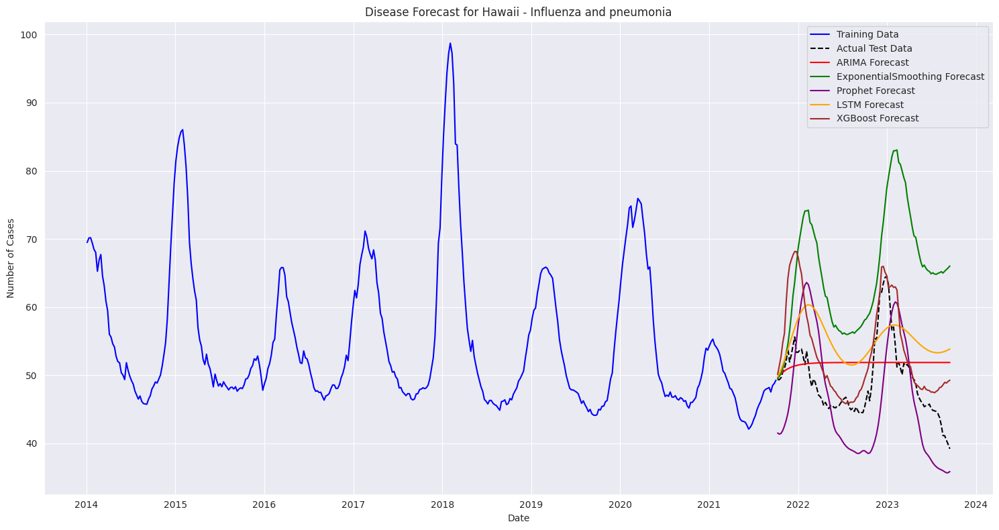


Accuracy Metrics for Hawaii - Influenza and pneumonia:
                            MAE       RMSE        R2       MAPE
ARIMA                  5.013741   6.005892 -0.238871  10.480911
ExponentialSmoothing  16.030607  17.742889 -9.812342  33.249928
Prophet                6.832082   7.679485 -1.025514  13.739026
LSTM                   6.740080   7.504423 -0.934219  14.267816
XGBoost                4.355158   5.706965 -0.118617   8.870616


  Working on disease: COVID-19 (U071, Multiple Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/l6q1z55h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/elik4fq0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94762', 'data', 'file=/tmp/tmpyhfpm2dm/l6q1z55h.json', 'init=/tmp/tmpyhfpm2dm/elik4fq0.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_model4x4q8y99/prophet_model-20250426111426.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:14:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:14:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


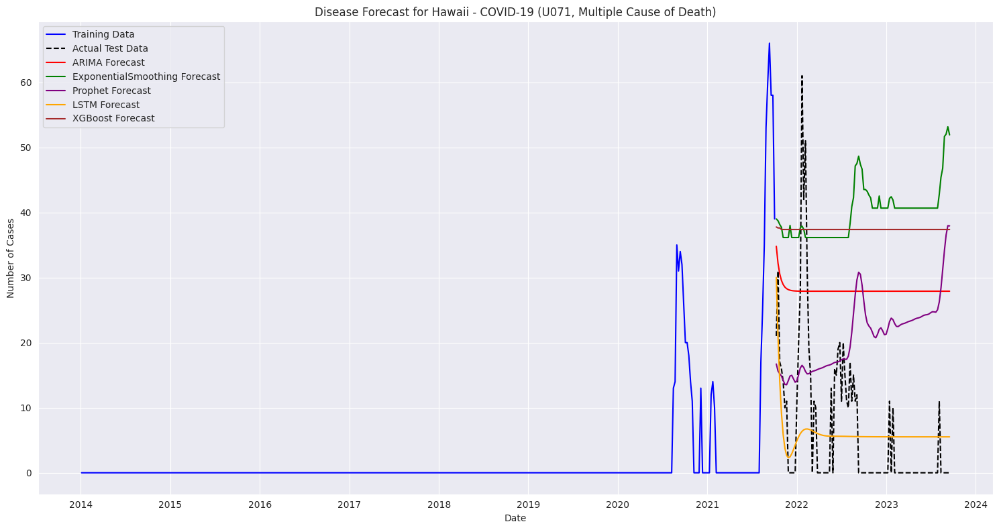


Accuracy Metrics for Hawaii - COVID-19 (U071, Multiple Cause of Death):
                            MAE       RMSE        R2  MAPE
ARIMA                 22.975031  24.180709 -3.666183   inf
ExponentialSmoothing  34.287958  35.919624 -9.296443   inf
Prophet               17.877396  20.383985 -2.315903   inf
LSTM                   7.697710  10.641213  0.096338   inf
XGBoost               31.668113  32.811427 -7.591597   inf


  Working on disease: COVID-19 (U071, Underlying Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/fl5er5q7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/fs2slt3s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91871', 'data', 'file=/tmp/tmpyhfpm2dm/fl5er5q7.json', 'init=/tmp/tmpyhfpm2dm/fs2slt3s.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelbktlg5s6/prophet_model-20250426111457.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:14:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:14:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


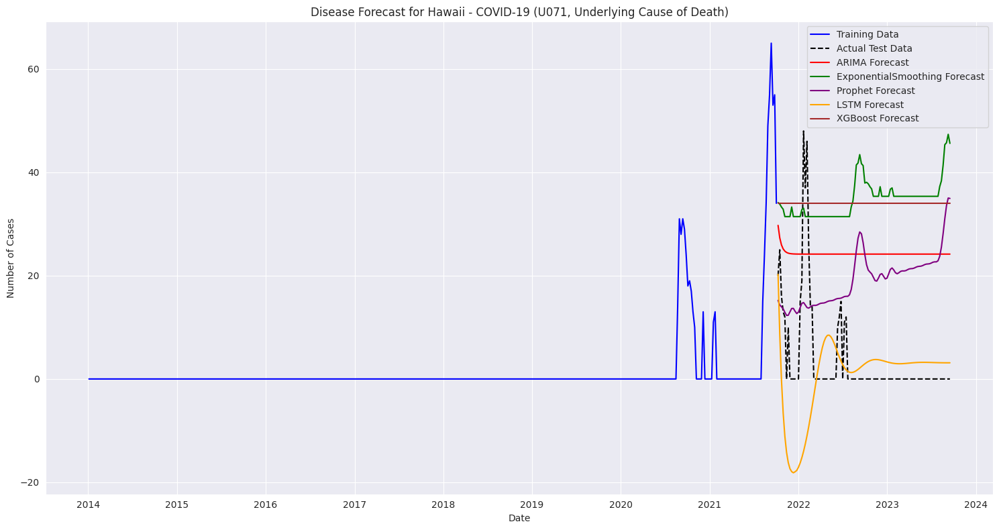


Accuracy Metrics for Hawaii - COVID-19 (U071, Underlying Cause of Death):
                            MAE       RMSE         R2  MAPE
ARIMA                 21.801903  22.473378  -5.066111   inf
ExponentialSmoothing  31.836078  32.957008 -12.045755   inf
Prophet               17.945110  19.613410  -3.620403   inf
LSTM                   8.231324  13.830181  -1.297362   inf
XGBoost               30.892566  31.667031 -11.044488   inf


Forecasting for state: Illinois
  Working on disease: Septicemia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/kqeqpyg8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/qa5zx25_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82927', 'data', 'file=/tmp/tmpyhfpm2dm/kqeqpyg8.json', 'init=/tmp/tmpyhfpm2dm/qa5zx25_.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelcdug0itx/prophet_model-20250426111528.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:15:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:15:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


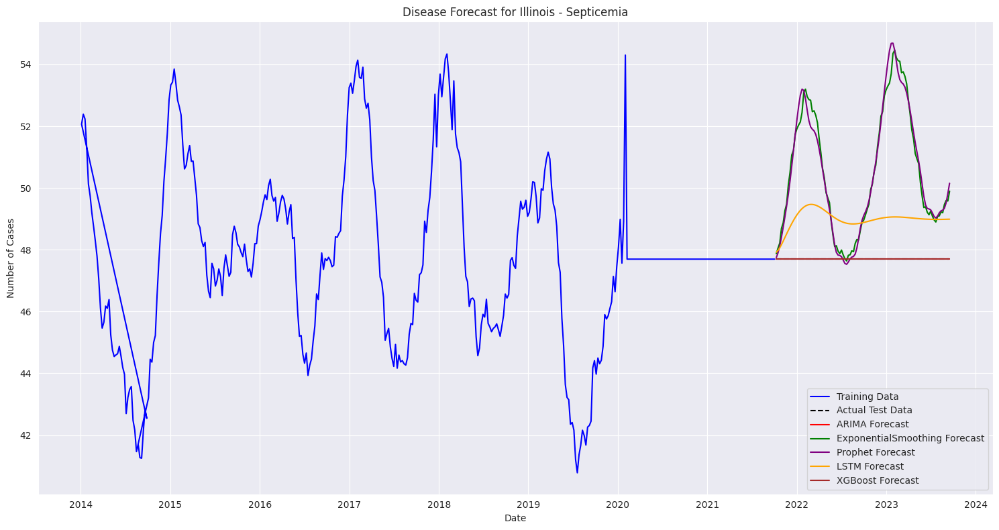


Accuracy Metrics for Illinois - Septicemia:
                               MAE          RMSE            R2      MAPE
ARIMA                 8.665939e-11  8.760411e-11 -1.520087e+08       NaN
ExponentialSmoothing  2.829940e+00  3.455293e+00 -2.364772e+29       NaN
Prophet               2.817395e+00  3.460999e+00 -2.372589e+29  5.907010
LSTM                  1.292706e+00  1.323008e+00 -3.466924e+28  2.710314
XGBoost               2.520021e-05  2.520021e-05 -1.257848e+19  0.000053


  Working on disease: Influenza and pneumonia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/hupv1n77.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/ypdhf3x1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56138', 'data', 'file=/tmp/tmpyhfpm2dm/hupv1n77.json', 'init=/tmp/tmpyhfpm2dm/ypdhf3x1.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelm3l54w4q/prophet_model-20250426111558.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:15:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:15:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


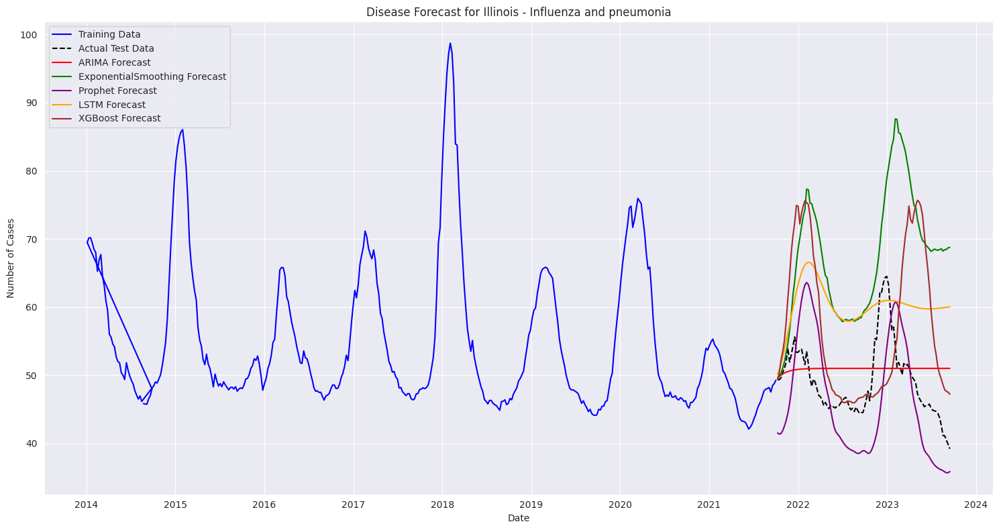


Accuracy Metrics for Illinois - Influenza and pneumonia:
                            MAE       RMSE         R2       MAPE
ARIMA                  4.683195   5.687604  -0.111040        NaN
ExponentialSmoothing  18.369542  20.351029 -13.224724        NaN
Prophet                6.832082   7.679485  -1.025514  13.739026
LSTM                  11.233321  12.345165  -4.234376  23.950970
XGBoost               10.795349  13.810158  -5.550409  21.631046


  Working on disease: COVID-19 (U071, Multiple Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/t2zgrwxc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/jcu_ng__.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72031', 'data', 'file=/tmp/tmpyhfpm2dm/t2zgrwxc.json', 'init=/tmp/tmpyhfpm2dm/jcu_ng__.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_model3p_ozzbk/prophet_model-20250426111630.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:16:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:16:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


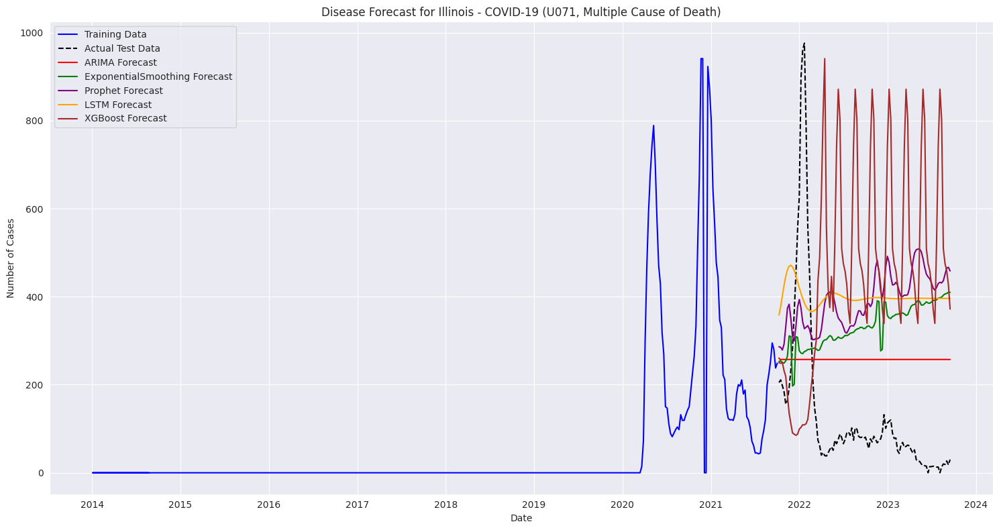


Accuracy Metrics for Illinois - COVID-19 (U071, Multiple Cause of Death):
                             MAE        RMSE        R2  MAPE
ARIMA                 202.815031  229.842502 -0.384934   NaN
ExponentialSmoothing  273.728165  297.252847 -1.316437   NaN
Prophet               317.957532  340.255918 -2.035148   inf
LSTM                  315.551439  327.173460 -1.806239   inf
XGBoost               448.995147  500.777331 -5.574426   inf


  Working on disease: COVID-19 (U071, Underlying Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/xtrpwzhd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/vu4piz2c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17898', 'data', 'file=/tmp/tmpyhfpm2dm/xtrpwzhd.json', 'init=/tmp/tmpyhfpm2dm/vu4piz2c.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelkmfg0qex/prophet_model-20250426111700.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:17:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:17:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


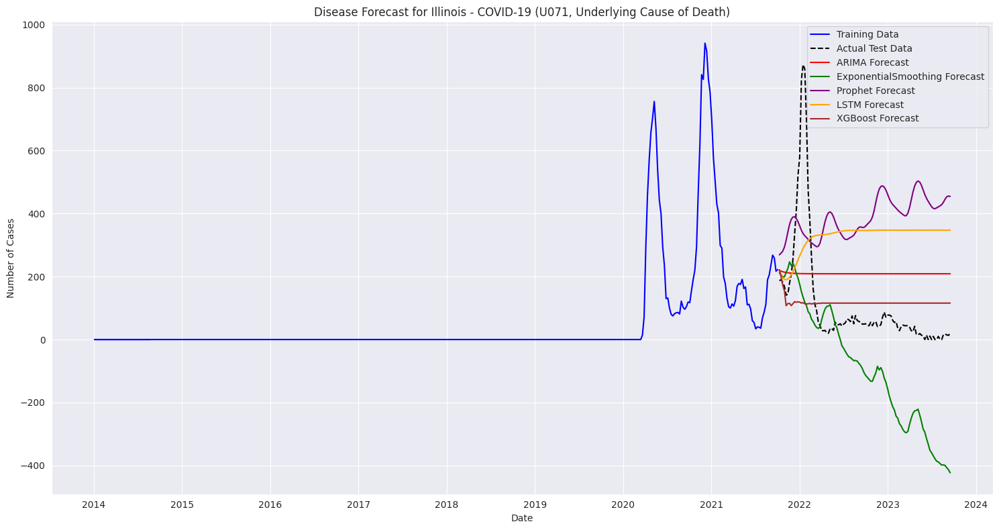


Accuracy Metrics for Illinois - COVID-19 (U071, Underlying Cause of Death):
                             MAE        RMSE        R2  MAPE
ARIMA                 176.259786  203.964822 -0.301810   NaN
ExponentialSmoothing  216.774626  268.185585 -1.250651   NaN
Prophet               327.375956  346.998107 -2.767831   inf
LSTM                  277.398644  296.210156 -1.745599   inf
XGBoost               112.963351  178.388991  0.004197   inf


Forecasting for state: Idaho
  Working on disease: Septicemia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/jzcnvrn9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/0p0dr6st.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8771', 'data', 'file=/tmp/tmpyhfpm2dm/jzcnvrn9.json', 'init=/tmp/tmpyhfpm2dm/0p0dr6st.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelg9heqcvs/prophet_model-20250426111732.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:17:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:17:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


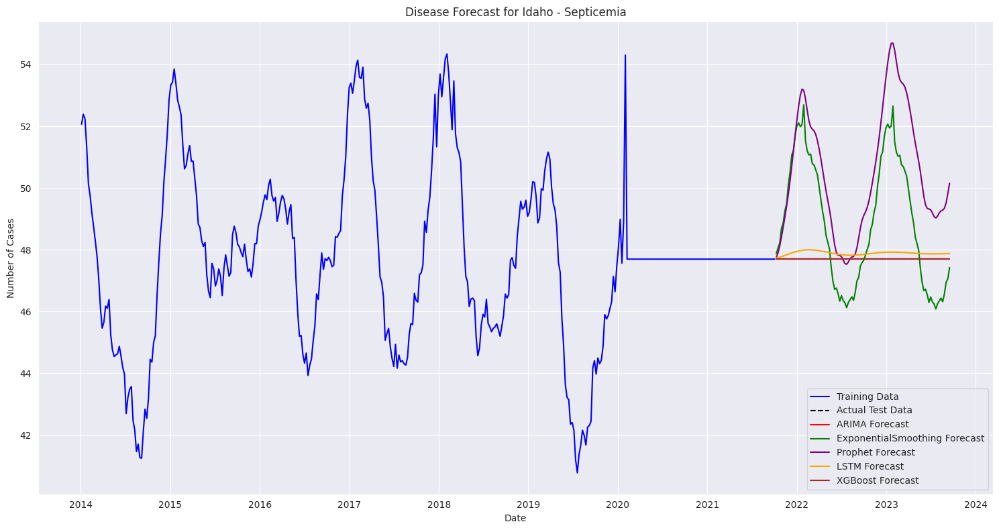


Accuracy Metrics for Idaho - Septicemia:
                               MAE          RMSE            R2          MAPE
ARIMA                 2.130048e-09  2.166378e-09 -9.295830e+10  4.465905e-09
ExponentialSmoothing  1.923812e+00  2.345819e+00 -1.089955e+29  4.033505e+00
Prophet               2.817395e+00  3.460999e+00 -2.372589e+29  5.907010e+00
LSTM                  1.926488e-01  2.003345e-01 -7.949338e+26  4.039116e-01
XGBoost               7.097658e-05  7.097658e-05 -9.978144e+19  1.488110e-04


  Working on disease: Influenza and pneumonia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/6z1ko0l6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/asihh9bd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65410', 'data', 'file=/tmp/tmpyhfpm2dm/6z1ko0l6.json', 'init=/tmp/tmpyhfpm2dm/asihh9bd.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelnh0mbk8m/prophet_model-20250426111802.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:18:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:18:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


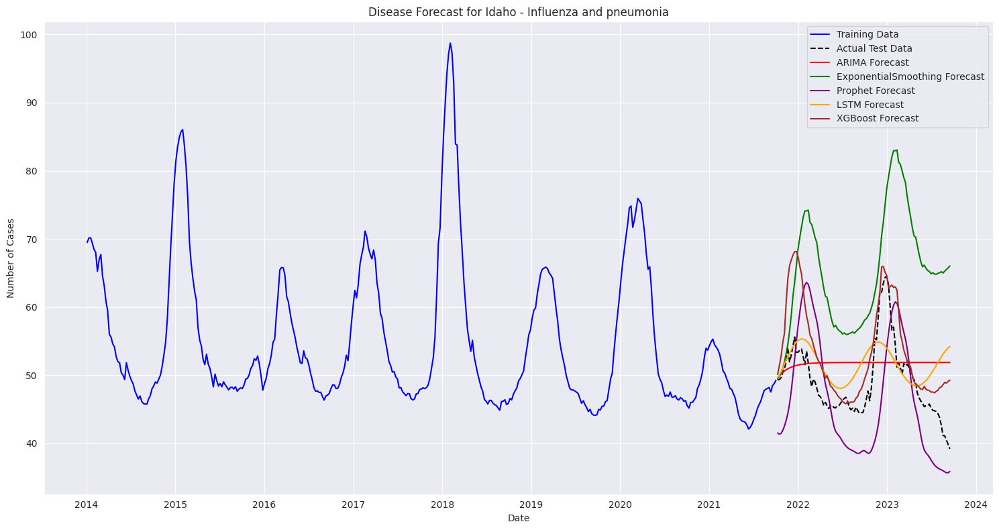


Accuracy Metrics for Idaho - Influenza and pneumonia:
                            MAE       RMSE        R2       MAPE
ARIMA                  5.013741   6.005892 -0.238871  10.480911
ExponentialSmoothing  16.030607  17.742889 -9.812342  33.249928
Prophet                6.832082   7.679485 -1.025514  13.739026
LSTM                   4.176984   5.321743  0.027300   8.803683
XGBoost                4.355158   5.706965 -0.118617   8.870616


  Working on disease: COVID-19 (U071, Multiple Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/0ivw8khk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/y7_58fww.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56169', 'data', 'file=/tmp/tmpyhfpm2dm/0ivw8khk.json', 'init=/tmp/tmpyhfpm2dm/y7_58fww.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelijeys753/prophet_model-20250426111834.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:18:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:18:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


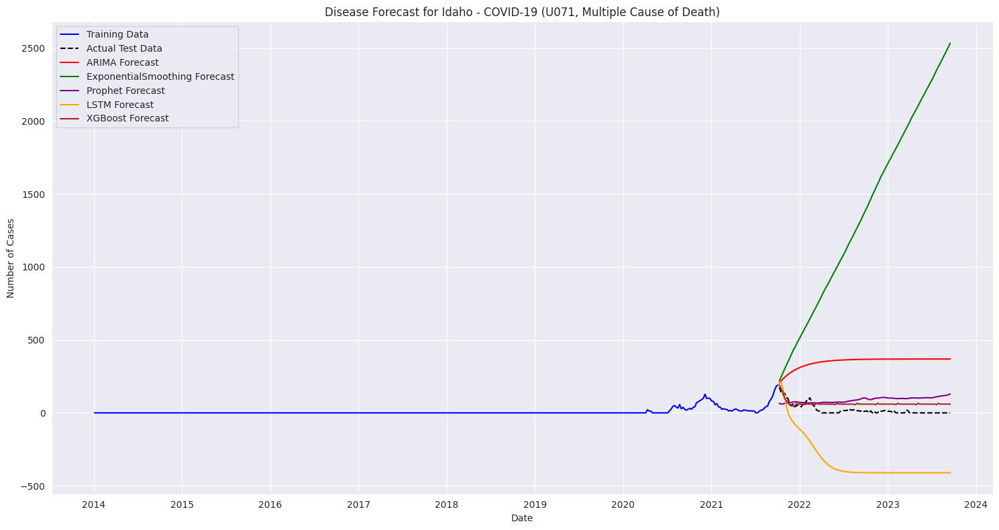


Accuracy Metrics for Idaho - COVID-19 (U071, Multiple Cause of Death):
                              MAE         RMSE           R2  MAPE
ARIMA                  327.814896   335.132878   -88.715308   inf
ExponentialSmoothing  1362.165372  1530.163329 -1869.286162   inf
Prophet                 76.739318    82.593303    -4.449067   inf
LSTM                   349.862900   367.921321  -107.129052   inf
XGBoost                 46.056604    49.364971    -0.946571   inf


  Working on disease: COVID-19 (U071, Underlying Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/bwgve0q6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/wmdszpsf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46851', 'data', 'file=/tmp/tmpyhfpm2dm/bwgve0q6.json', 'init=/tmp/tmpyhfpm2dm/wmdszpsf.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelsmih2dtf/prophet_model-20250426111915.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:19:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:19:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


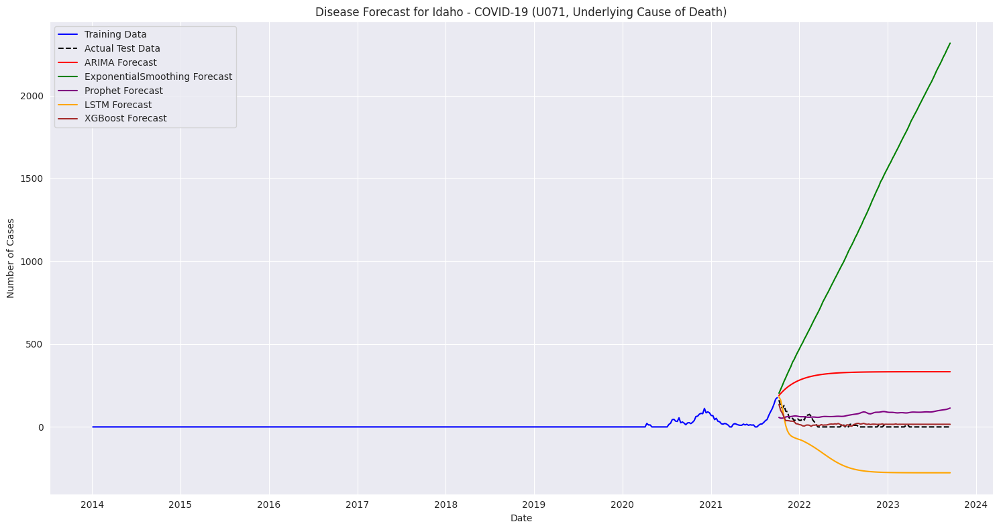


Accuracy Metrics for Idaho - COVID-19 (U071, Underlying Cause of Death):
                              MAE         RMSE           R2  MAPE
ARIMA                  299.664702   306.147440   -88.517619   inf
ExponentialSmoothing  1249.817245  1402.447507 -1877.540175   inf
Prophet                 69.625874    74.858875    -4.352219   inf
LSTM                   224.278774   235.293639   -51.877100   inf
XGBoost                 18.899021    23.097326     0.490469   inf


Forecasting for state: Indiana
  Working on disease: Septicemia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/t52xfgc6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/ys68arfp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54652', 'data', 'file=/tmp/tmpyhfpm2dm/t52xfgc6.json', 'init=/tmp/tmpyhfpm2dm/ys68arfp.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_model_p7_i8wb/prophet_model-20250426111948.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:19:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:19:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


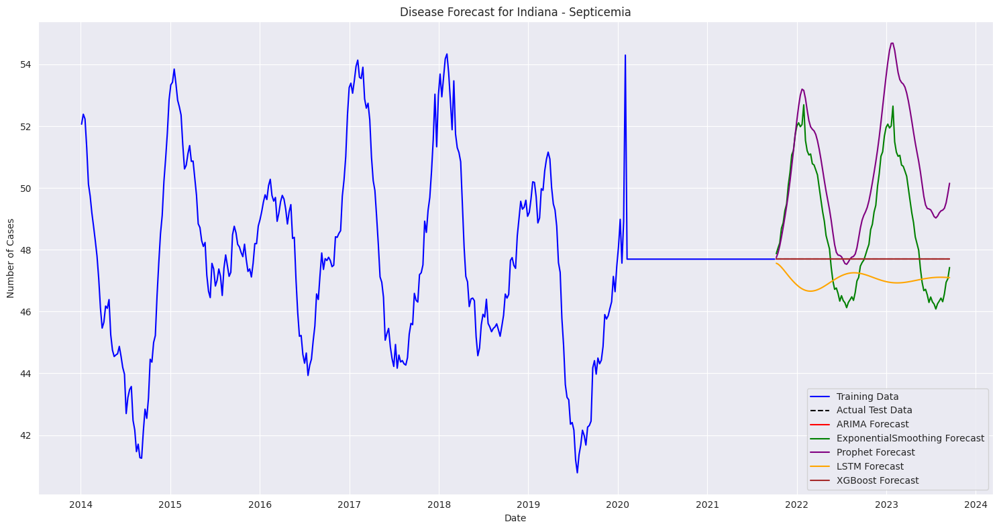


Accuracy Metrics for Indiana - Septicemia:
                               MAE          RMSE            R2          MAPE
ARIMA                 2.130048e-09  2.166378e-09 -9.295830e+10  4.465905e-09
ExponentialSmoothing  1.923812e+00  2.345819e+00 -1.089955e+29  4.033505e+00
Prophet               2.817395e+00  3.460999e+00 -2.372589e+29  5.907010e+00
LSTM                  6.625451e-01  6.893786e-01 -9.413153e+27  1.389106e+00
XGBoost               7.097658e-05  7.097658e-05 -9.978144e+19  1.488110e-04


  Working on disease: Influenza and pneumonia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/dnknl3ho.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/l4bbfwx2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38120', 'data', 'file=/tmp/tmpyhfpm2dm/dnknl3ho.json', 'init=/tmp/tmpyhfpm2dm/l4bbfwx2.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelaotls34w/prophet_model-20250426112022.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:20:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:20:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


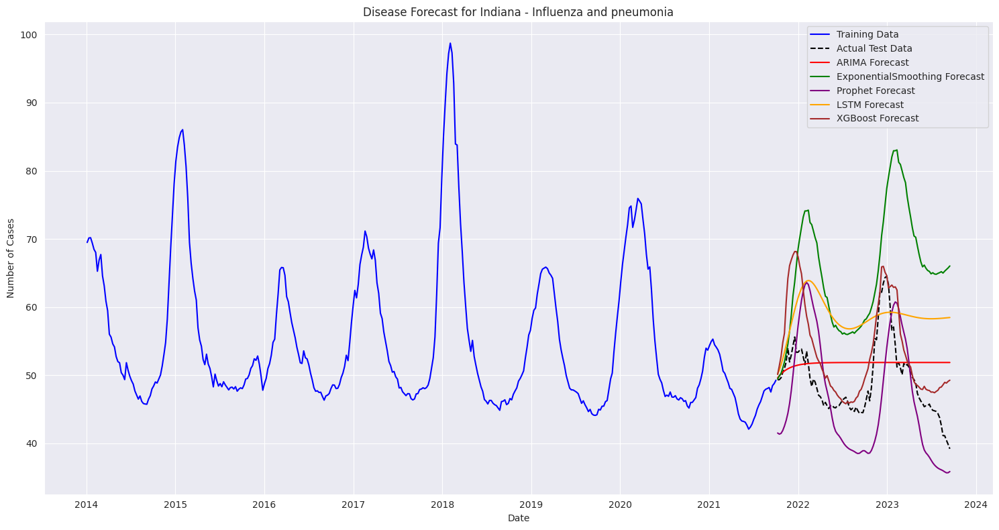


Accuracy Metrics for Indiana - Influenza and pneumonia:
                            MAE       RMSE        R2       MAPE
ARIMA                  5.013741   6.005892 -0.238871  10.480911
ExponentialSmoothing  16.030607  17.742889 -9.812342  33.249928
Prophet                6.832082   7.679485 -1.025514  13.739026
LSTM                   9.925035  10.935417 -3.107162  21.178795
XGBoost                4.355158   5.706965 -0.118617   8.870616


  Working on disease: COVID-19 (U071, Multiple Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/old4omah.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/laulxryq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33754', 'data', 'file=/tmp/tmpyhfpm2dm/old4omah.json', 'init=/tmp/tmpyhfpm2dm/laulxryq.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modeldfpu5rsf/prophet_model-20250426112054.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:20:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:20:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


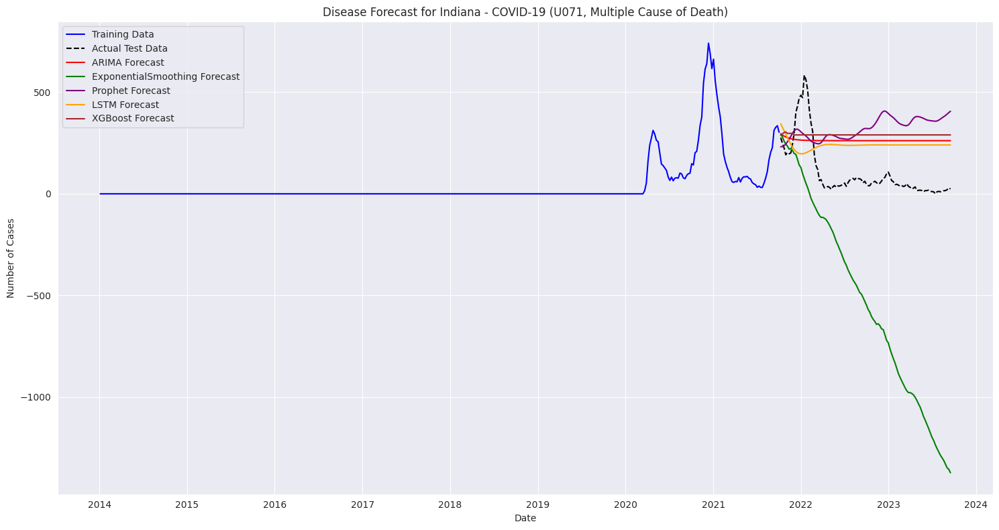


Accuracy Metrics for Indiana - COVID-19 (U071, Multiple Cause of Death):
                             MAE        RMSE         R2  MAPE
ARIMA                 198.321101  207.183683  -1.274203   inf
ExponentialSmoothing  644.943547  760.975765 -29.680316   inf
Prophet               251.726335  270.252620  -2.869528   inf
LSTM                  188.393008  197.267287  -1.061714   inf
XGBoost               219.427487  229.316688  -1.786054   inf


  Working on disease: COVID-19 (U071, Underlying Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/4c4jrqbm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/4dkufyik.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26864', 'data', 'file=/tmp/tmpyhfpm2dm/4c4jrqbm.json', 'init=/tmp/tmpyhfpm2dm/4dkufyik.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_model7qctmetd/prophet_model-20250426112127.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:21:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:21:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


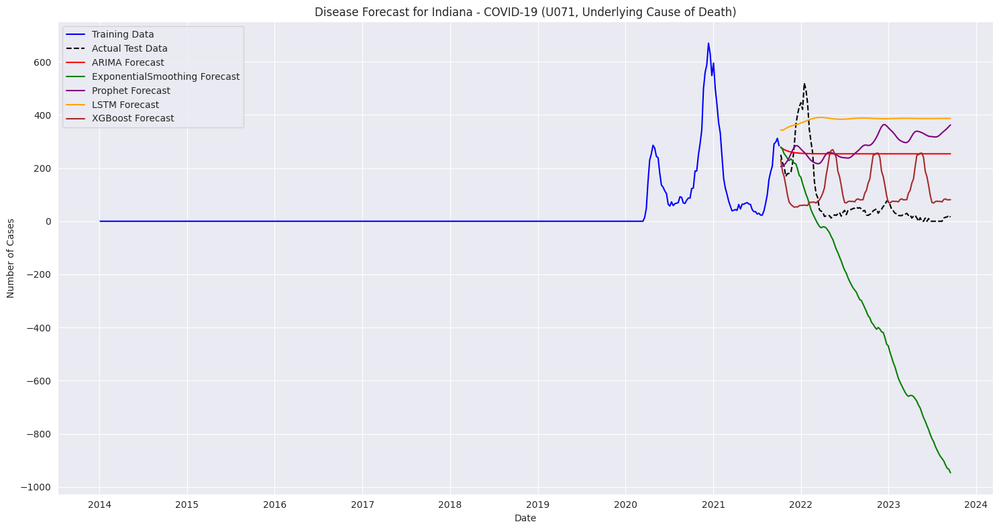


Accuracy Metrics for Indiana - COVID-19 (U071, Underlying Cause of Death):
                             MAE        RMSE         R2  MAPE
ARIMA                 200.843226  209.631709  -1.777130   inf
ExponentialSmoothing  421.854550  507.275959 -15.261885   inf
Prophet               232.123851  248.892289  -2.914760   inf
LSTM                  307.079636  324.562969  -5.657026   inf
XGBoost               128.359748  165.382071  -0.728459   inf


Forecasting for state: Iowa
  Working on disease: Septicemia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/z8sldqt_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/82kz0cbq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81884', 'data', 'file=/tmp/tmpyhfpm2dm/z8sldqt_.json', 'init=/tmp/tmpyhfpm2dm/82kz0cbq.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelec9d1r5b/prophet_model-20250426112200.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:22:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:22:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


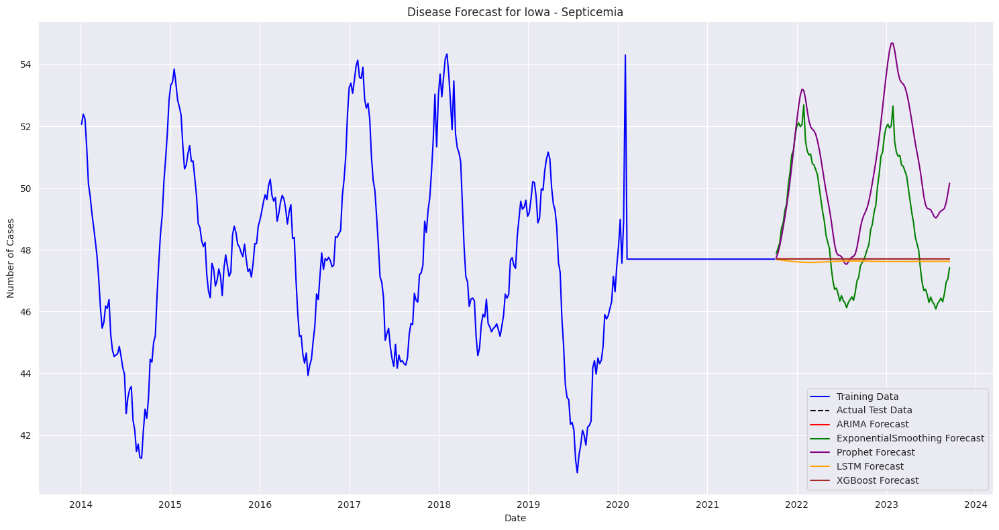


Accuracy Metrics for Iowa - Septicemia:
                               MAE          RMSE            R2          MAPE
ARIMA                 2.130048e-09  2.166378e-09 -9.295830e+10  4.465905e-09
ExponentialSmoothing  1.923812e+00  2.345819e+00 -1.089955e+29  4.033505e+00
Prophet               2.817395e+00  3.460999e+00 -2.372589e+29  5.907010e+00
LSTM                  7.370220e-02  7.560177e-02 -1.132097e+26  1.545256e-01
XGBoost               7.097658e-05  7.097658e-05 -9.978144e+19  1.488110e-04


  Working on disease: Influenza and pneumonia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/pao1ope3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/08i_ljq3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66507', 'data', 'file=/tmp/tmpyhfpm2dm/pao1ope3.json', 'init=/tmp/tmpyhfpm2dm/08i_ljq3.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelxnplqps6/prophet_model-20250426112233.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:22:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:22:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


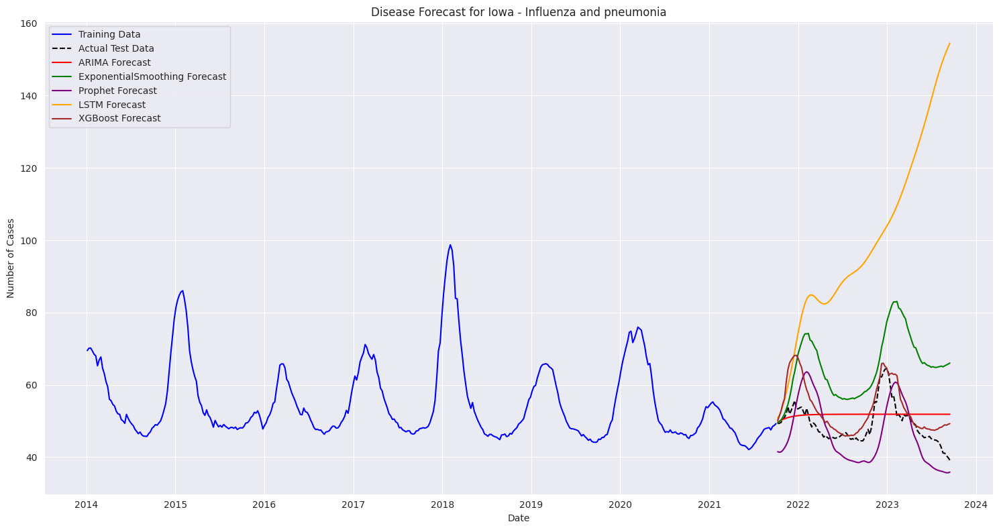


Accuracy Metrics for Iowa - Influenza and pneumonia:
                            MAE       RMSE          R2        MAPE
ARIMA                  5.013741   6.005892   -0.238871   10.480911
ExponentialSmoothing  16.030607  17.742889   -9.812342   33.249928
Prophet                6.832082   7.679485   -1.025514   13.739026
LSTM                  50.715381  57.884859 -114.080322  107.323977
XGBoost                4.355158   5.706965   -0.118617    8.870616


  Working on disease: COVID-19 (U071, Multiple Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/dq24bppo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/d56877sh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27818', 'data', 'file=/tmp/tmpyhfpm2dm/dq24bppo.json', 'init=/tmp/tmpyhfpm2dm/d56877sh.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelsbu2m5pj/prophet_model-20250426112306.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:23:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:23:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


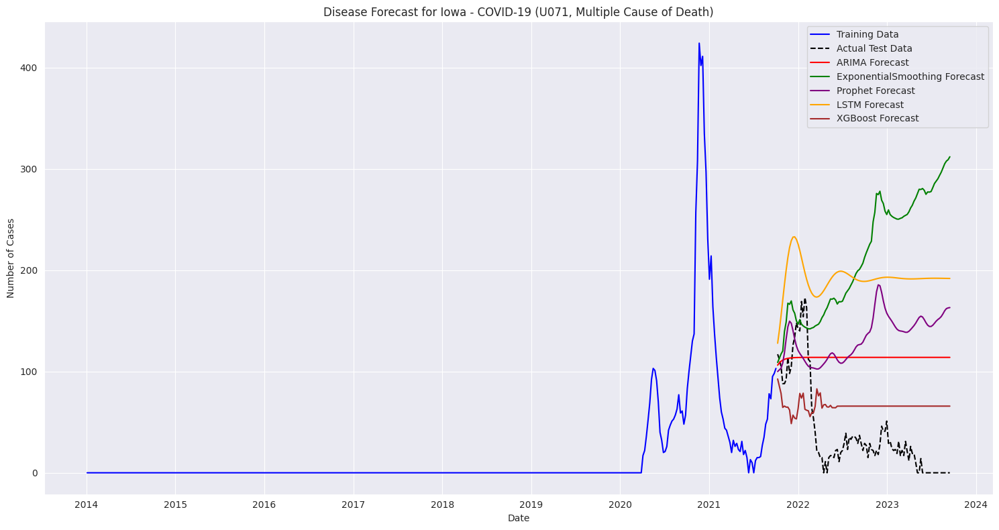


Accuracy Metrics for Iowa - COVID-19 (U071, Multiple Cause of Death):
                             MAE        RMSE         R2  MAPE
ARIMA                  80.412527   86.761117  -2.664324   inf
ExponentialSmoothing  175.665110  197.584693 -18.004224   inf
Prophet               100.021961  109.586575  -4.845993   inf
LSTM                  152.035173  158.294906 -11.197686   inf
XGBoost                49.125227   52.645772  -0.349182   inf


  Working on disease: COVID-19 (U071, Underlying Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/jc879hyf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/o70y74_k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71721', 'data', 'file=/tmp/tmpyhfpm2dm/jc879hyf.json', 'init=/tmp/tmpyhfpm2dm/o70y74_k.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelr1_v_hh3/prophet_model-20250426112339.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:23:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:23:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


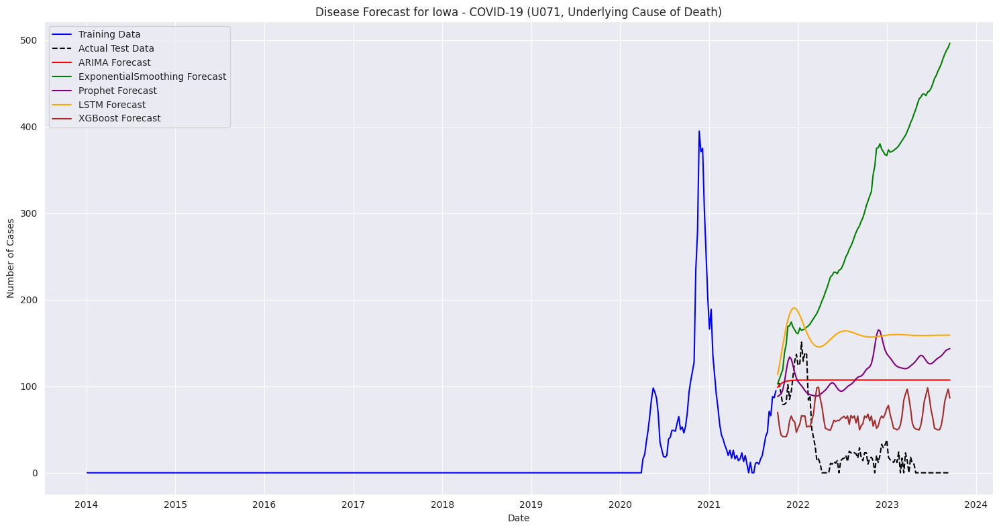


Accuracy Metrics for Iowa - COVID-19 (U071, Underlying Cause of Death):
                             MAE        RMSE         R2  MAPE
ARIMA                  80.348931   86.507389  -3.454663   inf
ExponentialSmoothing  272.247591  307.983757 -55.463021   inf
Prophet                91.518499   99.857905  -4.935720   inf
LSTM                  128.421111  134.032948  -9.693789   inf
XGBoost                53.553337   56.769846  -0.918421   inf


Forecasting for state: Kentucky
  Working on disease: Septicemia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/ekggzify.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/ebeejyhb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46283', 'data', 'file=/tmp/tmpyhfpm2dm/ekggzify.json', 'init=/tmp/tmpyhfpm2dm/ebeejyhb.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelpa4yoszr/prophet_model-20250426112410.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:24:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:24:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


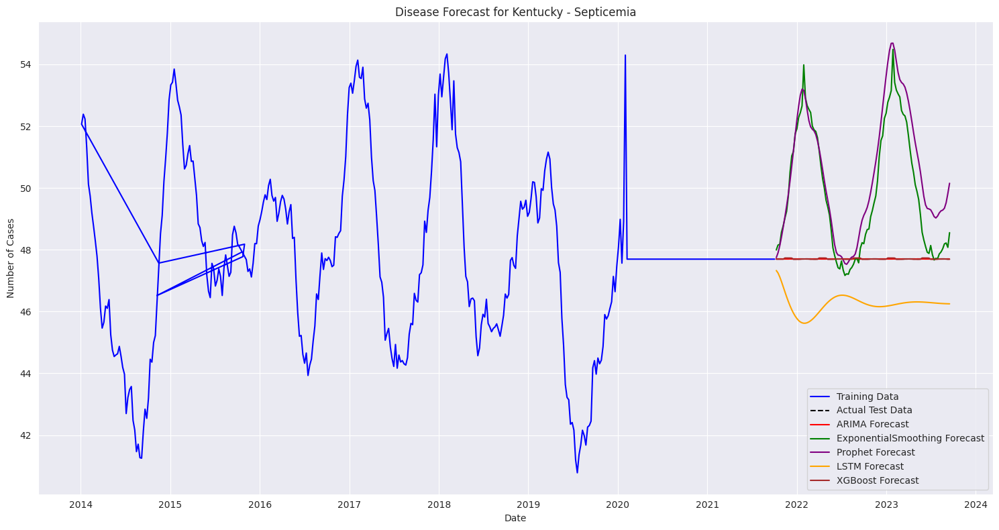


Accuracy Metrics for Kentucky - Septicemia:
                           MAE      RMSE            R2      MAPE
ARIMA                 0.000000  0.000000  1.000000e+00       NaN
ExponentialSmoothing  2.240183  2.971730 -1.749196e+29       NaN
Prophet               2.817395  3.460999 -2.372589e+29  5.907010
LSTM                  1.444142  1.474790 -4.308044e+28  3.027818
XGBoost               0.011649  0.018161 -6.532457e+24  0.024424


  Working on disease: Influenza and pneumonia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/8x0f90i7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/1uwak4n0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56367', 'data', 'file=/tmp/tmpyhfpm2dm/8x0f90i7.json', 'init=/tmp/tmpyhfpm2dm/1uwak4n0.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelrddz54ik/prophet_model-20250426112443.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:24:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:24:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


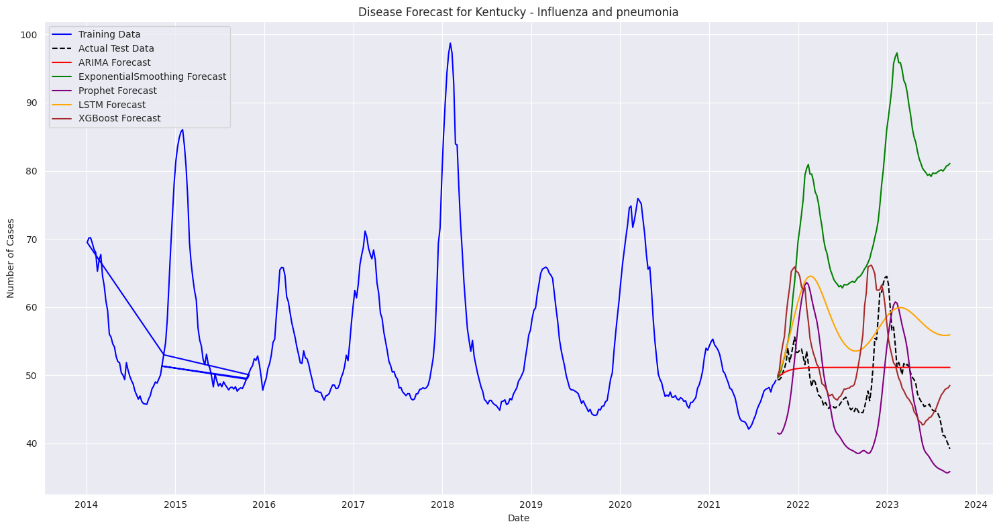


Accuracy Metrics for Kentucky - Influenza and pneumonia:
                            MAE       RMSE         R2       MAPE
ARIMA                  4.723308   5.731334  -0.128191        NaN
ExponentialSmoothing  24.744841  27.357381 -24.705150        NaN
Prophet                6.832082   7.679485  -1.025514  13.739026
LSTM                   9.063792  10.035458  -2.458959  19.217038
XGBoost                5.226274   6.756255  -0.567773  10.646583


  Working on disease: COVID-19 (U071, Multiple Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/u2yhqcp8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/_asqn8st.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68300', 'data', 'file=/tmp/tmpyhfpm2dm/u2yhqcp8.json', 'init=/tmp/tmpyhfpm2dm/_asqn8st.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_model6m53qdba/prophet_model-20250426112514.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:25:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:25:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


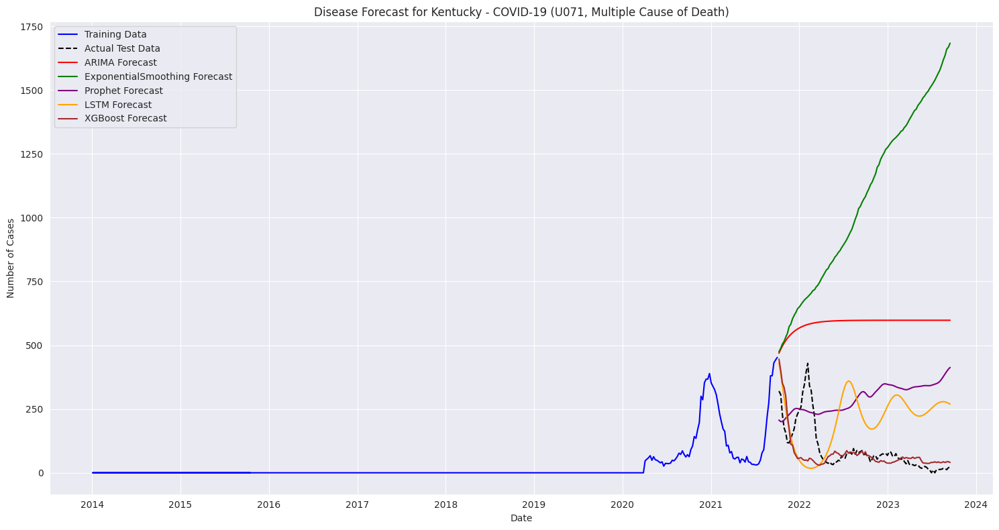


Accuracy Metrics for Kentucky - COVID-19 (U071, Multiple Cause of Death):
                             MAE         RMSE          R2  MAPE
ARIMA                 493.609624   505.874106  -27.852888   NaN
ExponentialSmoothing  981.641273  1066.520668 -127.245739   NaN
Prophet               219.890638   240.679527   -5.531045   inf
LSTM                  185.062989   202.359946   -3.616932   inf
XGBoost                56.355987    96.697467   -0.054228   inf


  Working on disease: COVID-19 (U071, Underlying Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/o9xmfi8s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/qtz1w83e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10560', 'data', 'file=/tmp/tmpyhfpm2dm/o9xmfi8s.json', 'init=/tmp/tmpyhfpm2dm/qtz1w83e.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_model_sub_sfb/prophet_model-20250426112546.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:25:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:25:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


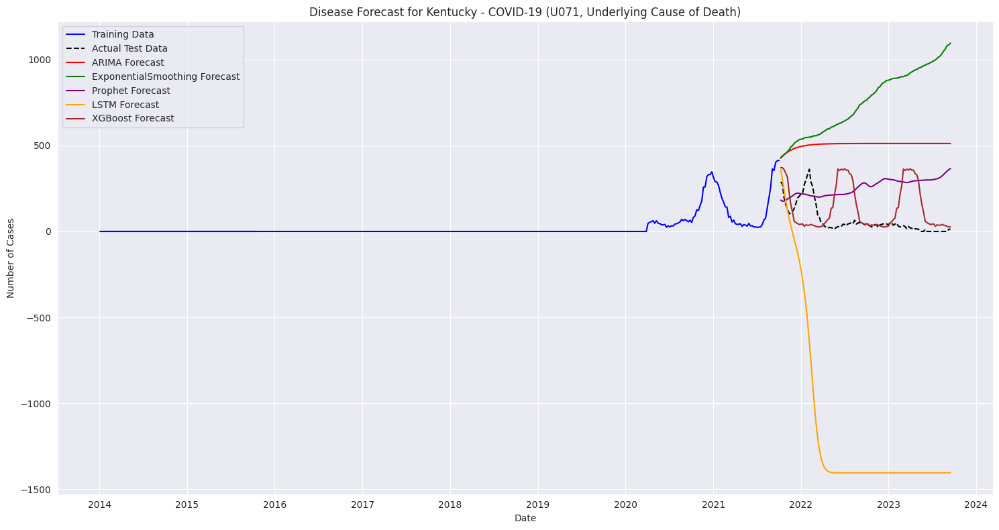


Accuracy Metrics for Kentucky - COVID-19 (U071, Underlying Cause of Death):
                              MAE         RMSE          R2  MAPE
ARIMA                  437.327312   447.705054  -26.597725   NaN
ExponentialSmoothing   688.492202   733.907373  -73.160352   NaN
Prophet                205.211623   224.541937   -5.941994   inf
LSTM                  1220.037535  1297.756953 -230.886792   inf
XGBoost                129.676109   176.503024   -3.289371   inf


Forecasting for state: Kansas
  Working on disease: Septicemia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/u2yq7oxy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/d5o6ezzo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34796', 'data', 'file=/tmp/tmpyhfpm2dm/u2yq7oxy.json', 'init=/tmp/tmpyhfpm2dm/d5o6ezzo.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_model2844bx4f/prophet_model-20250426112619.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:26:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:26:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


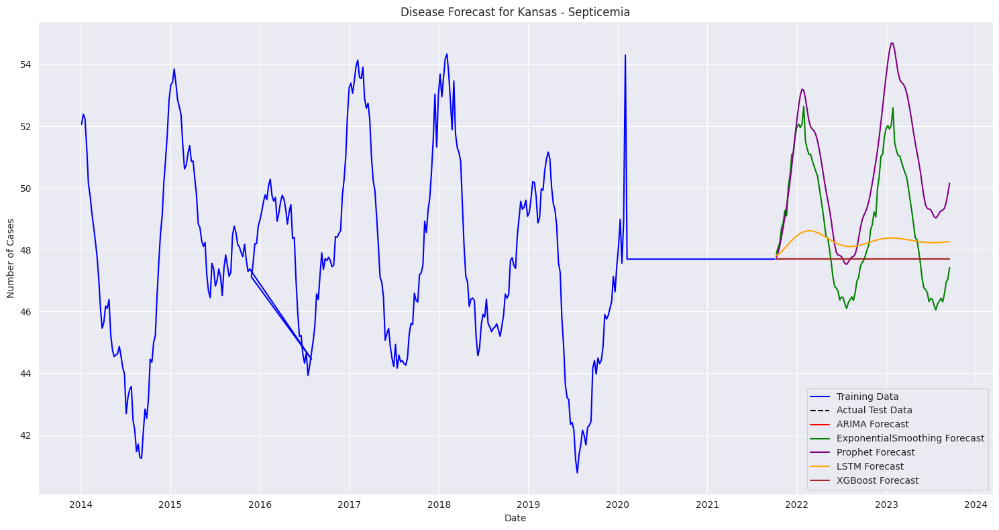


Accuracy Metrics for Kansas - Septicemia:
                           MAE      RMSE            R2      MAPE
ARIMA                 0.000000  0.000000  1.000000e+00       NaN
ExponentialSmoothing  1.902990  2.328555 -1.073971e+29       NaN
Prophet               2.817395  3.460999 -2.372589e+29  5.907010
LSTM                  0.592348  0.614028 -7.467856e+27  1.241930
XGBoost               0.000121  0.000121 -2.879262e+20  0.000253


  Working on disease: Influenza and pneumonia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/u8xn9yur.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/mk8m_4op.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59175', 'data', 'file=/tmp/tmpyhfpm2dm/u8xn9yur.json', 'init=/tmp/tmpyhfpm2dm/mk8m_4op.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelkt_q7jro/prophet_model-20250426112651.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:26:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:26:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


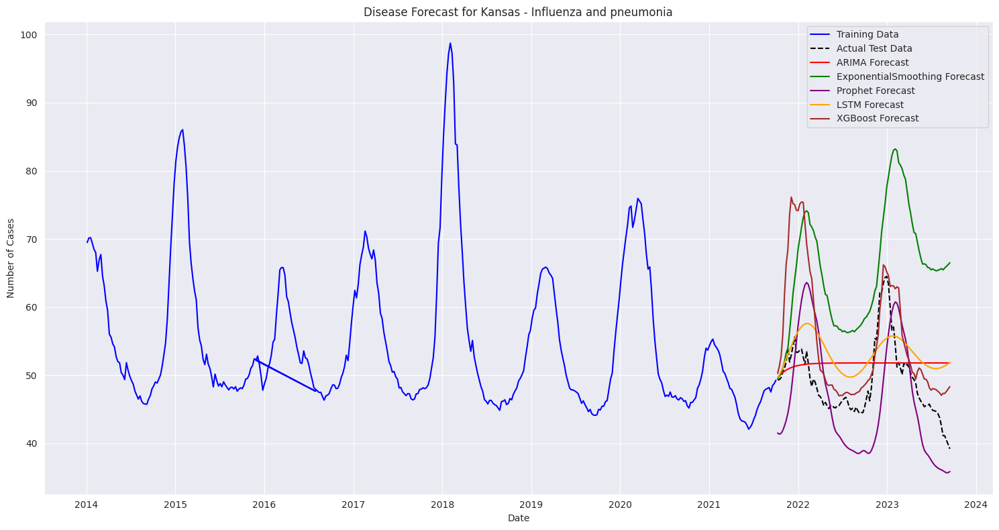


Accuracy Metrics for Kansas - Influenza and pneumonia:
                            MAE       RMSE         R2       MAPE
ARIMA                  4.984083   5.977922  -0.227359        NaN
ExponentialSmoothing  16.273322  17.986770 -10.111623        NaN
Prophet                6.832082   7.679485  -1.025514  13.739026
LSTM                   5.194602   5.873460  -0.184838  10.918058
XGBoost                6.036585   8.675091  -1.584754  12.091234


  Working on disease: COVID-19 (U071, Multiple Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/b17i6g7v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/enzh9tk1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80851', 'data', 'file=/tmp/tmpyhfpm2dm/b17i6g7v.json', 'init=/tmp/tmpyhfpm2dm/enzh9tk1.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelwsurki9y/prophet_model-20250426112723.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:27:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:27:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


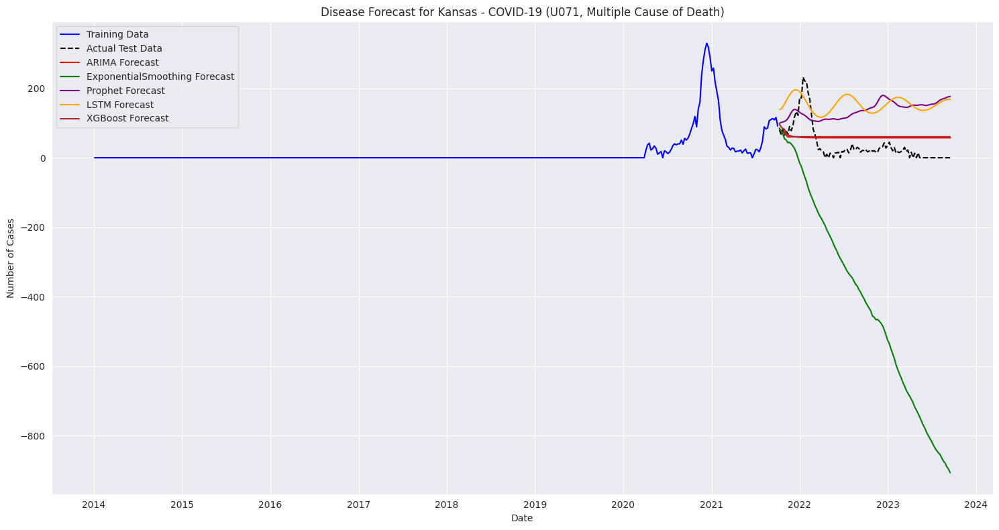


Accuracy Metrics for Kansas - COVID-19 (U071, Multiple Cause of Death):
                             MAE        RMSE         R2  MAPE
ARIMA                  46.710144   55.466234  -0.113674   NaN
ExponentialSmoothing  453.974117  523.740857 -98.296394   NaN
Prophet               109.504202  117.908640  -4.032593   inf
LSTM                  120.074075  126.030580  -4.749796   inf
XGBoost                49.225602   56.955804  -0.174293   inf


  Working on disease: COVID-19 (U071, Underlying Cause of Death)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/yqt5peai.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/uines1ny.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64430', 'data', 'file=/tmp/tmpyhfpm2dm/yqt5peai.json', 'init=/tmp/tmpyhfpm2dm/uines1ny.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelgo2_wk3x/prophet_model-20250426112754.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:27:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:27:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


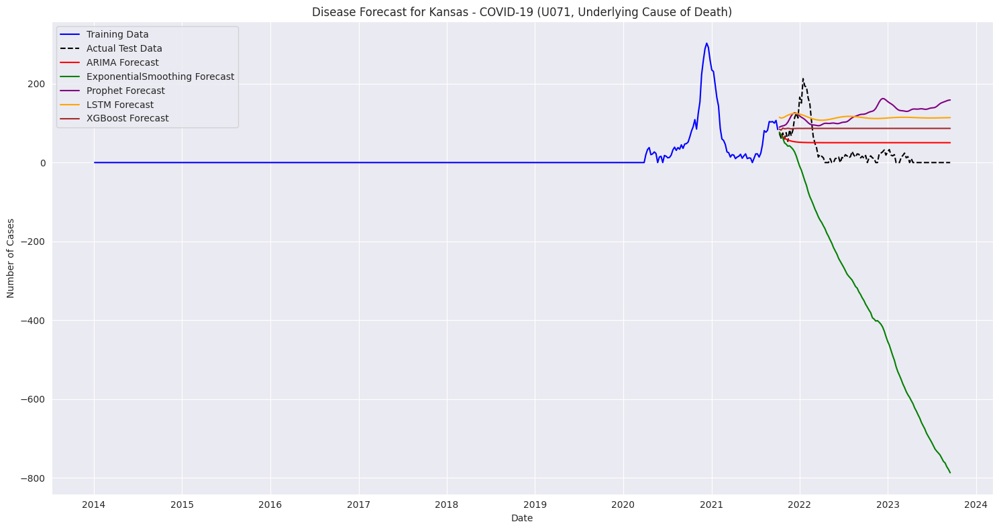


Accuracy Metrics for Kansas - COVID-19 (U071, Underlying Cause of Death):
                             MAE        RMSE         R2  MAPE
ARIMA                  44.218303   51.570890  -0.137013   NaN
ExponentialSmoothing  390.952022  451.801954 -86.267463   NaN
Prophet               101.427806  109.179457  -4.096101   inf
LSTM                   90.740847   95.030425  -2.860837   inf
XGBoost                69.486921   73.376872  -1.301837   inf


Forecasting for state: Louisiana
  Working on disease: Septicemia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/etidivpd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/pmfp_h_y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2560', 'data', 'file=/tmp/tmpyhfpm2dm/etidivpd.json', 'init=/tmp/tmpyhfpm2dm/pmfp_h_y.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelu9v0ao88/prophet_model-20250426112826.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:28:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:28:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


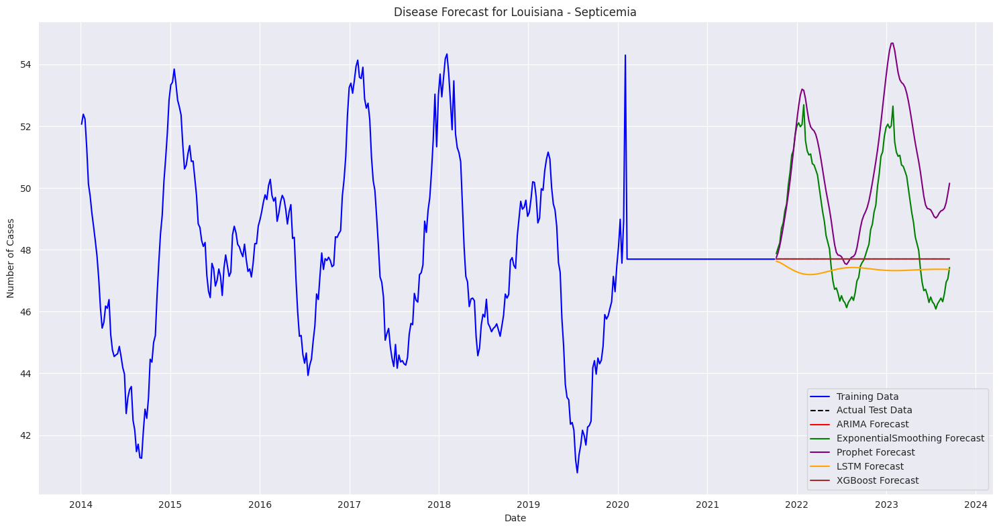


Accuracy Metrics for Louisiana - Septicemia:
                               MAE          RMSE            R2          MAPE
ARIMA                 2.130048e-09  2.166378e-09 -9.295830e+10  4.465905e-09
ExponentialSmoothing  1.923812e+00  2.345819e+00 -1.089955e+29  4.033505e+00
Prophet               2.817395e+00  3.460999e+00 -2.372589e+29  5.907010e+00
LSTM                  3.428580e-01  3.524741e-01 -2.460787e+27  7.188434e-01
XGBoost               7.097658e-05  7.097658e-05 -9.978144e+19  1.488110e-04


  Working on disease: Influenza and pneumonia


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/s09d3cwo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyhfpm2dm/7kgg27tz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75635', 'data', 'file=/tmp/tmpyhfpm2dm/s09d3cwo.json', 'init=/tmp/tmpyhfpm2dm/7kgg27tz.json', 'output', 'file=/tmp/tmpyhfpm2dm/prophet_modelz6gih_of/prophet_model-20250426112857.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:28:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:28:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# Assuming infectious_disease_dfs is a dictionary with state names as keys and dataframes as values
# We'll create a function to build and evaluate multiple models for each state-disease combination

def create_train_test_split(series, test_size=0.2):
    """Split time series data into train and test sets"""
    train_size = int(len(series) * (1 - test_size))
    train, test = series[:train_size], series[train_size:]
    return train, test

def calculate_metrics(actual, predicted):
    """Calculate performance metrics"""
    mae = mean_absolute_error(actual, predicted)
    rmse = np.sqrt(mean_squared_error(actual, predicted))
    r2 = r2_score(actual, predicted)
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100 if np.any(actual != 0) else np.nan
    return {'MAE': mae, 'RMSE': rmse, 'R2': r2, 'MAPE': mape}

def fit_arima_model(train, test, order=(1, 1, 1)):
    """Fit ARIMA model and make predictions"""
    model = ARIMA(train, order=order)
    model_fit = model.fit()
    forecast = model_fit.forecast(steps=len(test))
    return forecast, calculate_metrics(test, forecast)

def fit_exponential_smoothing(train, test):
    """Fit Exponential Smoothing model and make predictions"""
    model = ExponentialSmoothing(train, trend='add', seasonal='add', seasonal_periods=52)
    model_fit = model.fit()
    forecast = model_fit.forecast(len(test))
    return forecast, calculate_metrics(test, forecast)

def fit_prophet_model(df_train, df_test):
    """Fit Prophet model and make predictions"""
    # Prophet requires specific column names
    prophet_df_train = pd.DataFrame({
        'ds': df_train.index,
        'y': df_train.values
    })

    model = Prophet(yearly_seasonality=True, weekly_seasonality=True)
    model.fit(prophet_df_train)

    future = pd.DataFrame({'ds': df_test.index})
    forecast = model.predict(future)
    return forecast['yhat'].values, calculate_metrics(df_test.values, forecast['yhat'].values)

def fit_lstm_model(train, test, look_back=12):
    """Fit LSTM model and make predictions"""
    # Scale the data
    scaler = MinMaxScaler(feature_range=(0, 1))
    train_scaled = scaler.fit_transform(train.values.reshape(-1, 1))

    # Create dataset for LSTM
    def create_dataset(dataset, look_back=1):
        X, y = [], []
        for i in range(len(dataset) - look_back):
            X.append(dataset[i:(i + look_back), 0])
            y.append(dataset[i + look_back, 0])
        return np.array(X), np.array(y)

    X_train, y_train = create_dataset(train_scaled, look_back)
    X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)

    # Build and train the LSTM model
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(look_back, 1)))
    model.add(Dropout(0.2))
    model.add(LSTM(50))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)

    # Make predictions
    inputs = scaler.transform(train[-look_back:].values.reshape(-1, 1))
    X_test = []
    X_test.append(inputs.reshape(1, -1)[0])
    X_test = np.array(X_test)
    X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

    predictions = []
    for i in range(len(test)):
        pred = model.predict(X_test, verbose=0)
        predictions.append(pred[0, 0])

        # Update X_test for the next prediction
        X_test = np.append(X_test[:, 1:, :], np.array([[[pred[0, 0]]]]), axis=1)

    # Inverse transform predictions
    predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

    return predictions, calculate_metrics(test.values, predictions)

def fit_xgboost_model(train, test, look_back=12):
    """Fit XGBoost model for time series forecasting"""
    # Create features from the time series
    def create_features(data, look_back):
        X, y = [], []
        for i in range(len(data) - look_back):
            X.append(data[i:i+look_back])
            y.append(data[i+look_back])
        return np.array(X), np.array(y)

    X_train, y_train = create_features(train.values, look_back)

    # Train XGBoost model
    model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100)
    model.fit(X_train, y_train)

    # Make predictions
    X_test = []
    last_window = train[-look_back:].values

    predictions = []
    for i in range(len(test)):
        # Make prediction
        pred = model.predict(np.array([last_window]))
        predictions.append(pred[0])

        # Update window for next prediction
        last_window = np.append(last_window[1:], pred[0])

    return np.array(predictions), calculate_metrics(test.values, predictions)

def forecast_diseases_by_state(infectious_disease_dfs, disease_columns, test_size=0.2):
    """Create forecasts for each state and disease combination"""
    results = {}

    for state, df in infectious_disease_dfs.items():
        print(f"Forecasting for state: {state}")
        state_results = {}

        # Ensure we have a proper datetime index
        if "Week Ending Date" in df.columns:
            df["Week Ending Date"] = pd.to_datetime(df["Week Ending Date"], errors='coerce')
            df = df.set_index("Week Ending Date")

        for column in disease_columns:
            if column in df.columns:
                print(f"  Working on disease: {column}")

                # Get the time series and fill missing values
                series = df[column].fillna(method='ffill').fillna(method='bfill')

                # Skip if not enough data
                if len(series) < 20:
                    print(f"    Insufficient data for {state} - {column}")
                    continue

                # Split into train and test
                train, test = create_train_test_split(series, test_size=test_size)

                # Apply 5-6 forecasting models
                models_forecasts = {}

                # 1. ARIMA
                try:
                    forecast, metrics = fit_arima_model(train, test)
                    models_forecasts['ARIMA'] = {
                        'forecast': forecast,
                        'metrics': metrics
                    }
                except Exception as e:
                    print(f"    ARIMA error: {e}")

                # 2. Exponential Smoothing
                try:
                    forecast, metrics = fit_exponential_smoothing(train, test)
                    models_forecasts['ExponentialSmoothing'] = {
                        'forecast': forecast,
                        'metrics': metrics
                    }
                except Exception as e:
                    print(f"    ExponentialSmoothing error: {e}")

                # 3. Prophet
                try:
                    forecast, metrics = fit_prophet_model(train, test)
                    models_forecasts['Prophet'] = {
                        'forecast': forecast,
                        'metrics': metrics
                    }
                except Exception as e:
                    print(f"    Prophet error: {e}")

                # 4. LSTM
                try:
                    forecast, metrics = fit_lstm_model(train, test)
                    models_forecasts['LSTM'] = {
                        'forecast': forecast,
                        'metrics': metrics
                    }
                except Exception as e:
                    print(f"    LSTM error: {e}")

                # 5. XGBoost
                try:
                    forecast, metrics = fit_xgboost_model(train, test)
                    models_forecasts['XGBoost'] = {
                        'forecast': forecast,
                        'metrics': metrics
                    }
                except Exception as e:
                    print(f"    XGBoost error: {e}")

                state_results[column] = {
                    'train': train,
                    'test': test,
                    'models': models_forecasts
                }

                # Plot forecasts
                plot_forecasts(state, column, train, test, models_forecasts)

                # Display metrics
                display_metrics(state, column, models_forecasts)

        results[state] = state_results

    return results

def plot_forecasts(state, disease, train, test, models_forecasts):
    """Plot actual values and forecasts"""
    plt.figure(figsize=(15, 8))
    plt.plot(train.index, train.values, label='Training Data', color='blue')
    plt.plot(test.index, test.values, label='Actual Test Data', color='black', linestyle='--')

    colors = ['red', 'green', 'purple', 'orange', 'brown']
    i = 0

    for model_name, model_data in models_forecasts.items():
        plt.plot(test.index, model_data['forecast'], label=f'{model_name} Forecast', color=colors[i % len(colors)])
        i += 1

    plt.title(f'Disease Forecast for {state} - {disease}')
    plt.xlabel('Date')
    plt.ylabel('Number of Cases')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def display_metrics(state, disease, models_forecasts):
    """Display metrics for all models in tabular format"""
    print(f"\nAccuracy Metrics for {state} - {disease}:")

    metrics_df = pd.DataFrame()

    for model_name, model_data in models_forecasts.items():
        metrics = model_data['metrics']
        metrics_df[model_name] = pd.Series(metrics)

    print(metrics_df.T)
    print("\n" + "="*80 + "\n")

# Run the forecasting for all states and diseases
forecast_results = forecast_diseases_by_state(infectious_disease_dfs, disease_columns)

# Find the best model for each state-disease combination
def find_best_models(forecast_results):
    best_models = {}

    for state, state_results in forecast_results.items():
        best_models[state] = {}

        for disease, disease_results in state_results.items():
            best_model = None
            best_rmse = float('inf')

            for model_name, model_data in disease_results['models'].items():
                rmse = model_data['metrics']['RMSE']
                if rmse < best_rmse:
                    best_rmse = rmse
                    best_model = model_name

            best_models[state][disease] = best_model

    return best_models

# Display the best model for each state-disease combination
best_models = find_best_models(forecast_results)
for state, diseases in best_models.items():
    print(f"Best models for {state}:")
    for disease, model in diseases.items():
        print(f"  {disease}: {model}")

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from tensorflow.keras.models import Sequential, load_model, save_model
from tensorflow.keras.layers import LSTM, Dense, Dropout
import warnings
warnings.filterwarnings('ignore')

# Disease columns of interest
disease_columns = [
    "Septicemia",
    "Influenza and pneumonia",
    "COVID-19 (U071, Multiple Cause of Death)",
    "COVID-19 (U071, Underlying Cause of Death)"
]

def create_train_test_split(series, test_size=0.2):
    """Split time series data into train and test sets"""
    if len(series) < 10:  # Skip very short series
        return None, None

    train_size = int(len(series) * (1 - test_size))
    train, test = series[:train_size], series[train_size:]
    return train, test

def calculate_metrics(actual, predicted):
    """Calculate performance metrics"""
    mae = mean_absolute_error(actual, predicted)
    rmse = np.sqrt(mean_squared_error(actual, predicted))
    r2 = r2_score(actual, predicted)

    # Prevent division by zero in MAPE calculation
    mape = np.mean(np.abs((actual - predicted) / np.where(actual == 0, 1, actual))) * 100
    return {'MAE': mae, 'RMSE': rmse, 'R2': r2, 'MAPE': mape}

class LSTMDiseaseForecaster:
    def __init__(self, look_back=4, epochs=50, batch_size=16):
        """Initialize the LSTM forecaster with parameters

        Args:
            look_back (int): Number of time steps to look back for prediction
            epochs (int): Number of training epochs
            batch_size (int): Batch size for training
        """
        self.look_back = look_back
        self.epochs = epochs
        self.batch_size = batch_size
        self.model = None
        self.scaler = MinMaxScaler(feature_range=(0, 1))

    def create_dataset(self, dataset, look_back=1):
        """Create dataset in format suitable for LSTM"""
        X, y = [], []
        for i in range(len(dataset) - look_back):
            X.append(dataset[i:(i + look_back), 0])
            y.append(dataset[i + look_back, 0])
        return np.array(X), np.array(y)

    def build_model(self, input_shape):
        """Build LSTM model architecture"""
        model = Sequential()
        model.add(LSTM(50, return_sequences=True, input_shape=input_shape))
        model.add(Dropout(0.2))
        model.add(LSTM(30))
        model.add(Dropout(0.2))
        model.add(Dense(1))
        model.compile(optimizer='adam', loss='mean_squared_error')
        return model

    def fit(self, train_data):
        """Fit the LSTM model with training data

        Args:
            train_data (pd.Series): Time series data for training
        """
        # Scale the data
        train_scaled = self.scaler.fit_transform(train_data.values.reshape(-1, 1))

        # Create dataset for LSTM
        X_train, y_train = self.create_dataset(train_scaled, self.look_back)
        X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)

        # Build and train the model
        self.model = self.build_model((X_train.shape[1], 1))
        self.model.fit(X_train, y_train, epochs=self.epochs, batch_size=self.batch_size, verbose=1)

        return self

    def predict(self, history, forecast_steps):
        """Generate predictions for future time steps

        Args:
            history (pd.Series): Historical time series data
            forecast_steps (int): Number of future steps to predict

        Returns:
            np.array: Predicted values
        """
        # Scale the last look_back points from history
        last_sequence = history[-self.look_back:].values.reshape(-1, 1)
        last_sequence_scaled = self.scaler.transform(last_sequence)

        # Initialize the input sequence
        curr_seq = last_sequence_scaled.reshape(1, self.look_back, 1)

        # Generate predictions
        predictions = []
        for i in range(forecast_steps):
            # Predict the next value
            next_val = self.model.predict(curr_seq, verbose=0)[0, 0]
            predictions.append(next_val)

            # Update the sequence
            curr_seq = np.append(curr_seq[:, 1:, :], np.array([[[next_val]]]), axis=1)

        # Inverse transform to get actual values
        predictions = np.array(predictions).reshape(-1, 1)
        predictions = self.scaler.inverse_transform(predictions).flatten()

        # Ensure predictions are non-negative
        predictions = np.maximum(predictions, 0)

        return predictions

    def evaluate(self, test_data):
        """Evaluate model performance on test data

        Args:
            test_data (pd.Series): Test time series data

        Returns:
            dict: Performance metrics
            np.array: Predicted values
        """
        # Get the training data that precedes the test data
        if len(test_data) == 0:
            return None, None

        # Make predictions one step at a time
        predictions = self.predict(test_data.iloc[:-len(test_data)], len(test_data))

        # Calculate metrics
        metrics = calculate_metrics(test_data.values, predictions)

        return metrics, predictions

    def save(self, filepath):
        """Save the model to file

        Args:
            filepath (str): Path to save the model
        """
        self.model.save(filepath)

        # Save scaler and parameters as well
        scaler_data = {
            'min_': self.scaler.min_,
            'scale_': self.scaler.scale_,
            'data_min_': self.scaler.data_min_,
            'data_max_': self.scaler.data_max_,
            'data_range_': self.scaler.data_range_,
            'look_back': self.look_back,
            'epochs': self.epochs,
            'batch_size': self.batch_size
        }

        np.save(f"{filepath}_scaler.npy", scaler_data)

    @classmethod
    def load(cls, filepath):
        """Load a saved model

        Args:
            filepath (str): Path to the saved model

        Returns:
            LSTMDiseaseForecaster: Loaded model instance
        """
        # Load model
        keras_model = load_model(filepath)

        # Load scaler and parameters
        scaler_data = np.load(f"{filepath}_scaler.npy", allow_pickle=True).item()

        # Create new instance
        instance = cls(
            look_back=scaler_data['look_back'],
            epochs=scaler_data['epochs'],
            batch_size=scaler_data['batch_size']
        )

        # Set model and scaler
        instance.model = keras_model
        instance.scaler = MinMaxScaler(feature_range=(0, 1))
        instance.scaler.min_ = scaler_data['min_']
        instance.scaler.scale_ = scaler_data['scale_']
        instance.scaler.data_min_ = scaler_data['data_min_']
        instance.scaler.data_max_ = scaler_data['data_max_']
        instance.scaler.data_range_ = scaler_data['data_range_']

        return instance

def train_and_save_models(infectious_disease_dfs, output_dir="./models"):
    """Train LSTM models for each state and disease

    Args:
        infectious_disease_dfs (dict): Dictionary of state DataFrames
        output_dir (str): Directory to save models
    """
    import os

    # Create directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    # Store model paths and metrics
    model_info = {}

    for state, df in infectious_disease_dfs.items():
        print(f"\nProcessing state: {state}")
        state_dir = os.path.join(output_dir, state.replace(" ", "_"))
        os.makedirs(state_dir, exist_ok=True)

        model_info[state] = {}

        # Ensure we have a proper datetime index
        if "Week Ending Date" in df.columns:
            df_state = df.copy()
            df_state["Week Ending Date"] = pd.to_datetime(df_state["Week Ending Date"], errors='coerce')
            df_state = df_state.set_index("Week Ending Date")

            for column in disease_columns:
                if column in df_state.columns:
                    print(f"  Training LSTM for: {column}")

                    # Get the time series and fill missing values
                    series = df_state[column].fillna(method='ffill').fillna(method='bfill')

                    # Skip if not enough data
                    if len(series) < 10:
                        print(f"    Insufficient data for {state} - {column}")
                        continue

                    # Split into train and test
                    train, test = create_train_test_split(series, test_size=0.2)
                    if train is None:
                        continue

                    # Create and train LSTM model
                    try:
                        forecaster = LSTMDiseaseForecaster(look_back=4, epochs=50, batch_size=16)
                        forecaster.fit(train)

                        # Evaluate model
                        metrics, predictions = forecaster.evaluate(test)

                        # Save model
                        model_path = os.path.join(state_dir, f"{column.replace(' ', '_')}_lstm_model")
                        forecaster.save(model_path)

                        # Store model info
                        model_info[state][column] = {
                            'model_path': model_path,
                            'metrics': metrics
                        }

                        # Plot results
                        plt.figure(figsize=(12, 6))
                        plt.plot(train.index, train.values, label='Training Data', color='blue')
                        plt.plot(test.index, test.values, label='Actual Test Data', color='black')
                        plt.plot(test.index, predictions, label='LSTM Predictions', color='red')
                        plt.title(f'LSTM Forecast for {state} - {column}', fontsize=14)
                        plt.xlabel('Date')
                        plt.ylabel('Number of Cases')
                        plt.legend()
                        plt.grid(True, alpha=0.3)
                        plt.tight_layout()
                        plt.savefig(os.path.join(state_dir, f"{column.replace(' ', '_')}_forecast.png"))
                        plt.close()

                        # Print metrics
                        print(f"    Metrics: MAE={metrics['MAE']:.2f}, RMSE={metrics['RMSE']:.2f}, R2={metrics['R2']:.2f}")

                    except Exception as e:
                        print(f"    Error training LSTM for {state} - {column}: {e}")

    # Save model information
    model_info_df = pd.DataFrame({
        'State': [],
        'Disease': [],
        'Model Path': [],
        'MAE': [],
        'RMSE': [],
        'R2': [],
        'MAPE': []
    })

    for state, diseases in model_info.items():
        for disease, info in diseases.items():
            metrics = info['metrics']
            model_info_df = pd.concat([model_info_df, pd.DataFrame({
                'State': [state],
                'Disease': [disease],
                'Model Path': [info['model_path']],
                'MAE': [metrics['MAE']],
                'RMSE': [metrics['RMSE']],
                'R2': [metrics['R2']],
                'MAPE': [metrics['MAPE']]
            })], ignore_index=True)

    model_info_df.to_csv(os.path.join(output_dir, 'model_metrics.csv'), index=False)
    print(f"\nAll models saved to {output_dir}")
    print(f"Model metrics saved to {os.path.join(output_dir, 'model_metrics.csv')}")

    return model_info

def make_future_predictions(model_info, infectious_disease_dfs, prediction_weeks=52, output_dir="./predictions"):
    """Make future predictions using trained models

    Args:
        model_info (dict): Dictionary with model paths and metrics
        infectious_disease_dfs (dict): Dictionary of state DataFrames
        prediction_weeks (int): Number of weeks to predict into the future
        output_dir (str): Directory to save predictions
    """
    import os

    # Create directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    # Store predictions
    all_predictions = {}

    for state, diseases in model_info.items():
        print(f"\nMaking predictions for state: {state}")
        state_dir = os.path.join(output_dir, state.replace(" ", "_"))
        os.makedirs(state_dir, exist_ok=True)

        all_predictions[state] = {}

        df = infectious_disease_dfs[state]

        # Ensure we have a proper datetime index
        if "Week Ending Date" in df.columns:
            df_state = df.copy()
            df_state["Week Ending Date"] = pd.to_datetime(df_state["Week Ending Date"], errors='coerce')
            df_state = df_state.set_index("Week Ending Date")

            # Create future dates
            last_date = df_state.index.max()
            future_dates = pd.date_range(start=last_date + pd.Timedelta(days=7), periods=prediction_weeks, freq='W')

            for disease, info in diseases.items():
                print(f"  Predicting {disease}")

                try:
                    # Load the model
                    model_path = info['model_path']
                    forecaster = LSTMDiseaseForecaster.load(model_path)

                    # Get full historical data
                    series = df_state[disease].fillna(method='ffill').fillna(method='bfill')

                    # Make predictions
                    predictions = forecaster.predict(series, prediction_weeks)

                    # Create DataFrame with predictions
                    prediction_df = pd.DataFrame({
                        'Date': future_dates,
                        'Predicted_Cases': predictions
                    })
                    prediction_df.set_index('Date', inplace=True)

                    # Save predictions
                    prediction_df.to_csv(os.path.join(state_dir, f"{disease.replace(' ', '_')}_predictions.csv"))

                    # Store predictions
                    all_predictions[state][disease] = prediction_df

                    # Plot historical data and predictions
                    plt.figure(figsize=(15, 7))
                    plt.plot(series.index, series.values, label='Historical Data', color='blue')
                    plt.plot(prediction_df.index, prediction_df['Predicted_Cases'],
                             label=f'LSTM Predictions ({prediction_weeks} weeks)', color='red')

                    plt.title(f'Future LSTM Prediction for {state} - {disease}', fontsize=14)
                    plt.xlabel('Date')
                    plt.ylabel('Number of Cases')
                    plt.legend()
                    plt.grid(True, alpha=0.3)
                    plt.tight_layout()
                    plt.savefig(os.path.join(state_dir, f"{disease.replace(' ', '_')}_future_forecast.png"))
                    plt.close()

                except Exception as e:
                    print(f"    Error making predictions for {state} - {disease}: {e}")

    print(f"\nAll predictions saved to {output_dir}")
    return all_predictions

# Main execution function
def main():
    """Main function to train models and make predictions"""
    import sys
    import os

    # Check if data path is provided
    if len(sys.argv) > 1:
        data_path = sys.argv[1]
    else:
        data_path = input("Enter path to the infectious disease data file: ")

    if not os.path.exists(data_path):
        print(f"Error: File {data_path} does not exist")
        return

    # Load data
    try:
        # Assuming the data file is a pickle with infectious_disease_dfs dictionary
        import pickle
        with open(data_path, 'rb') as f:
            infectious_disease_dfs = pickle.load(f)

        print(f"Loaded data with {len(infectious_disease_dfs)} states")

        # Create output directories
        models_dir = "./lstm_models"
        predictions_dir = "./lstm_predictions"

        # Train models
        print("\nTraining LSTM models...")
        model_info = train_and_save_models(infectious_disease_dfs, models_dir)

        # Make future predictions
        print("\nMaking future predictions...")
        predictions = make_future_predictions(model_info, infectious_disease_dfs, 52, predictions_dir)

        print("\nProcess completed successfully!")

    except Exception as e:
        print(f"Error loading or processing data: {e}")

if __name__ == "__main__":
    main()

Error: File -f does not exist
